# Position-coded nodal RSAM heatmaps and amplitude plots

This notebook reads the RSAM archive recomputed from the position-coded SDS
archive. The station code is the along-line position in centimetres:

```text
station code 15010 -> 150.10 m
```

No serial-number mapping CSV or deployment-position lookup is required.
Because repeat surveys can encode the same nominal receiver position a few
centimetres differently, positions within a configurable tolerance are
clustered before plotting. Measurements from different deployment location
codes in the same position cluster are then merged by time and position.

The RSAM archive contains filenames ending in both `_59s.csv` and `_60s.csv`.
Both groups are read and combined.

For every available metric, network, and component, the notebook generates:

1. a position–time heatmap; and
2. an amplitude–time plot containing:
   - one light-grey line for every receiver position;
   - a bold median across positions; and
   - a bold mean across positions.

The requested metrics are:

```text
B128_240, B16_32, B32_64, B4_8, B64_128, B8_16,
max, mean, median, min, rms
```

Heatmap colour limits are shared across T1, T3, DPE, DPN, and DPZ separately
for each metric. This allows direct comparisons within a metric without
forcing unlike metrics onto the same numerical scale.

In [23]:
from __future__ import annotations

from pathlib import Path

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from obspy import UTCDateTime

from flovopy.processing.sam import RSAM

## Configuration

In [24]:
SAM_DIR = Path(
    "/Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes"
)
OUTPUT_DIR = SAM_DIR / "all_metric_plots"

RUNS = {
    "T1": {
        "start": UTCDateTime("2026-05-16T16:00:00"),
        "end": UTCDateTime("2026-05-21T00:00:00"),
    },
    "T3": {
        "start": UTCDateTime("2026-05-19T00:00:00"),
        "end": UTCDateTime("2026-05-20T00:00:00"),
    },
}

CHANNELS = {
    "Z": "DPZ",
    "N": "DPN",
    "E": "DPE",
}

# FLOVOpy filenames in this archive use both nominal intervals.
SAMPLING_INTERVALS_S = [59, 60]
RSAM_EXTENSION = "csv"
METRICS = [
    "B128_240",
    "B16_32",
    "B32_64",
    "B4_8",
    "B64_128",
    "B8_16",
    "max",
    "mean",
    "median",
    "min",
    "rms",
]
CADENCE = "1min"

# Position codes from repeat deployments that differ by no more than this
# amount are treated as the same physical receiver location.
POSITION_TOLERANCE_M = 0.25

# Each merged station position is shown as a fixed-height band.
NODE_HEIGHT_M = 2.0
Y_RESOLUTION_M = 1.0

USE_LOG10 = True
GLOBAL_PERCENTILES = (2.0, 98.0)

HEATMAP_FIGSIZE = (13, 7)
AMPLITUDE_FIGSIZE = (13, 6)
DPI = 200

GREY_LINE_WIDTH = 0.6
GREY_LINE_ALPHA = 0.35
SUMMARY_LINE_WIDTH = 2.2
VERBOSE_RSAM_READ = False

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"RSAM root:  {SAM_DIR}")
print(f"Output dir: {OUTPUT_DIR}")

RSAM root:  /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes
Output dir: /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots


## Data preparation functions

In [25]:
def parse_seed_id(seed_id: str) -> tuple[str, str, str, str]:
    """Split a SEED identifier into network, station, location, channel."""
    parts = seed_id.split(".")
    if len(parts) != 4:
        raise ValueError(
            f"Expected NET.STA.LOC.CHA, got {seed_id!r}"
        )
    return tuple(parts)


def station_code_to_position_m(station: str) -> float:
    """Convert a position-coded station name in centimetres to metres."""
    text = str(station).strip()

    if text.endswith(".0"):
        text = text[:-2]

    if not text.isdigit():
        raise ValueError(
            f"Station code {station!r} is not an integer centimetre position."
        )

    return int(text) / 100.0


def dataframe_time_series(
    dataframe: pd.DataFrame,
    metric: str,
) -> pd.Series:
    """Extract a UTC-indexed numeric RSAM metric series."""
    if metric not in dataframe.columns:
        raise KeyError(
            f"Metric {metric!r} not present; "
            f"available columns: {list(dataframe.columns)}"
        )

    if isinstance(dataframe.index, pd.DatetimeIndex):
        times = pd.to_datetime(dataframe.index, utc=True)
    else:
        time_column = next(
            (
                column
                for column in (
                    "time",
                    "datetime",
                    "date",
                    "timestamp",
                )
                if column in dataframe.columns
            ),
            None,
        )

        if time_column is None:
            numeric_index = pd.to_numeric(
                pd.Index(dataframe.index),
                errors="coerce",
            )

            if np.isfinite(numeric_index).all():
                times = pd.to_datetime(
                    numeric_index,
                    unit="s",
                    utc=True,
                )
            else:
                times = pd.to_datetime(
                    dataframe.index,
                    utc=True,
                    errors="coerce",
                )
        else:
            values = dataframe[time_column]
            times = pd.to_datetime(
                values,
                unit=(
                    "s"
                    if pd.api.types.is_numeric_dtype(values)
                    else None
                ),
                utc=True,
                errors="coerce",
            )

    values = pd.to_numeric(
        dataframe[metric],
        errors="coerce",
    ).to_numpy()

    series = pd.Series(values, index=times)
    return series[~series.index.isna()].sort_index()


def cluster_positions(
    positions: pd.Series,
    tolerance_m: float,
) -> tuple[pd.Series, pd.DataFrame]:
    """
    Merge nearby position codes that represent the same physical receiver.

    A cluster is built in sorted order and is allowed a total span no greater
    than ``tolerance_m``. Every member is replaced by the cluster mean.
    """
    if tolerance_m < 0:
        raise ValueError("tolerance_m cannot be negative.")

    unique_positions = np.sort(
        positions.dropna().unique().astype(float)
    )

    if len(unique_positions) == 0:
        return positions.copy(), pd.DataFrame()

    clusters: list[list[float]] = []
    current = [float(unique_positions[0])]

    for position in unique_positions[1:]:
        position = float(position)

        if position - current[0] <= tolerance_m + 1e-12:
            current.append(position)
        else:
            clusters.append(current)
            current = [position]

    clusters.append(current)

    position_lookup: dict[float, float] = {}
    summary_rows: list[dict[str, object]] = []

    for cluster_number, members in enumerate(clusters, start=1):
        mean_position = float(np.mean(members))

        for member in members:
            position_lookup[member] = mean_position

        summary_rows.append(
            {
                "cluster": cluster_number,
                "mean_position_m": mean_position,
                "minimum_position_m": min(members),
                "maximum_position_m": max(members),
                "span_m": max(members) - min(members),
                "original_position_count": len(members),
                "original_positions_m": ", ".join(
                    f"{member:.2f}" for member in members
                ),
            }
        )

    clustered = positions.map(
        lambda value: (
            position_lookup[float(value)]
            if pd.notna(value)
            else np.nan
        )
    )

    return clustered, pd.DataFrame(summary_rows)


def build_long_table(
    rsam: RSAM,
    *,
    metric: str,
    channel: str,
    position_tolerance_m: float,
) -> tuple[pd.DataFrame, pd.DataFrame, list[str]]:
    """Build a long table for one DP channel and merge nearby positions."""
    rows: list[pd.DataFrame] = []
    skipped: list[tuple[str, str]] = []
    matched_seed_ids: list[str] = []

    for seed_id, dataframe in rsam.dataframes.items():
        try:
            network, station, location, seed_channel = (
                parse_seed_id(seed_id)
            )

            if seed_channel != channel:
                continue

            original_position_m = station_code_to_position_m(
                station
            )
            series = dataframe_time_series(dataframe, metric)

        except Exception as exc:
            skipped.append((seed_id, str(exc)))
            continue

        values = series.to_numpy(dtype=float)
        good = np.isfinite(values)

        if not good.any():
            continue

        matched_seed_ids.append(seed_id)

        rows.append(
            pd.DataFrame(
                {
                    "time": series.index[good],
                    "value": values[good],
                    "network": network,
                    "station": station,
                    "location": location,
                    "channel": seed_channel,
                    "x_m_original": original_position_m,
                    "seed_id": seed_id,
                }
            )
        )

    if skipped:
        print(f"Skipped {len(skipped)} trace IDs. First examples:")
        for seed_id, reason in skipped[:15]:
            print(f"  {seed_id}: {reason}")

    if not rows:
        raise RuntimeError(
            f"No finite RSAM samples found for channel {channel!r}."
        )

    table = pd.concat(rows, ignore_index=True)

    table["x_m"], position_clusters = cluster_positions(
        table["x_m_original"],
        tolerance_m=position_tolerance_m,
    )

    return table, position_clusters, sorted(matched_seed_ids)

def read_rsam_multiple_intervals(
    *,
    start: UTCDateTime,
    end: UTCDateTime,
    sam_dir: Path,
    network: str,
    sampling_intervals_s: list[int],
    ext: str,
    verbose: bool = False,
) -> RSAM:
    """
    Read RSAM files written with more than one nominal sampling interval.

    FLOVOpy includes the inferred interval in each filename. In this archive,
    nominal one-minute products occur as both ``_59s`` and ``_60s`` files.
    Reading only one interval silently omits the other group.
    """
    combined = None
    loaded_by_interval: dict[int, int] = {}

    for interval_s in sampling_intervals_s:
        partial = RSAM.read(
            start,
            end,
            SAM_DIR=str(sam_dir),
            network=network,
            sampling_interval=interval_s,
            ext=ext,
            verbose=verbose,
        )

        n_loaded = len(getattr(partial, "dataframes", {}))
        loaded_by_interval[interval_s] = n_loaded

        if combined is None:
            combined = partial
        else:
            existing = getattr(combined, "dataframes", {})
            incoming = getattr(partial, "dataframes", {})

            duplicate_ids = sorted(set(existing) & set(incoming))
            if duplicate_ids:
                raise ValueError(
                    "The same RSAM IDs were returned for multiple nominal "
                    f"sampling intervals: {duplicate_ids[:10]}"
                )

            existing.update(incoming)

    if combined is None:
        raise RuntimeError("No sampling intervals were requested.")

    print(
        f"{network} files loaded by nominal interval: "
        + ", ".join(
            f"{interval_s}s={count}"
            for interval_s, count in loaded_by_interval.items()
        )
    )
    print(
        f"{network} combined RSAM dataframes: "
        f"{len(combined.dataframes)}"
    )

    return combined


## Grid and plotting functions

Rows from different deployment location codes are merged when they have the
same position-coded station name. If more than one value occurs at the same
position and minute, the median is used.

In [26]:
def make_grid(
    table: pd.DataFrame,
    cadence: str,
) -> tuple[pd.DatetimeIndex, np.ndarray, np.ndarray]:
    """Create one resampled series per physical node position."""
    positions = np.sort(
        table["x_m"].dropna().unique().astype(float)
    )

    t0 = table["time"].min().floor(cadence)
    t1 = table["time"].max().ceil(cadence)

    times = pd.date_range(
        t0,
        t1,
        freq=cadence,
        tz="UTC",
    )

    grid = np.full(
        (len(positions), len(times)),
        np.nan,
    )

    for row_index, position_m in enumerate(positions):
        subset = table.loc[
            table["x_m"] == position_m,
            ["time", "value"],
        ]

        series = (
            subset
            .set_index("time")["value"]
            .sort_index()
            .resample(cadence)
            .median()
            .reindex(times)
        )

        grid[row_index, :] = series.to_numpy(dtype=float)

    return times, positions, grid



def grid_to_dataframe(
    times: pd.DatetimeIndex,
    positions: np.ndarray,
    grid: np.ndarray,
) -> pd.DataFrame:
    """Represent a position-by-time grid as a time-indexed DataFrame."""
    return pd.DataFrame(
        grid.T,
        index=times,
        columns=positions,
    )


def calculate_array_statistics(
    grid_dataframe: pd.DataFrame,
) -> pd.DataFrame:
    """Calculate mean and median across finite receiver values at each time."""
    return pd.DataFrame(
        {
            "median": grid_dataframe.median(
                axis=1,
                skipna=True,
            ),
            "mean": grid_dataframe.mean(
                axis=1,
                skipna=True,
            ),
            "receiver_count": grid_dataframe.count(axis=1),
        },
        index=grid_dataframe.index,
    )
def make_fixed_height_position_grid(
    positions: np.ndarray,
    grid: np.ndarray,
    *,
    node_height_m: float,
    y_resolution_m: float,
) -> tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Expand each node series into a fixed-height vertical band."""
    if node_height_m <= 0:
        raise ValueError("node_height_m must be positive.")

    if y_resolution_m <= 0:
        raise ValueError("y_resolution_m must be positive.")

    # Display at the nearest whole metre, as requested for the report figure.
    display_positions = np.rint(positions).astype(int)

    duplicate_counts = (
        pd.Series(display_positions)
        .value_counts()
        .loc[lambda values: values > 1]
    )

    if not duplicate_counts.empty:
        details = []

        for rounded_position in duplicate_counts.index:
            original_positions = positions[
                display_positions == rounded_position
            ]
            details.append(
                f"{rounded_position} m <- "
                + ", ".join(
                    f"{position:.2f} m"
                    for position in original_positions
                )
            )

        raise ValueError(
            "Rounding position-coded stations to whole metres merged "
            "distinct nodes:\n"
            + "\n".join(details)
        )

    half_height = node_height_m / 2.0

    y_min = np.floor(
        display_positions.min() - half_height
    )
    y_max = np.ceil(
        display_positions.max() + half_height
    )

    y_edges = np.arange(
        y_min,
        y_max + y_resolution_m,
        y_resolution_m,
        dtype=float,
    )

    y_lower = y_edges[:-1]
    y_upper = y_edges[1:]

    expanded_grid = np.full(
        (len(y_edges) - 1, grid.shape[1]),
        np.nan,
        dtype=float,
    )

    for source_row, display_position in enumerate(
        display_positions
    ):
        band_min = display_position - half_height
        band_max = display_position + half_height

        target_rows = (
            (y_lower >= band_min - 1e-9)
            & (y_upper <= band_max + 1e-9)
        )

        expanded_grid[target_rows, :] = grid[source_row, :]

    return display_positions, y_edges, expanded_grid


def datetime_bin_edges(
    times: pd.DatetimeIndex,
    cadence: str,
) -> np.ndarray:
    """Create explicit left-aligned pcolormesh time-bin edges."""
    if len(times) == 0:
        raise ValueError("No times supplied.")

    delta = pd.to_timedelta(cadence)

    edges = times.append(
        pd.DatetimeIndex([times[-1] + delta])
    )

    return mdates.date2num(edges.to_pydatetime())


def prepare_plot_data(
    table: pd.DataFrame,
    *,
    cadence: str,
    node_height_m: float,
    y_resolution_m: float,
    use_log10: bool,
) -> dict[str, object]:
    times, physical_positions, node_grid = make_grid(
        table,
        cadence,
    )

    grid_dataframe = grid_to_dataframe(
        times,
        physical_positions,
        node_grid,
    )
    array_statistics = calculate_array_statistics(
        grid_dataframe
    )

    display_positions, y_edges, display_grid = (
        make_fixed_height_position_grid(
            physical_positions,
            node_grid,
            node_height_m=node_height_m,
            y_resolution_m=y_resolution_m,
        )
    )

    if use_log10:
        with np.errstate(
            divide="ignore",
            invalid="ignore",
        ):
            heatmap_z = np.log10(display_grid)
    else:
        heatmap_z = display_grid.copy()

    heatmap_z[~np.isfinite(heatmap_z)] = np.nan

    if not np.isfinite(heatmap_z).any():
        raise RuntimeError(
            "No finite transformed values are available for plotting."
        )

    return {
        "times": times,
        "physical_positions": physical_positions,
        "display_positions": display_positions,
        "y_edges": y_edges,
        "node_grid": node_grid,
        "grid_dataframe": grid_dataframe,
        "array_statistics": array_statistics,
        "heatmap_z": heatmap_z,
    }
def plot_heatmap(
    plot_data: dict[str, object],
    *,
    outfile: Path,
    title: str,
    metric: str,
    channel: str,
    cadence: str,
    use_log10: bool,
    vmin: float,
    vmax: float,
    figsize: tuple[float, float],
    dpi: int,
) -> tuple[plt.Figure, plt.Axes]:
    times = plot_data["times"]
    display_positions = plot_data["display_positions"]
    y_edges = plot_data["y_edges"]
    z = plot_data["heatmap_z"]

    x_edges = datetime_bin_edges(times, cadence)

    fig, ax = plt.subplots(
        figsize=figsize,
        constrained_layout=True,
    )

    mesh = ax.pcolormesh(
        x_edges,
        y_edges,
        z,
        shading="flat",
        vmin=vmin,
        vmax=vmax,
    )

    ax.set_xlabel("Time (UTC)")
    ax.set_ylabel("Position along profile (m)")
    ax.set_ylim(y_edges[0], y_edges[-1])

    locator = mdates.AutoDateLocator(
        minticks=5,
        maxticks=9,
    )
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(
        mdates.ConciseDateFormatter(locator)
    )

    if len(display_positions) <= 50:
        ax.set_yticks(display_positions)

    ax.grid(False)
    ax.set_title(title)

    colorbar = fig.colorbar(
        mesh,
        ax=ax,
        pad=0.015,
    )
    colorbar.set_label(
        (
            f"log10({metric} RSAM), {channel}"
            if use_log10
            else f"{metric} RSAM, {channel}"
        )
    )

    outfile.parent.mkdir(
        parents=True,
        exist_ok=True,
    )
    fig.savefig(
        outfile,
        dpi=dpi,
        bbox_inches="tight",
    )

    print(f"Wrote {outfile}")

    return fig, ax


def plot_amplitude_timeseries(
    plot_data: dict[str, object],
    *,
    outfile: Path,
    title: str,
    metric: str,
    channel: str,
    use_log10: bool,
    figsize: tuple[float, float],
    dpi: int,
    grey_line_width: float,
    grey_line_alpha: float,
    summary_line_width: float,
) -> tuple[plt.Figure, plt.Axes]:
    """
    Plot every position as a light-grey line and array median/mean as bold lines.

    Logarithms are applied after the spatial mean and median are calculated.
    Thus the summary curves represent log10(mean amplitude) and
    log10(median amplitude), rather than means or medians of log amplitudes.
    """
    grid_dataframe = plot_data["grid_dataframe"]
    array_statistics = plot_data["array_statistics"]

    fig, ax = plt.subplots(
        figsize=figsize,
        constrained_layout=True,
    )

    for position_m in grid_dataframe.columns:
        values = grid_dataframe[position_m].to_numpy(
            dtype=float
        )

        if use_log10:
            with np.errstate(
                divide="ignore",
                invalid="ignore",
            ):
                values = np.log10(values)

        values[~np.isfinite(values)] = np.nan
        '''
        ax.plot(
            grid_dataframe.index,
            values,
            linewidth=grey_line_width,
            alpha=grey_line_alpha,
            color="0.65",
            zorder=1,
        )
        '''

    median_values = array_statistics["median"].to_numpy(
        dtype=float
    )
    mean_values = array_statistics["mean"].to_numpy(
        dtype=float
    )

    if use_log10:
        with np.errstate(
            divide="ignore",
            invalid="ignore",
        ):
            median_values = np.log10(median_values)
            mean_values = np.log10(mean_values)

    median_values[~np.isfinite(median_values)] = np.nan
    mean_values[~np.isfinite(mean_values)] = np.nan

    ax.plot(
        array_statistics.index,
        median_values,
        linewidth=summary_line_width,
        label="Median across positions",
        zorder=3,
    )
    '''
    ax.plot(
        array_statistics.index,
        mean_values,
        linewidth=summary_line_width,
        linestyle="--",
        label="Mean across positions",
        zorder=3,
    )
    '''

    ax.set_xlabel("Time (UTC)")
    ax.set_ylabel(
        (
            f"log10({metric} RSAM amplitude), {channel}"
            if use_log10
            else f"{metric} RSAM amplitude, {channel}"
        )
    )
    ax.set_title(title)

    locator = mdates.AutoDateLocator(
        minticks=5,
        maxticks=9,
    )
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(
        mdates.ConciseDateFormatter(locator)
    )

    ax.legend()
    ax.grid(True, alpha=0.25)

    outfile.parent.mkdir(
        parents=True,
        exist_ok=True,
    )
    fig.savefig(
        outfile,
        dpi=dpi,
        bbox_inches="tight",
    )

    print(f"Wrote {outfile}")

    return fig, ax

## Load each network once

Each network is read once for `_59s` files and once for `_60s` files, then the returned dataframes are combined.


In [27]:
rsam_by_network: dict[str, RSAM] = {}

for network, time_window in RUNS.items():
    print(
        f"Reading {network}: "
        f"{time_window['start']} to {time_window['end']}"
    )

    rsam = read_rsam_multiple_intervals(
        start=time_window["start"],
        end=time_window["end"],
        sam_dir=SAM_DIR,
        network=network,
        sampling_intervals_s=SAMPLING_INTERVALS_S,
        ext=RSAM_EXTENSION,
        verbose=VERBOSE_RSAM_READ,
    )

    rsam_by_network[network] = rsam

    print(
        f"  Loaded {len(rsam.dataframes)} RSAM dataframes."
    )

Reading T1: 2026-05-16T16:00:00.000000Z to 2026-05-21T00:00:00.000000Z
creating blank SAM object
Dataframe with 1376 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 1376 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 1376 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 70 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 70 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 70 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 1376 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 1376 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 1376 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 69 rows is already on a regular 60 s grid based on column 'time'
Dataframe with 69 rows is already on a regular 60 s grid based on column 'time'
Dataframe w

## Build every network/component/metric dataset

Each metric is prepared independently. Missing metrics or empty combinations
are reported and skipped without stopping the notebook.

In [28]:
results: dict[
    tuple[str, str, str],
    dict[str, object],
] = {}

for network, rsam in rsam_by_network.items():
    for component, channel in CHANNELS.items():
        for metric in METRICS:
            key = (network, component, metric)

            print(
                f"\nPreparing {network} {channel} {metric}"
            )

            try:
                table, position_clusters, matched_seed_ids = (
                    build_long_table(
                        rsam,
                        metric=metric,
                        channel=channel,
                        position_tolerance_m=POSITION_TOLERANCE_M,
                    )
                )

                plot_data = prepare_plot_data(
                    table,
                    cadence=CADENCE,
                    node_height_m=NODE_HEIGHT_M,
                    y_resolution_m=Y_RESOLUTION_M,
                    use_log10=USE_LOG10,
                )

            except (
                RuntimeError,
                KeyError,
                ValueError,
            ) as exc:
                print(
                    f"  Skipping {network} {channel} "
                    f"{metric}: {exc}"
                )
                continue

            print(
                f"  Matched {len(matched_seed_ids)} SEED IDs"
            )
            print(
                f"  Original position codes: "
                f"{table['x_m_original'].nunique()}"
            )
            print(
                f"  Merged physical positions: "
                f"{table['x_m'].nunique()}"
            )
            print(
                f"  Location codes: "
                f"{sorted(table['location'].unique())}"
            )

            results[key] = {
                "metric": metric,
                "channel": channel,
                "table": table,
                "position_clusters": position_clusters,
                "matched_seed_ids": matched_seed_ids,
                "plot_data": plot_data,
            }

if not results:
    raise RuntimeError(
        "None of the requested RSAM datasets could be prepared."
    )

print(f"\nPrepared {len(results)} plot datasets.")


Preparing T1 DPZ B128_240
  Matched 105 SEED IDs
  Original position codes: 53
  Merged physical positions: 44
  Location codes: ['N1', 'N2', 'N3']

Preparing T1 DPZ B16_32
  Matched 105 SEED IDs
  Original position codes: 53
  Merged physical positions: 44
  Location codes: ['N1', 'N2', 'N3']

Preparing T1 DPZ B32_64
  Matched 105 SEED IDs
  Original position codes: 53
  Merged physical positions: 44
  Location codes: ['N1', 'N2', 'N3']

Preparing T1 DPZ B4_8
  Matched 105 SEED IDs
  Original position codes: 53
  Merged physical positions: 44
  Location codes: ['N1', 'N2', 'N3']

Preparing T1 DPZ B64_128
  Matched 105 SEED IDs
  Original position codes: 53
  Merged physical positions: 44
  Location codes: ['N1', 'N2', 'N3']

Preparing T1 DPZ B8_16
  Matched 105 SEED IDs
  Original position codes: 53
  Merged physical positions: 44
  Location codes: ['N1', 'N2', 'N3']

Preparing T1 DPZ max
  Matched 105 SEED IDs
  Original position codes: 53
  Merged physical positions: 44
  Location 

## Calculate shared heatmap colour limits for each metric

For each metric, finite transformed values are pooled across every successfully
prepared network and component. This gives one common heatmap scale per metric.

In [29]:
metric_color_limits: dict[str, tuple[float, float]] = {}
metric_pool_sizes: dict[str, int] = {}

for metric in METRICS:
    metric_arrays = [
        result["plot_data"]["heatmap_z"][
            np.isfinite(
                result["plot_data"]["heatmap_z"]
            )
        ]
        for key, result in results.items()
        if key[2] == metric
    ]

    if not metric_arrays:
        print(
            f"No prepared datasets for metric {metric}; "
            "no colour limits calculated."
        )
        continue

    pooled_values = np.concatenate(metric_arrays)

    vmin, vmax = np.nanpercentile(
        pooled_values,
        GLOBAL_PERCENTILES,
    )

    metric_color_limits[metric] = (
        float(vmin),
        float(vmax),
    )
    metric_pool_sizes[metric] = int(
        pooled_values.size
    )

    print(
        f"{metric}: vmin={vmin:.6g}, "
        f"vmax={vmax:.6g}, "
        f"n={pooled_values.size:,}"
    )

B128_240: vmin=-3.37405, vmax=-0.95829, n=892,065
B16_32: vmin=-3.26225, vmax=-1.00326, n=892,065
B32_64: vmin=-3.48161, vmax=-0.668798, n=892,065
B4_8: vmin=-3.73081, vmax=-1.56451, n=892,065
B64_128: vmin=-3.41321, vmax=-0.733568, n=892,065
B8_16: vmin=-3.54837, vmax=-1.36416, n=892,065
max: vmin=-2.18972, vmax=1.69628, n=892,065
mean: vmin=-2.97162, vmax=-0.391683, n=892,065
median: vmin=-3.04944, vmax=-0.937254, n=892,065
min: vmin=-8.52911, vmax=-5.0346, n=892,065
rms: vmin=-3.0848, vmax=0.277477, n=892,065


## Generate heatmaps and amplitude–time plots

Two files are written for every successfully prepared combination:

```text
<network>_<channel>_<metric>_heatmap.png
<network>_<channel>_<metric>_amplitude_timeseries.png
```

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T1_DPZ_B128_240_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T1_DPZ_B128_240_amplitude_timeseries.png


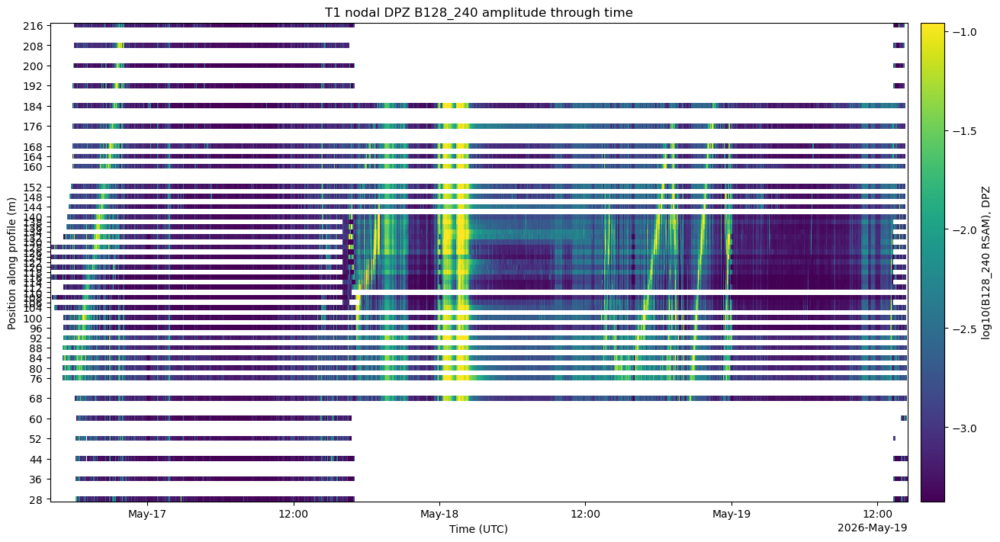

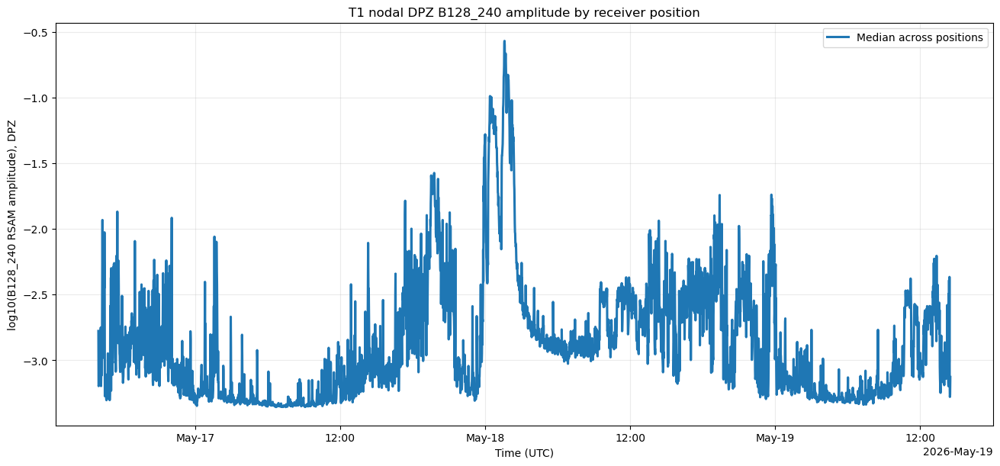

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T1_DPZ_B16_32_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T1_DPZ_B16_32_amplitude_timeseries.png


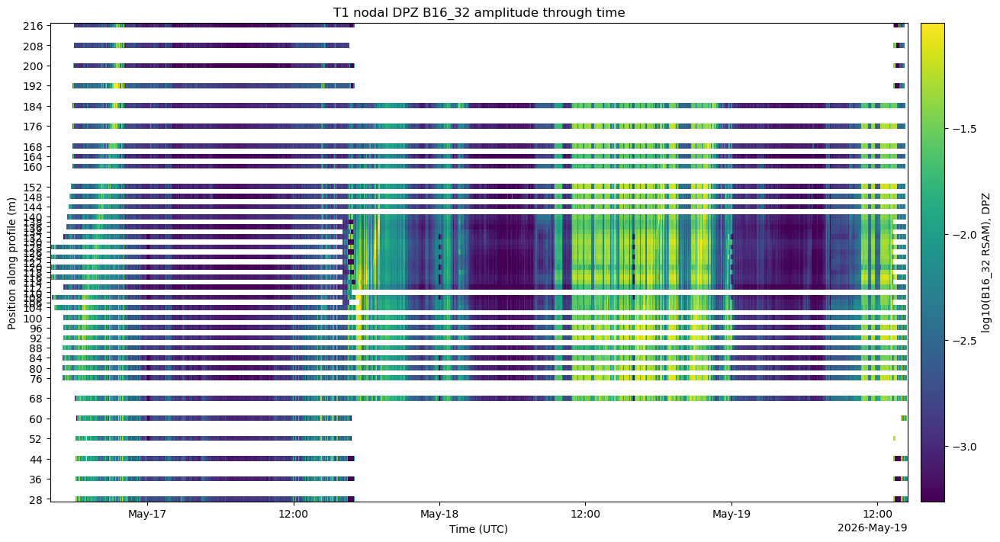

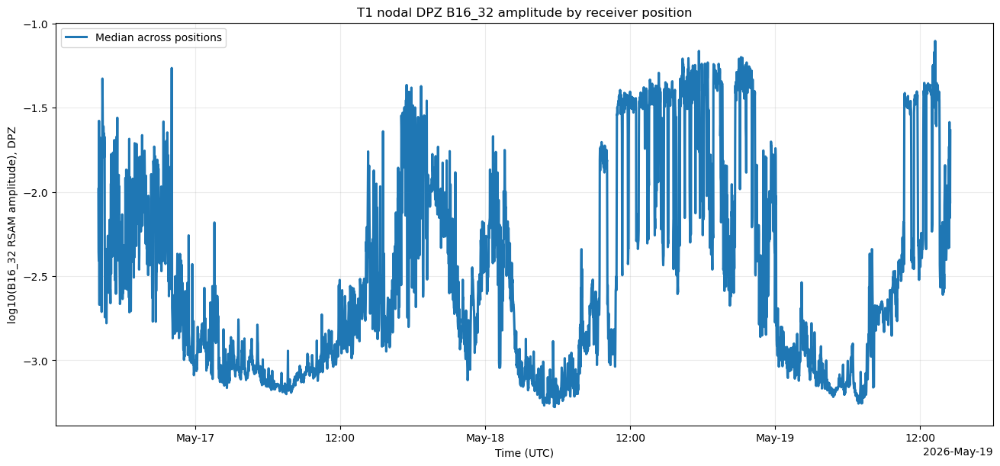

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T1_DPZ_B32_64_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T1_DPZ_B32_64_amplitude_timeseries.png


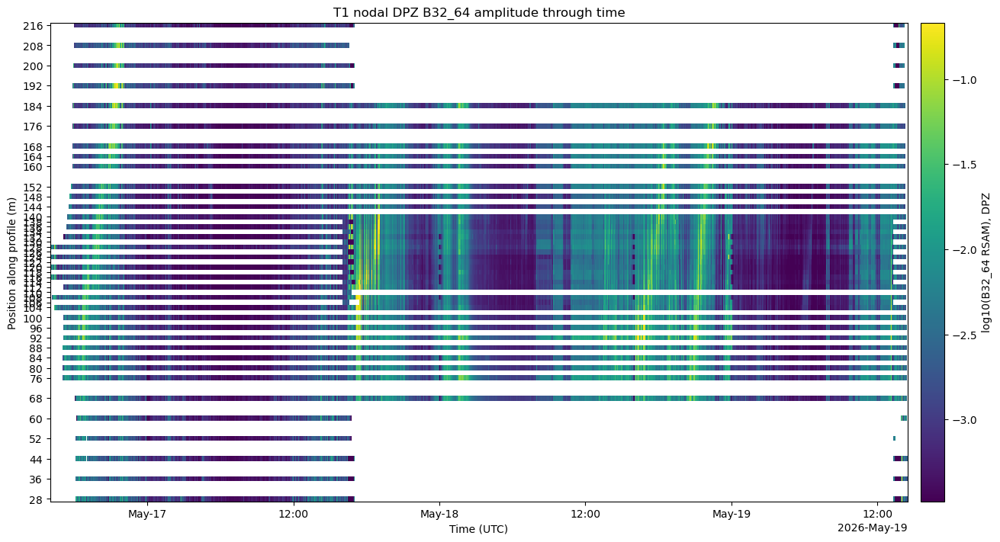

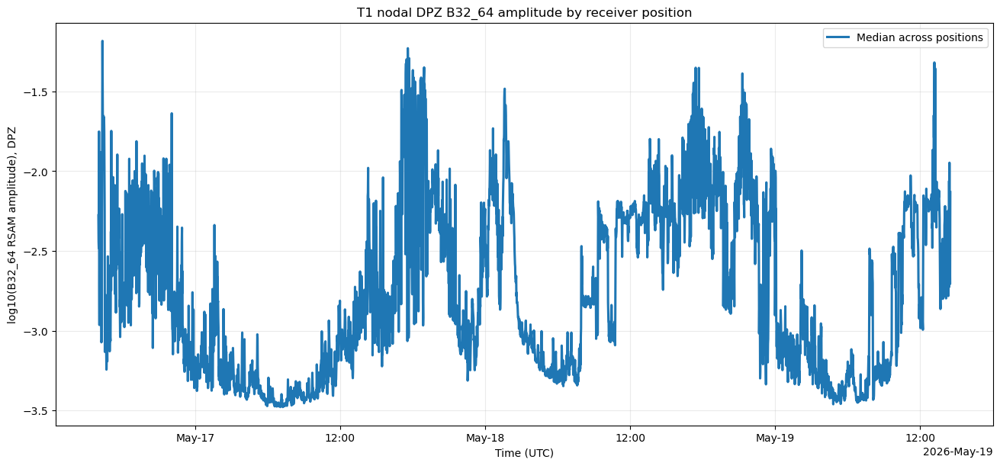

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T1_DPZ_B4_8_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T1_DPZ_B4_8_amplitude_timeseries.png


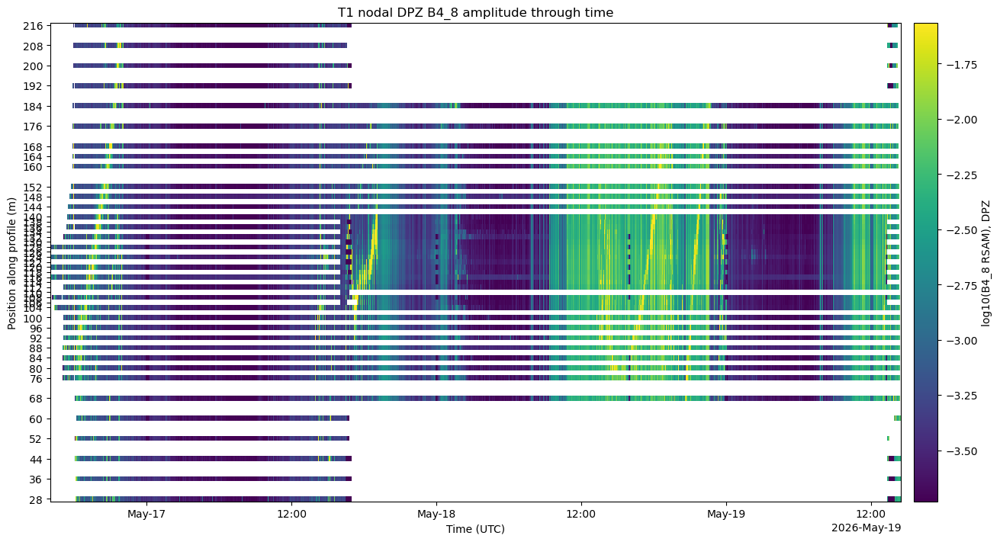

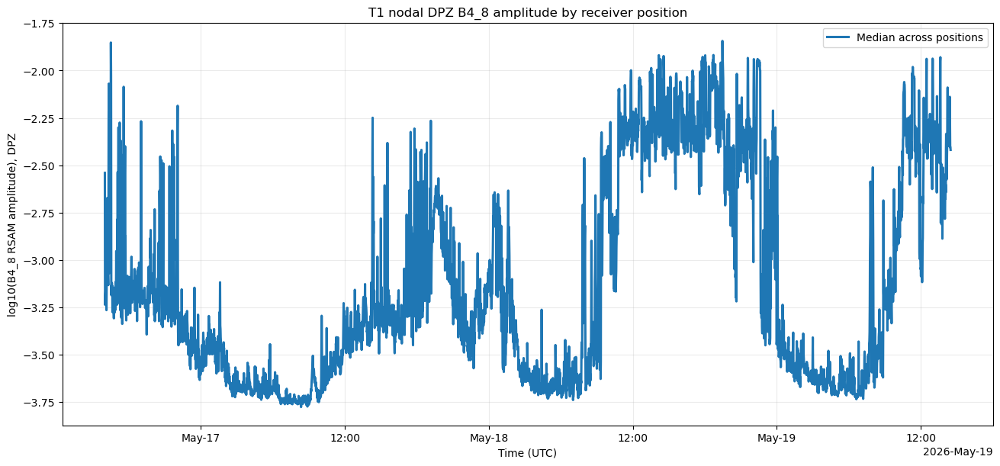

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T1_DPZ_B64_128_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T1_DPZ_B64_128_amplitude_timeseries.png


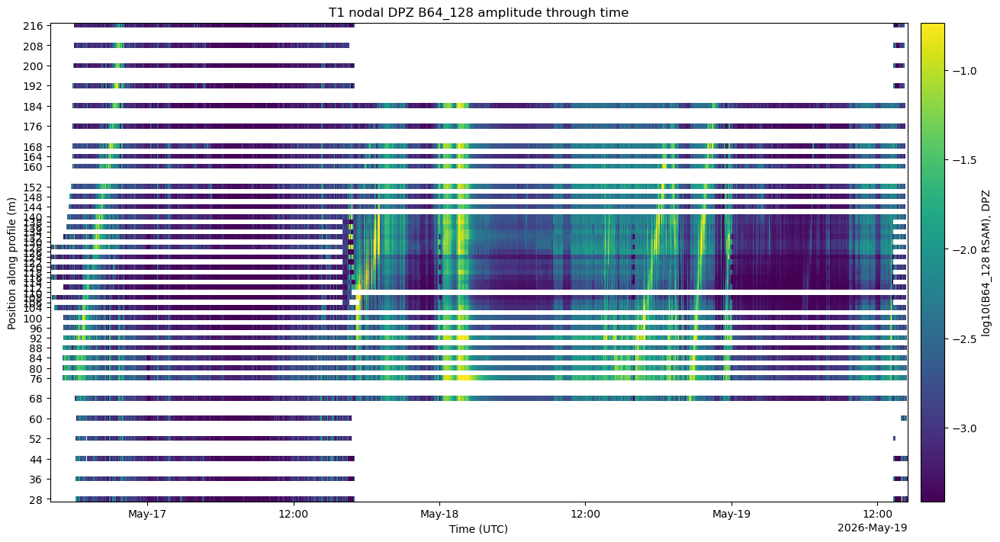

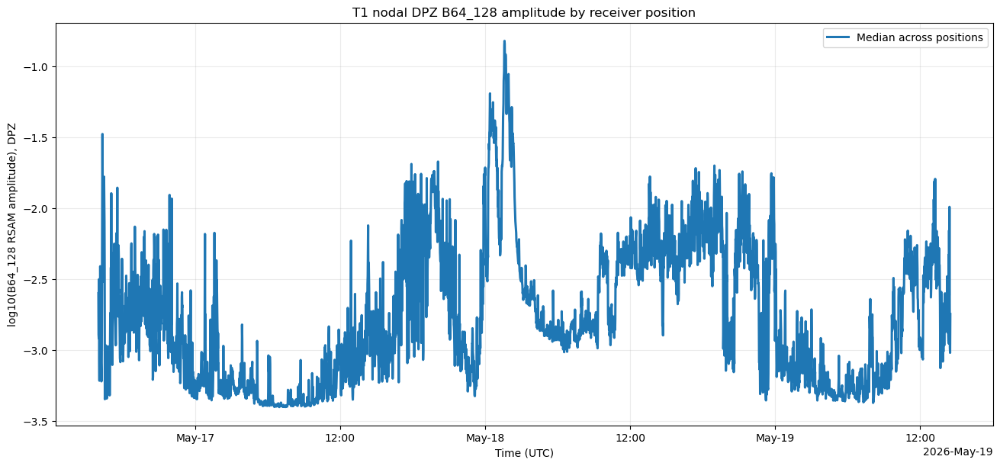

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T1_DPZ_B8_16_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T1_DPZ_B8_16_amplitude_timeseries.png


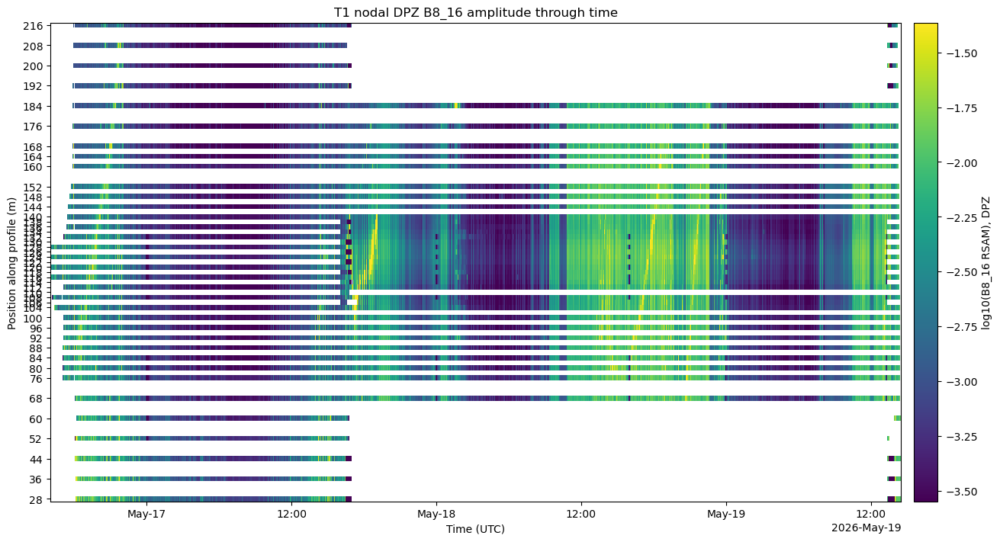

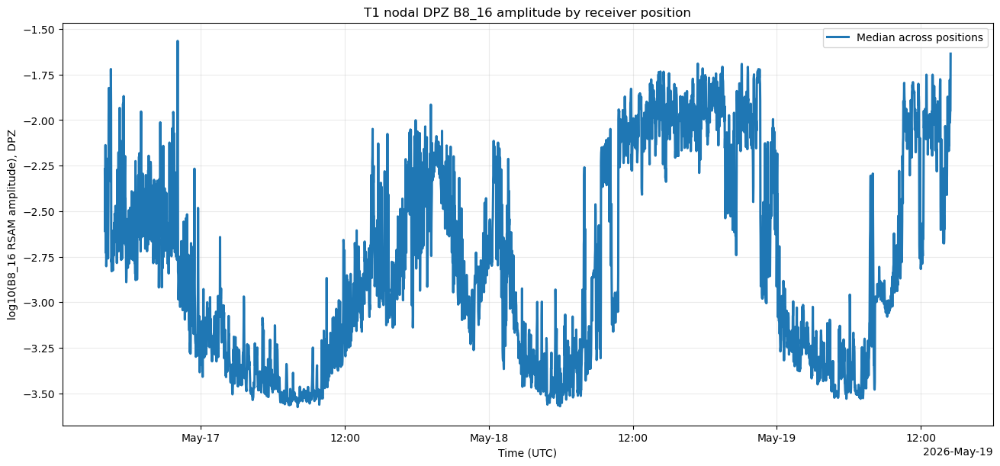

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T1_DPZ_max_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T1_DPZ_max_amplitude_timeseries.png


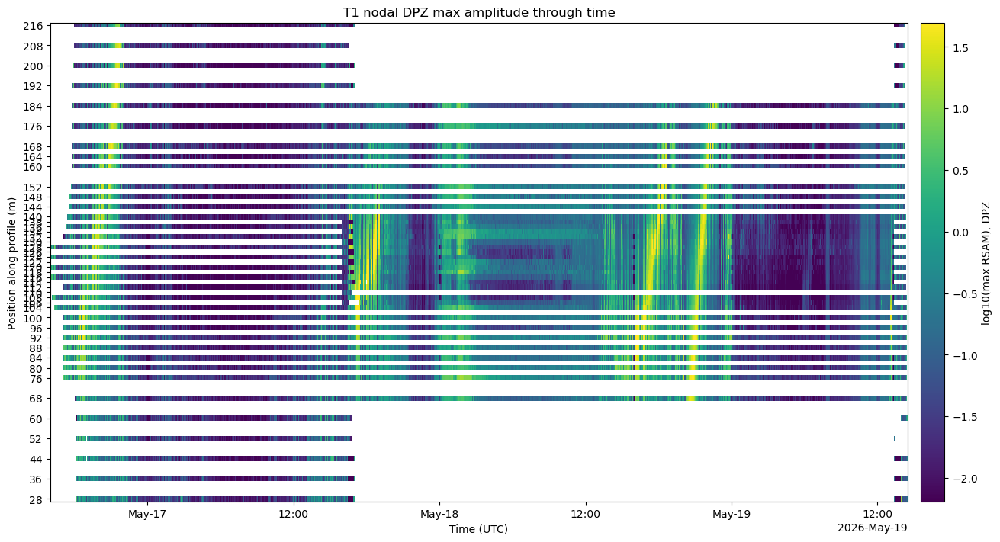

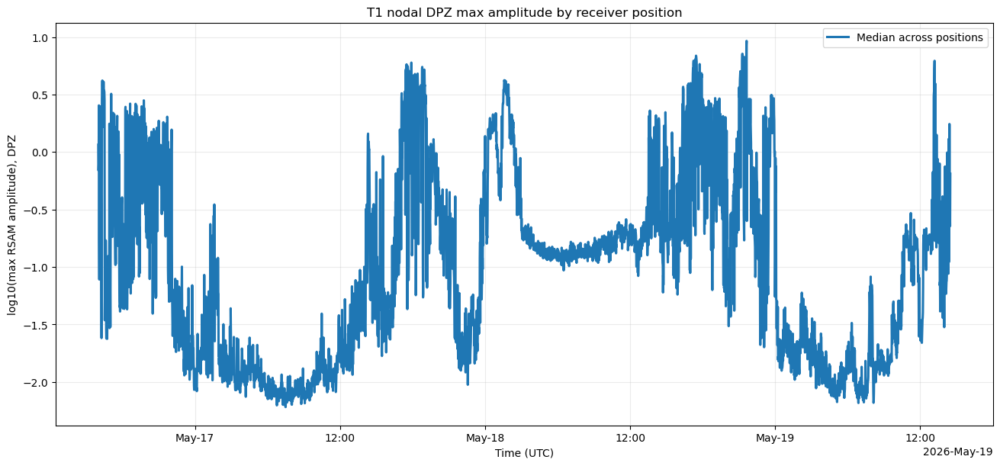

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T1_DPZ_mean_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T1_DPZ_mean_amplitude_timeseries.png


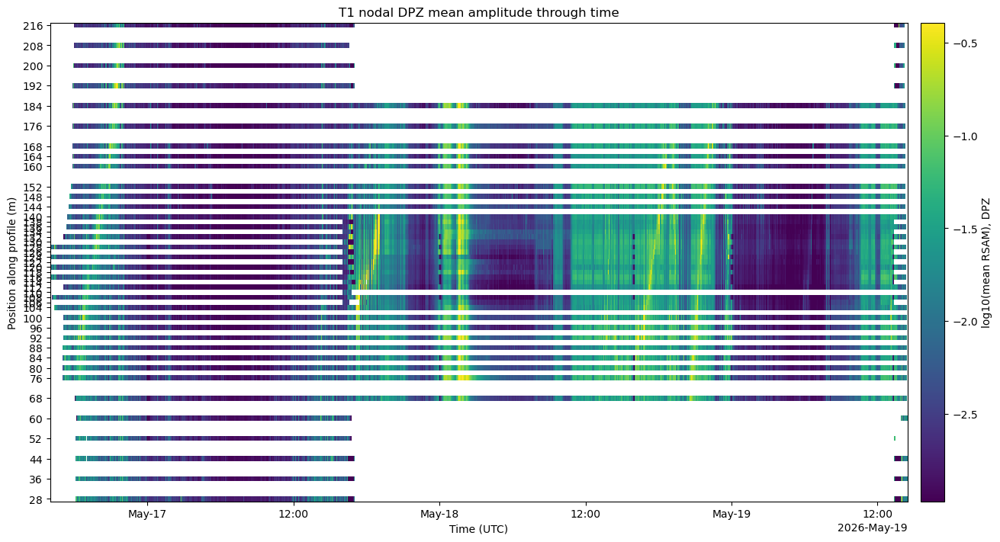

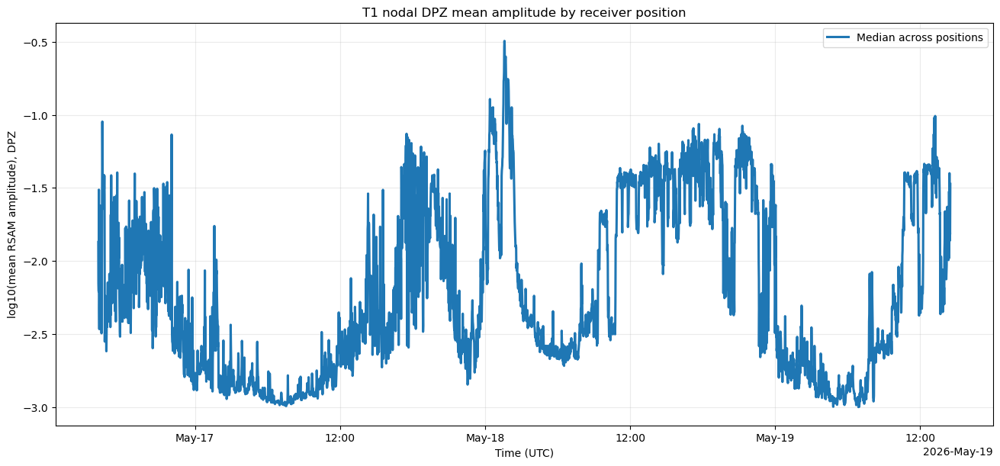

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T1_DPZ_median_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T1_DPZ_median_amplitude_timeseries.png


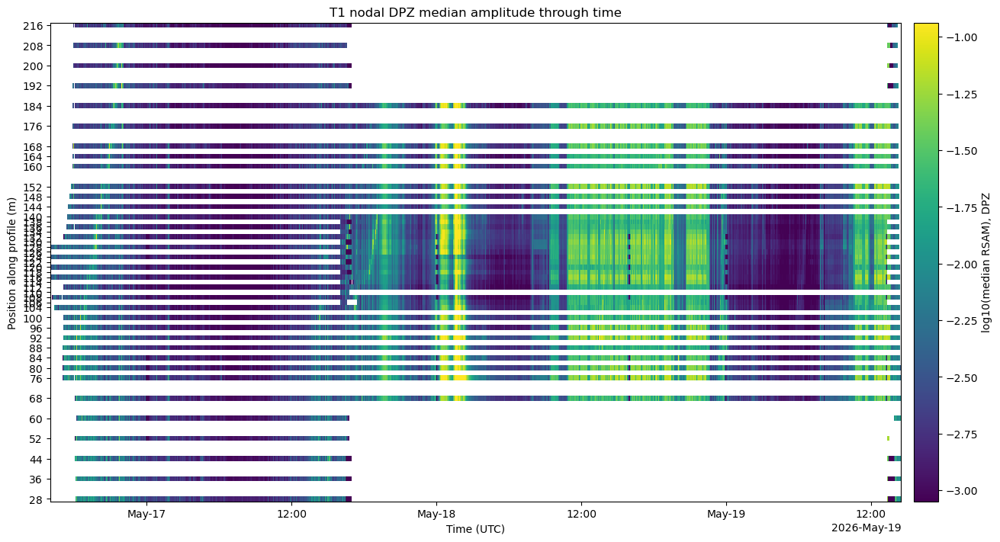

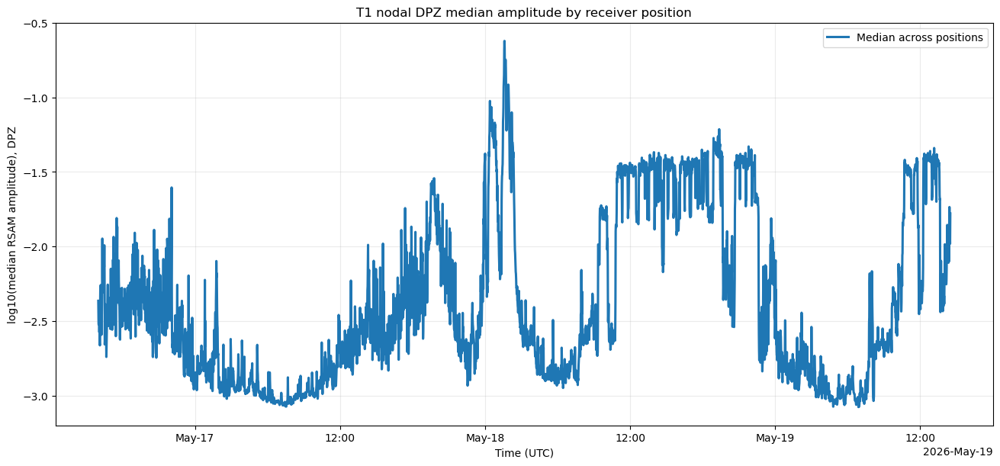

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T1_DPZ_min_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T1_DPZ_min_amplitude_timeseries.png


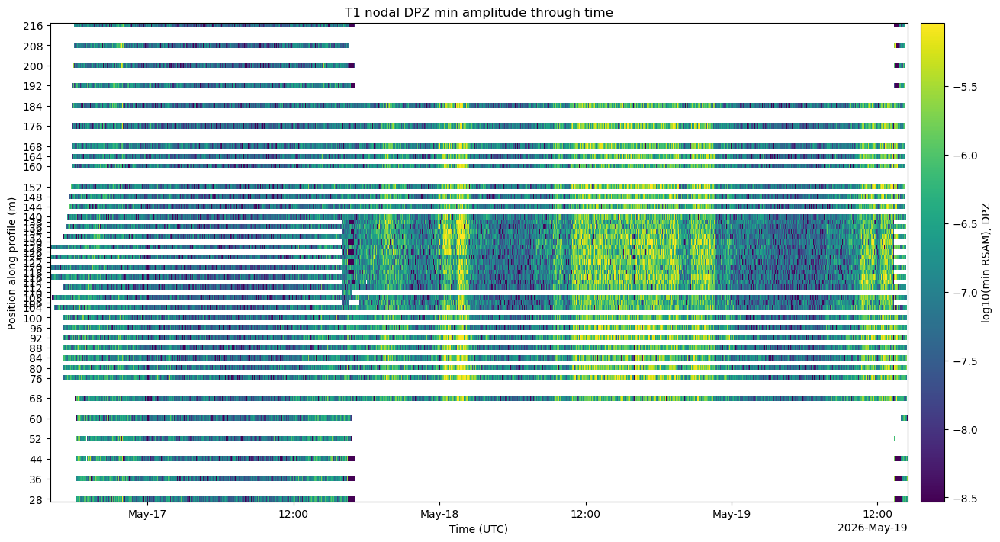

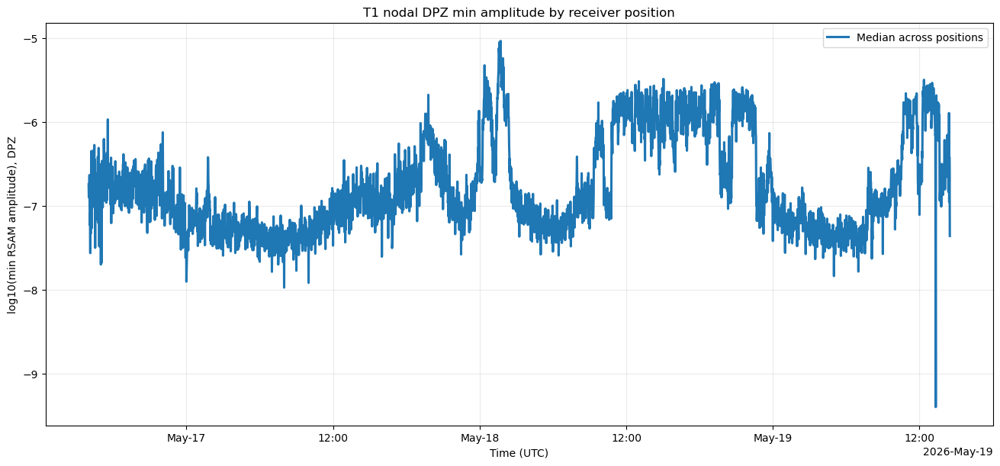

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T1_DPZ_rms_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T1_DPZ_rms_amplitude_timeseries.png


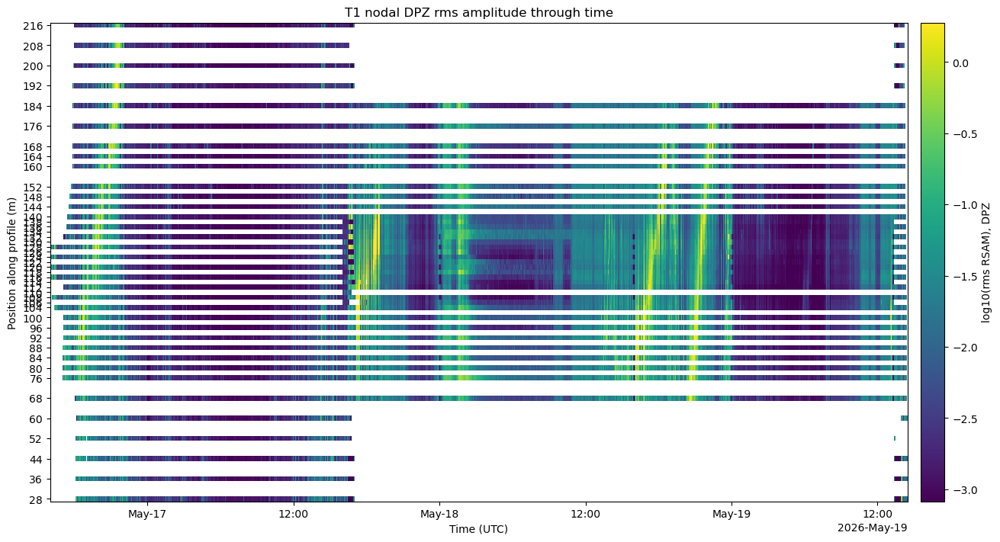

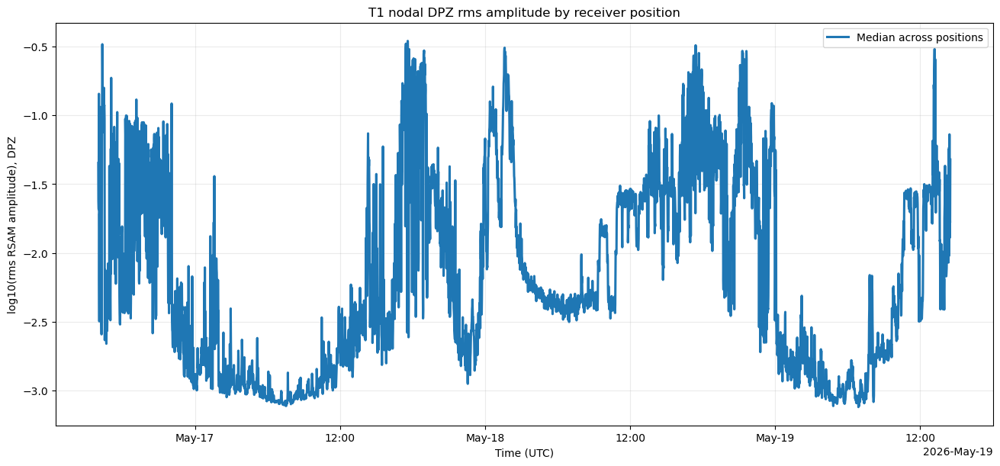

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T1_DPN_B128_240_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T1_DPN_B128_240_amplitude_timeseries.png


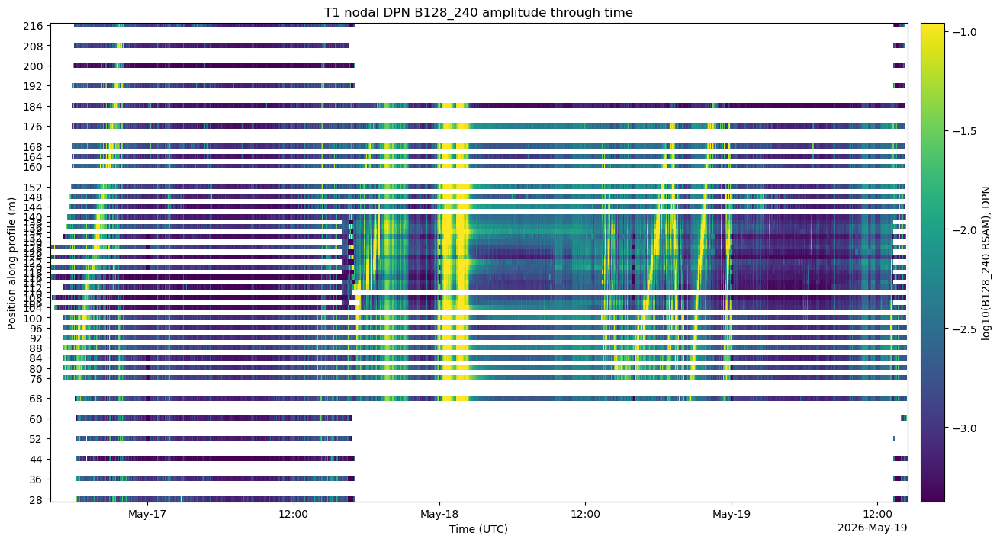

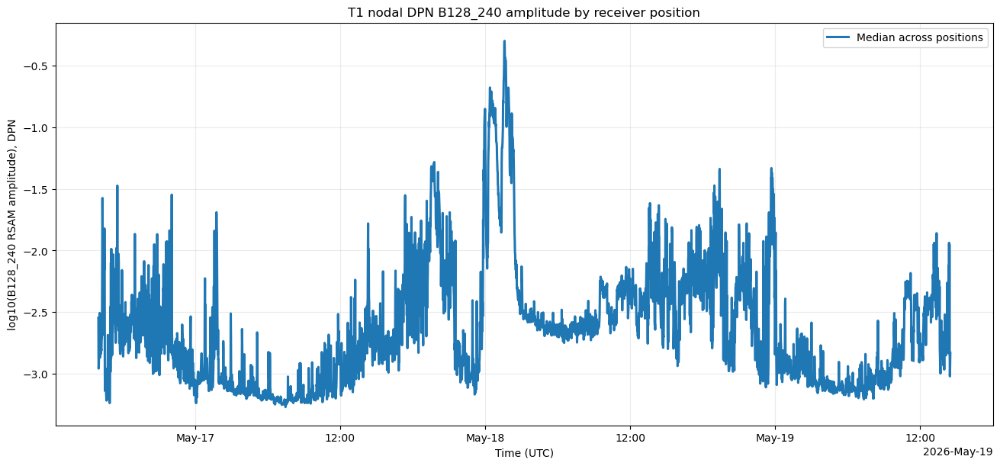

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T1_DPN_B16_32_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T1_DPN_B16_32_amplitude_timeseries.png


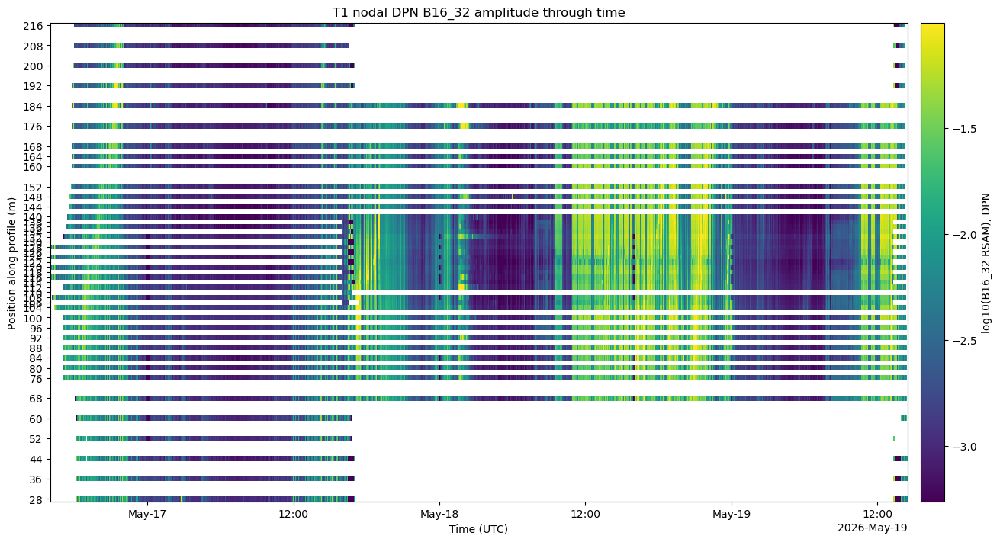

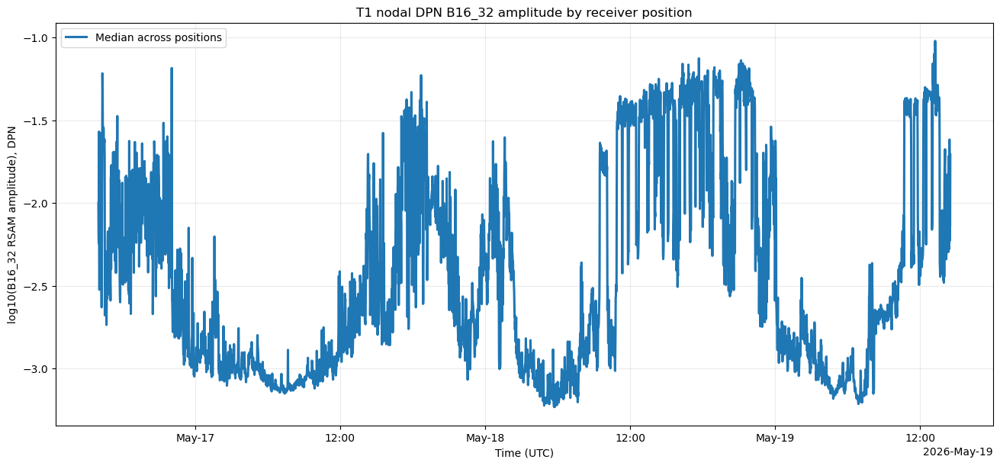

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T1_DPN_B32_64_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T1_DPN_B32_64_amplitude_timeseries.png


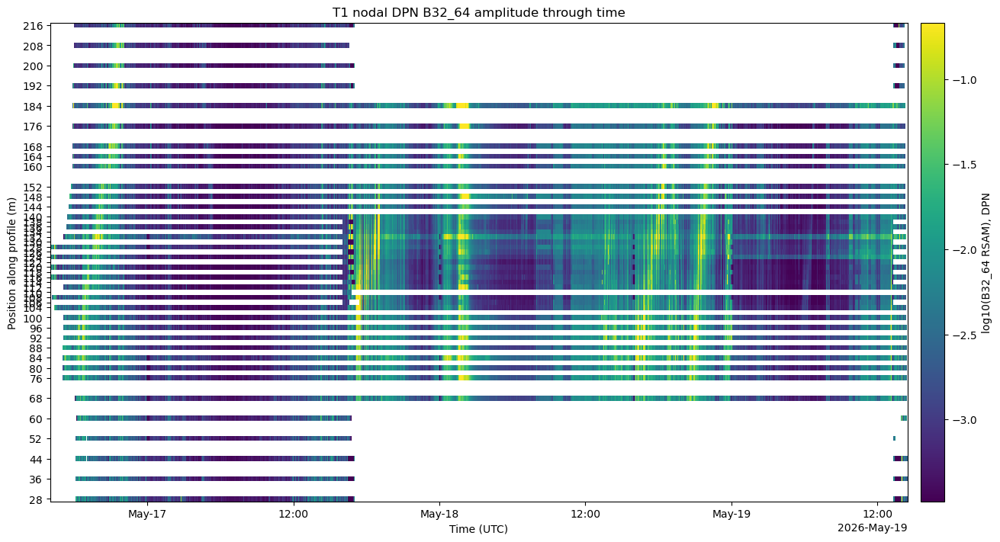

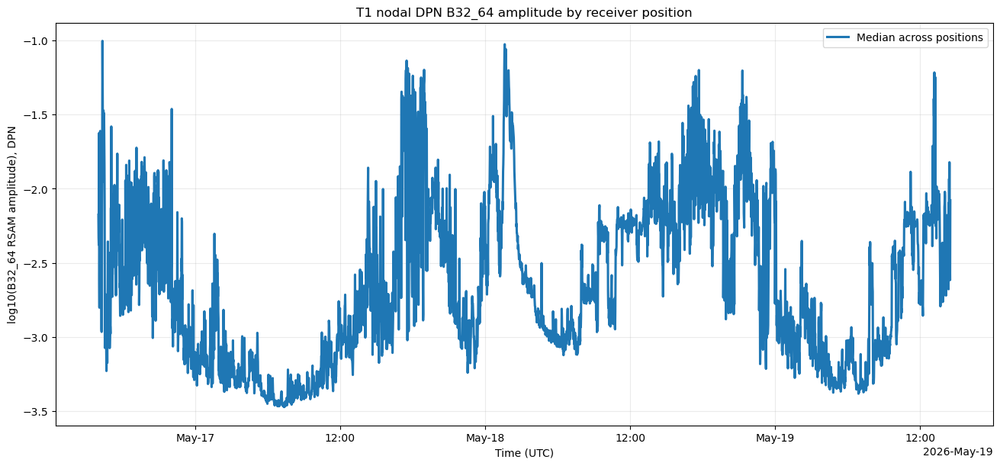

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T1_DPN_B4_8_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T1_DPN_B4_8_amplitude_timeseries.png


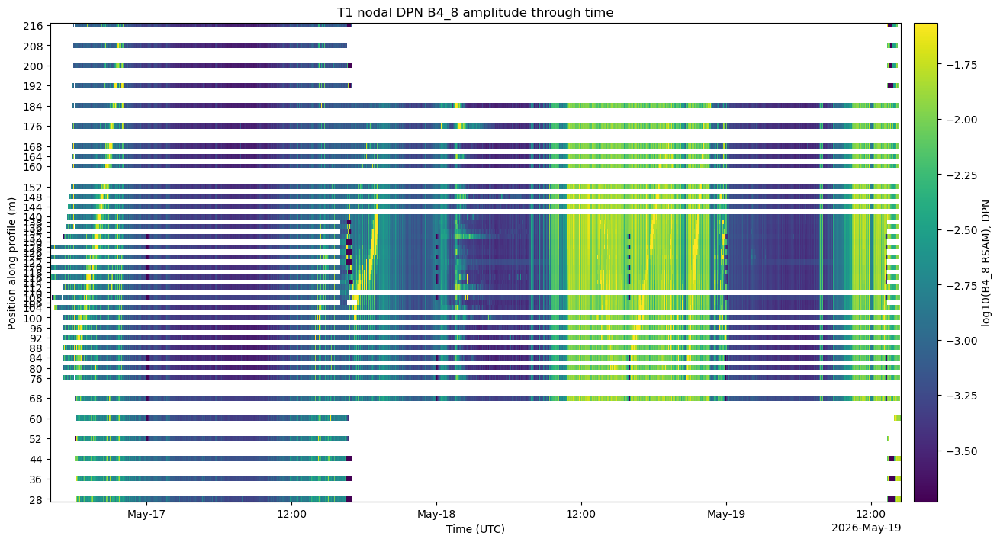

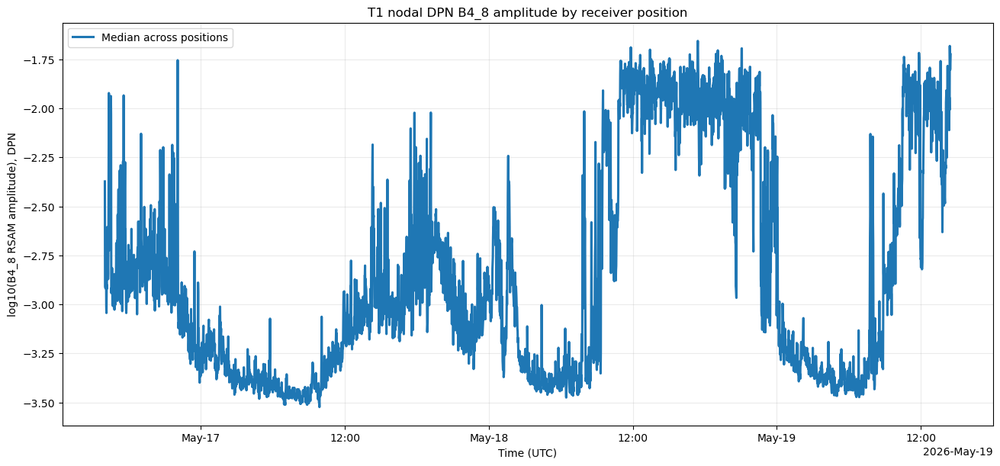

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T1_DPN_B64_128_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T1_DPN_B64_128_amplitude_timeseries.png


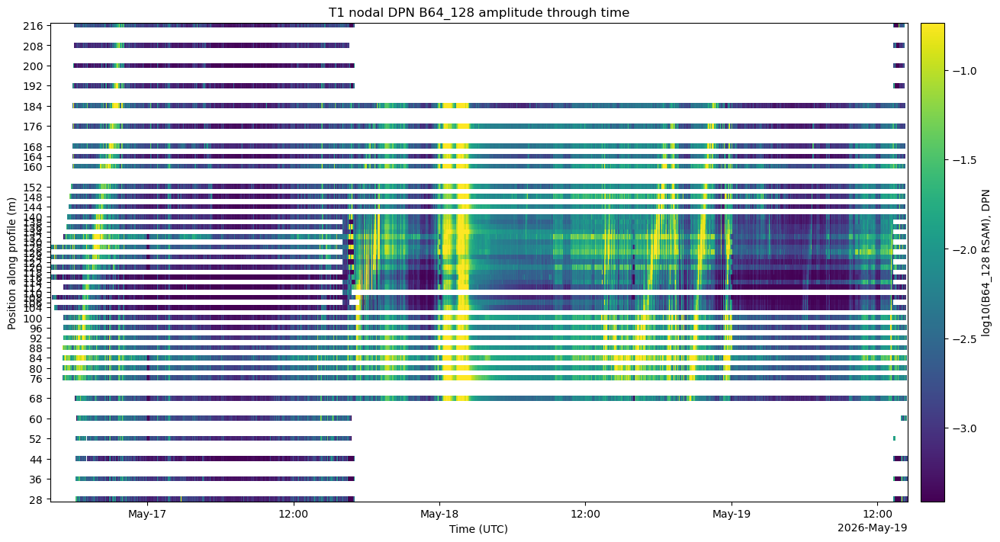

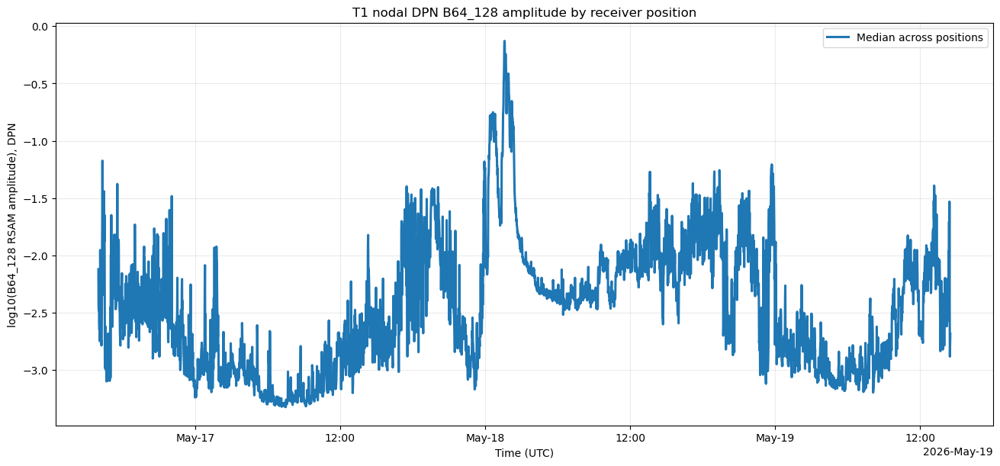

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T1_DPN_B8_16_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T1_DPN_B8_16_amplitude_timeseries.png


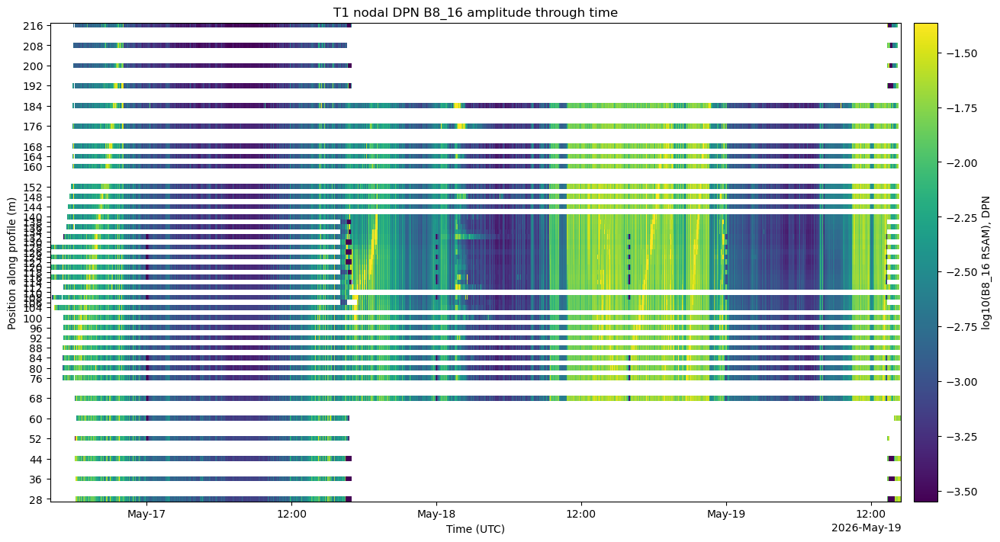

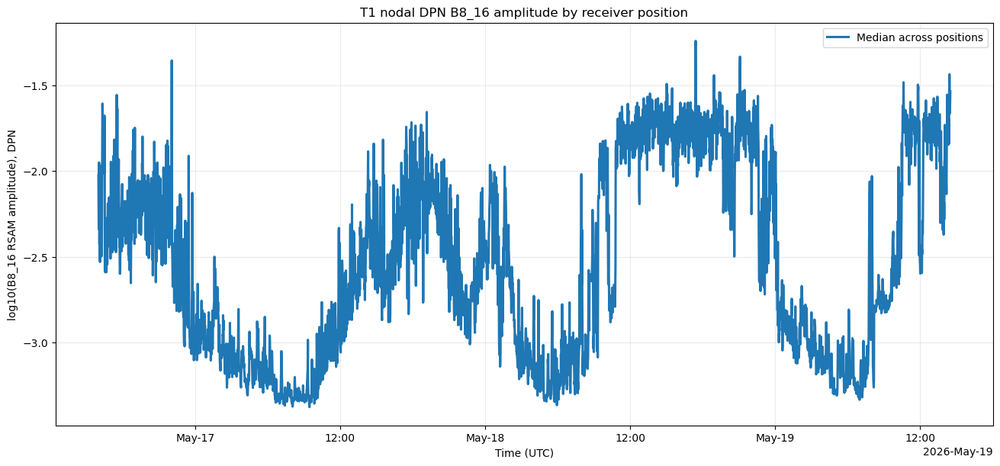

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T1_DPN_max_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T1_DPN_max_amplitude_timeseries.png


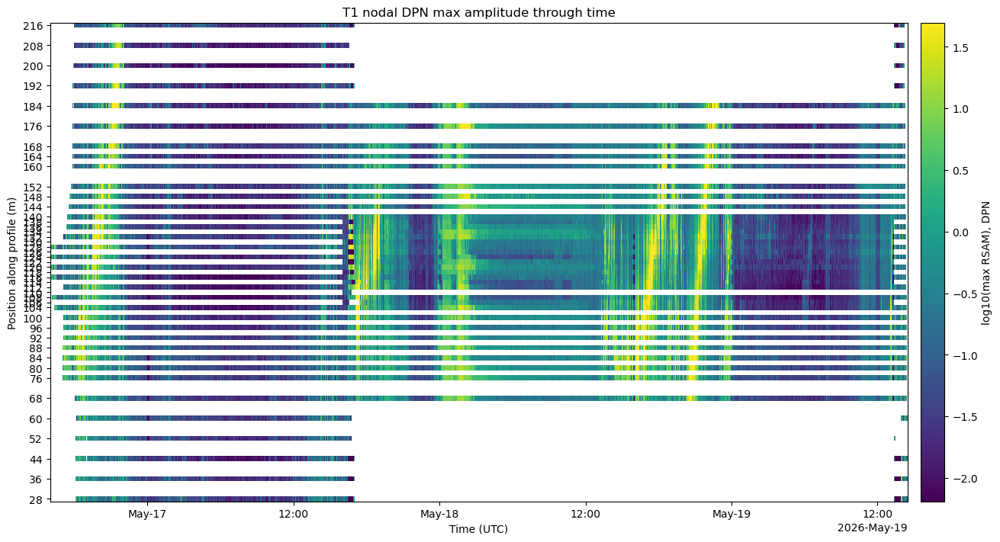

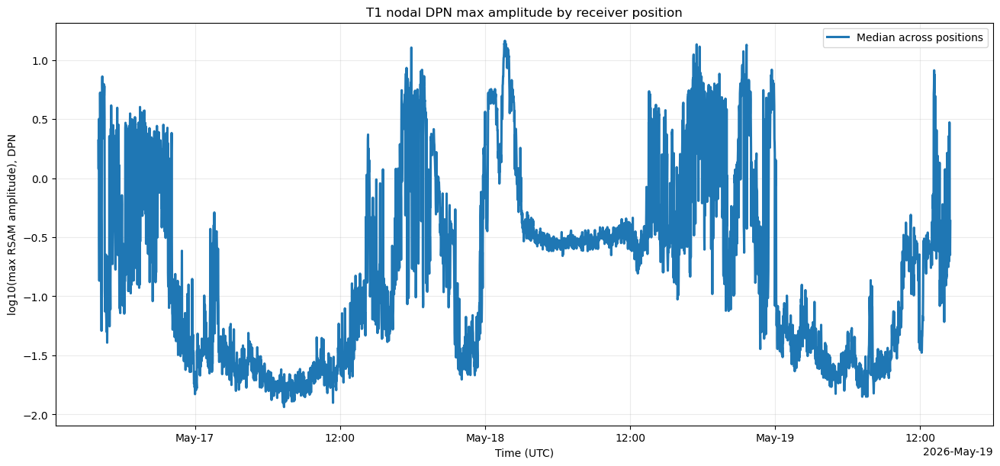

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T1_DPN_mean_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T1_DPN_mean_amplitude_timeseries.png


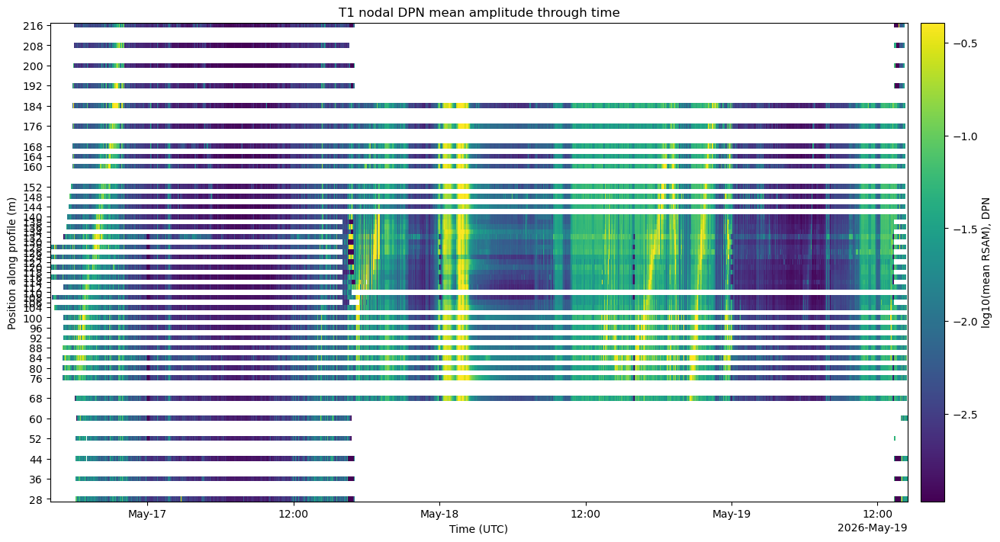

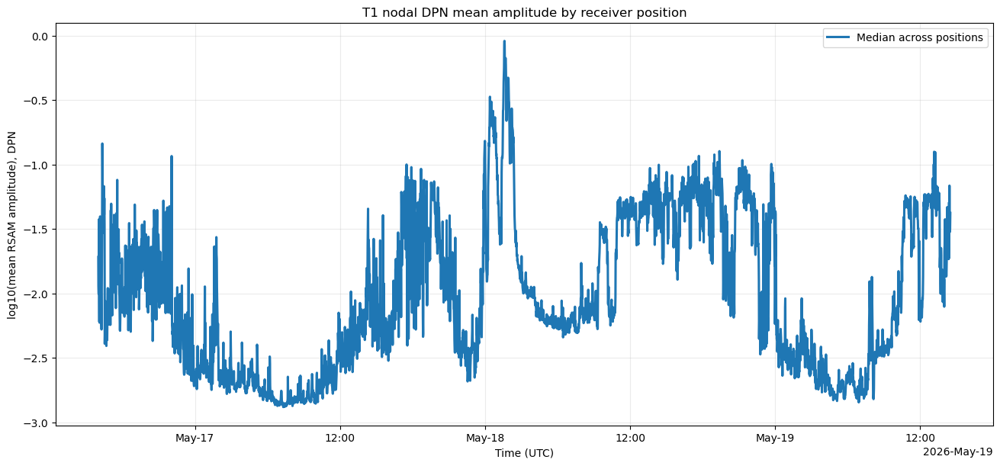

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T1_DPN_median_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T1_DPN_median_amplitude_timeseries.png


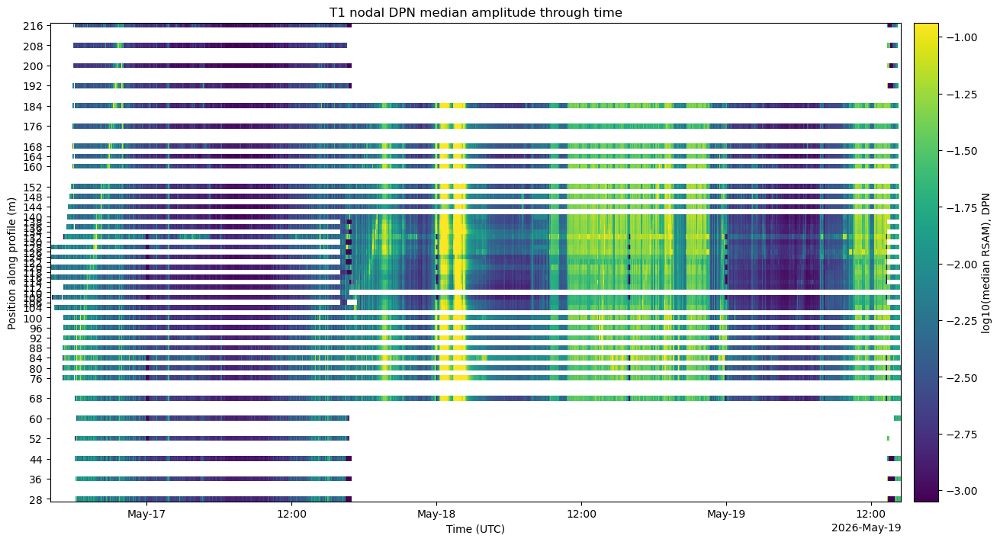

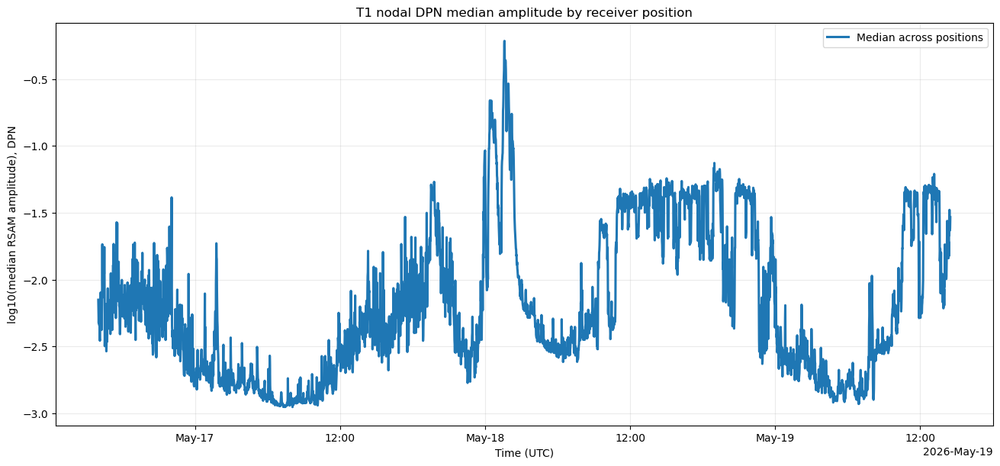

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T1_DPN_min_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T1_DPN_min_amplitude_timeseries.png


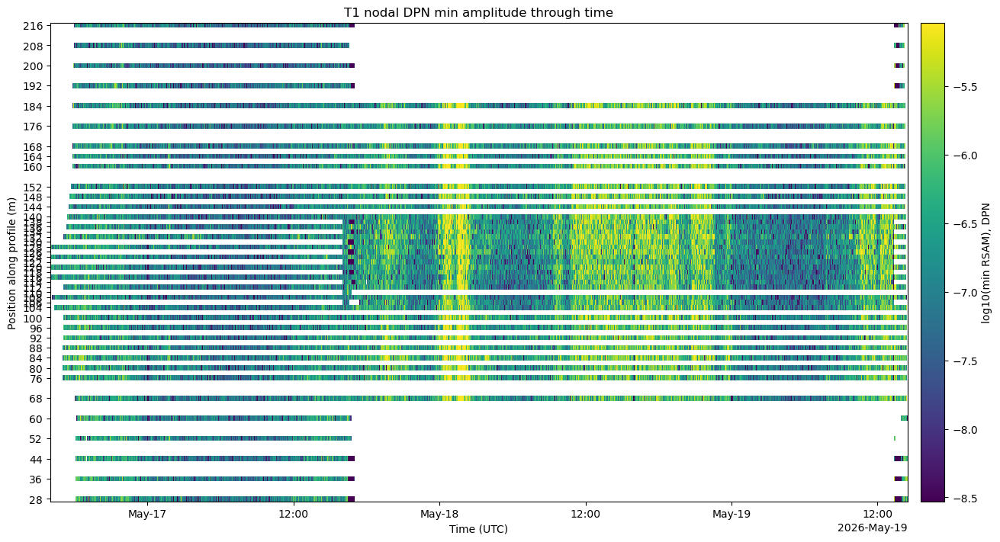

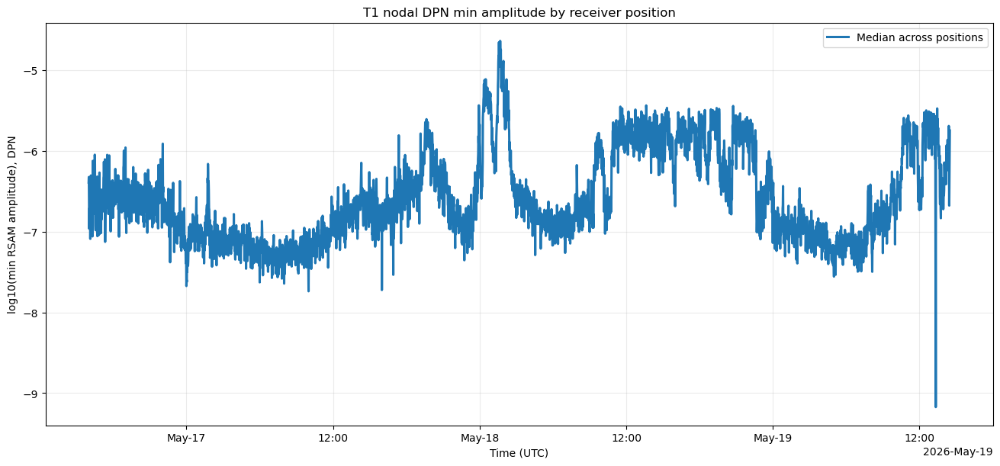

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T1_DPN_rms_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T1_DPN_rms_amplitude_timeseries.png


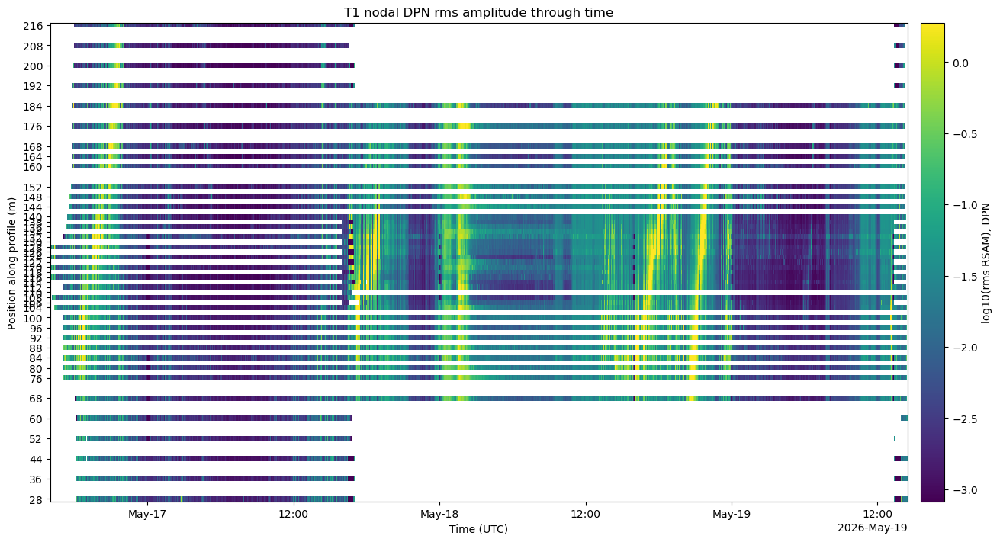

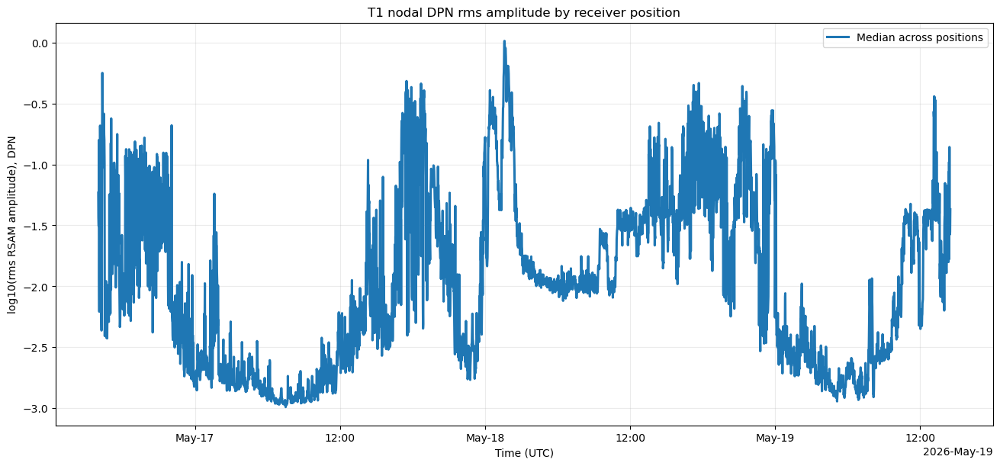

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T1_DPE_B128_240_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T1_DPE_B128_240_amplitude_timeseries.png


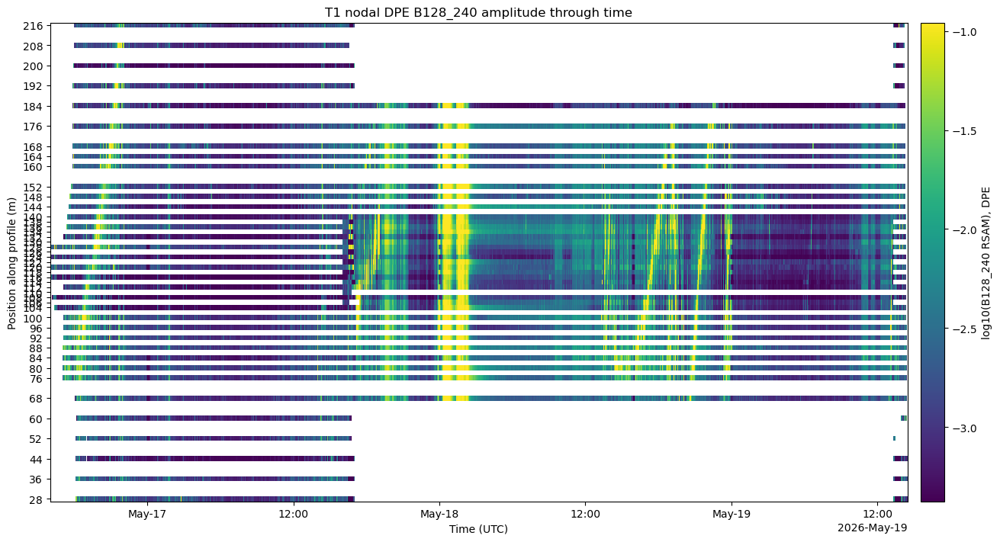

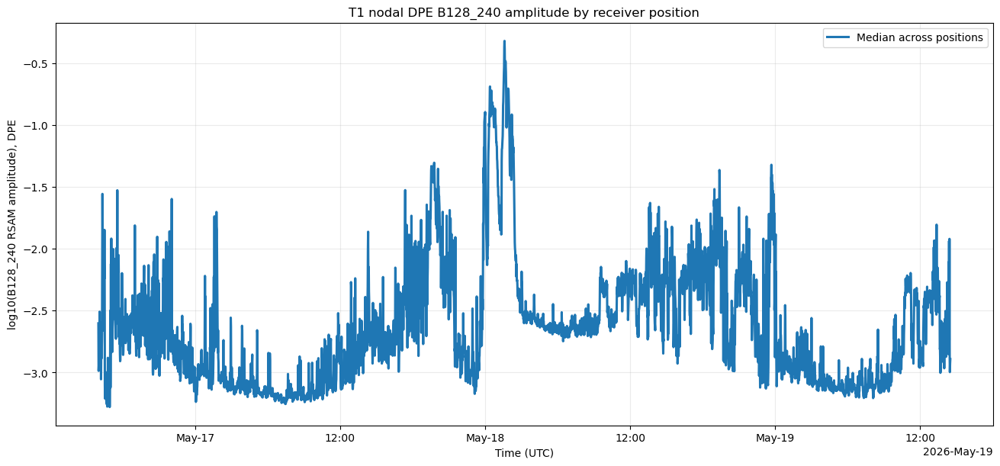

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T1_DPE_B16_32_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T1_DPE_B16_32_amplitude_timeseries.png


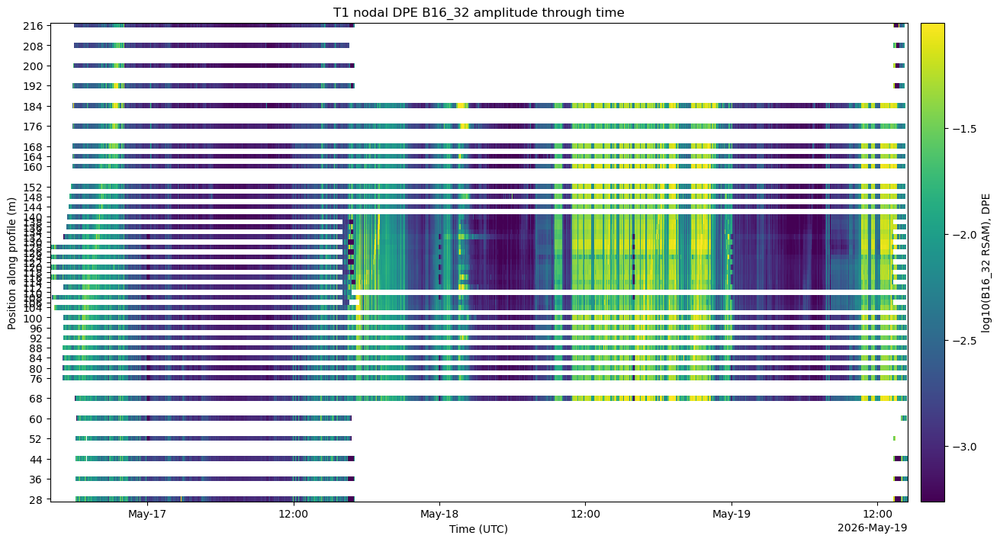

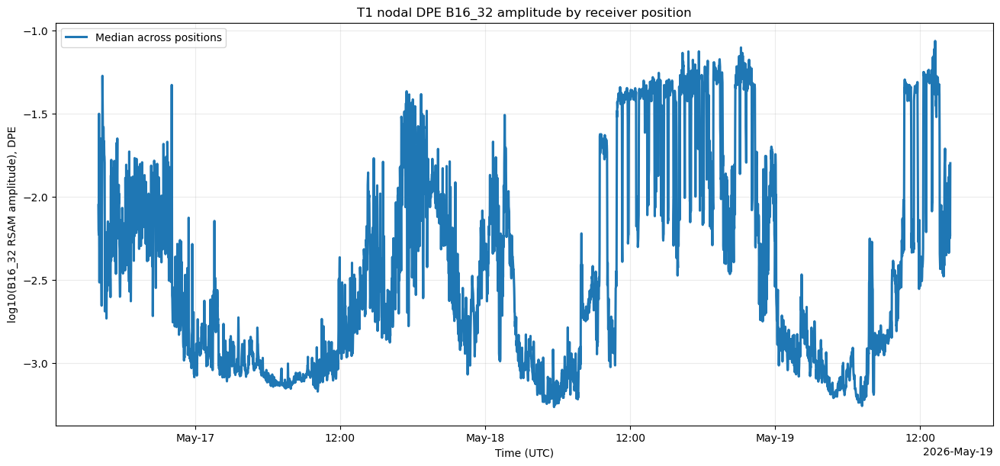

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T1_DPE_B32_64_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T1_DPE_B32_64_amplitude_timeseries.png


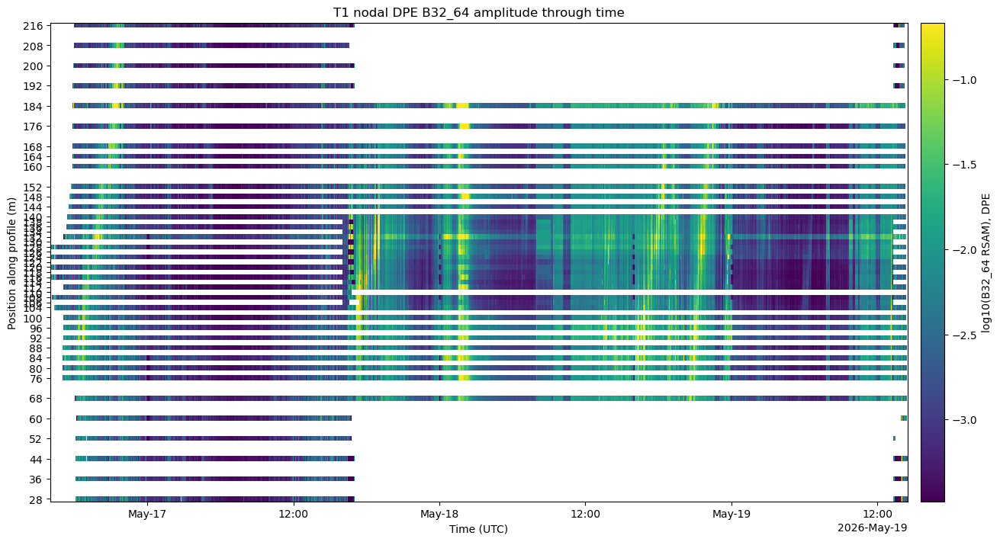

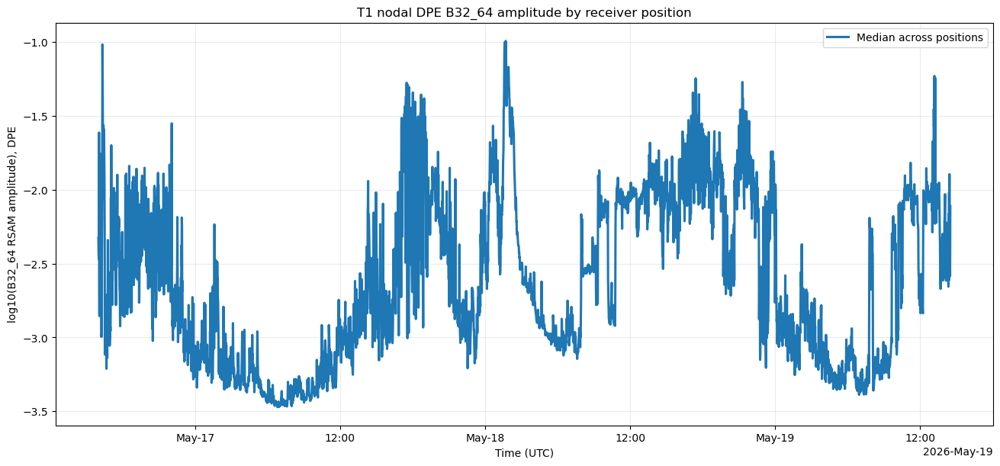

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T1_DPE_B4_8_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T1_DPE_B4_8_amplitude_timeseries.png


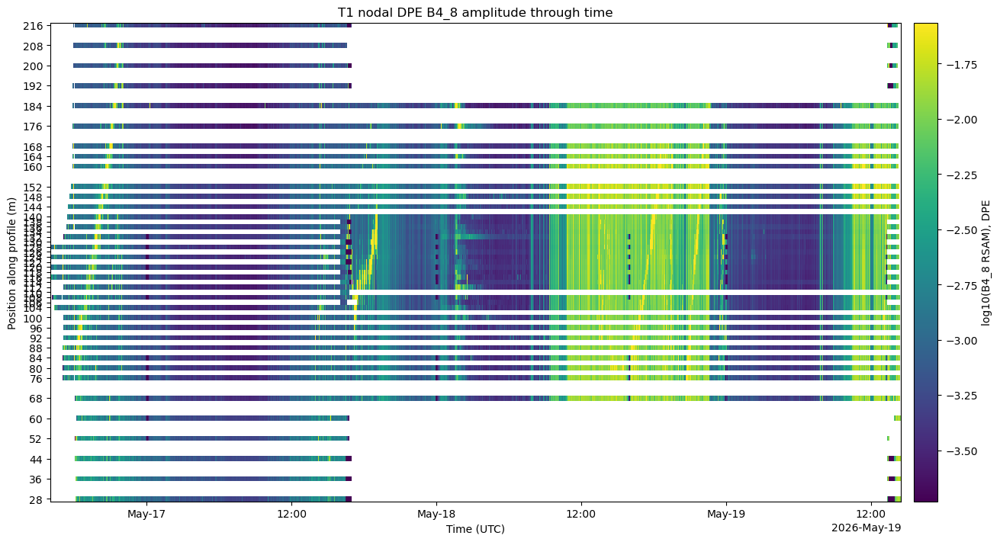

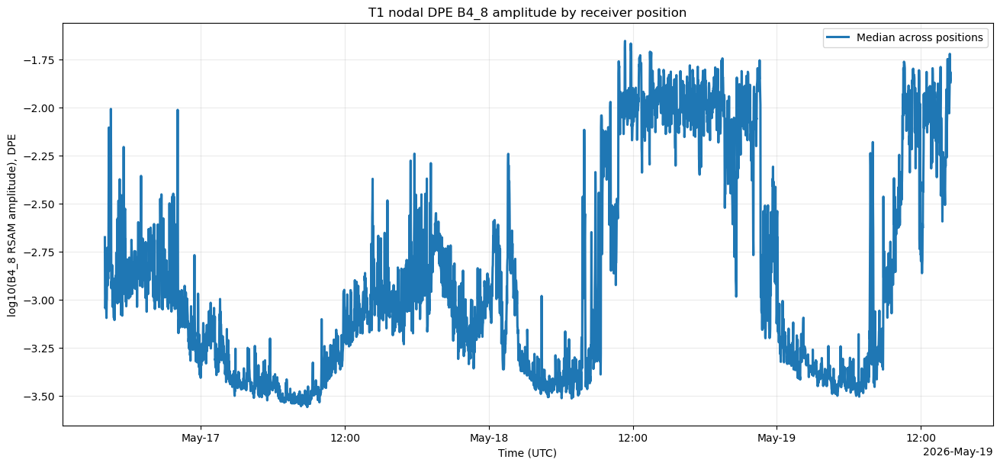

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T1_DPE_B64_128_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T1_DPE_B64_128_amplitude_timeseries.png


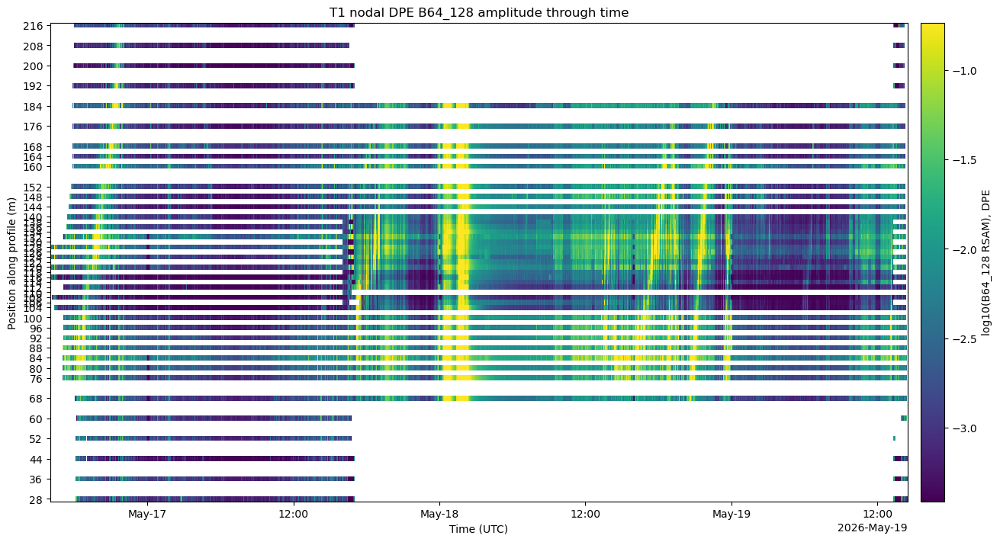

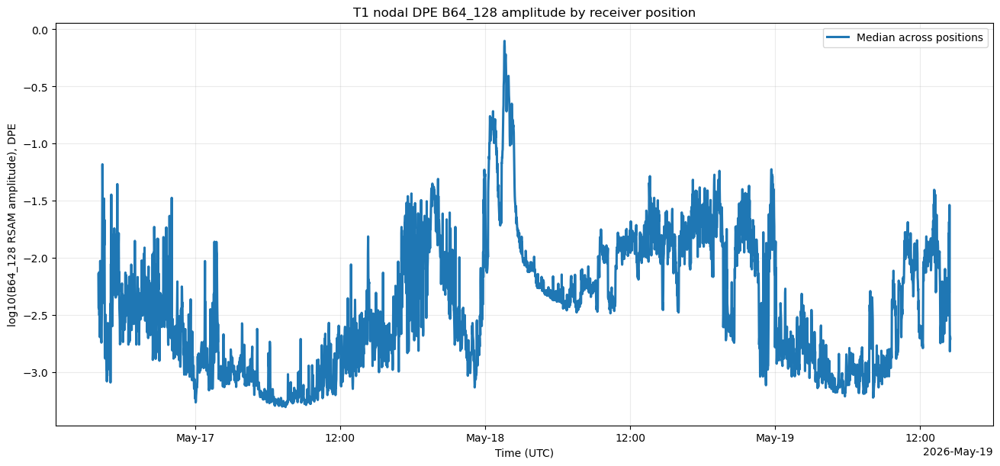

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T1_DPE_B8_16_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T1_DPE_B8_16_amplitude_timeseries.png


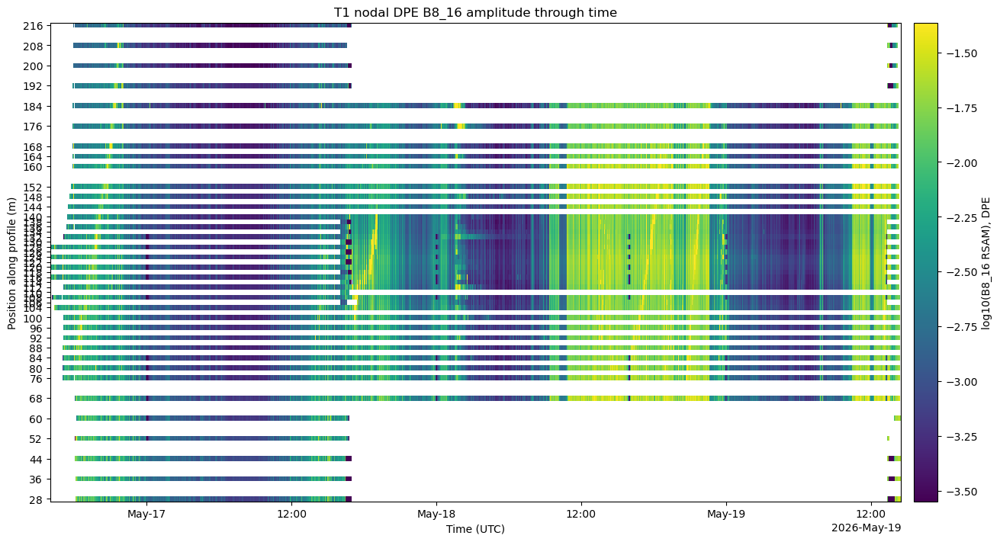

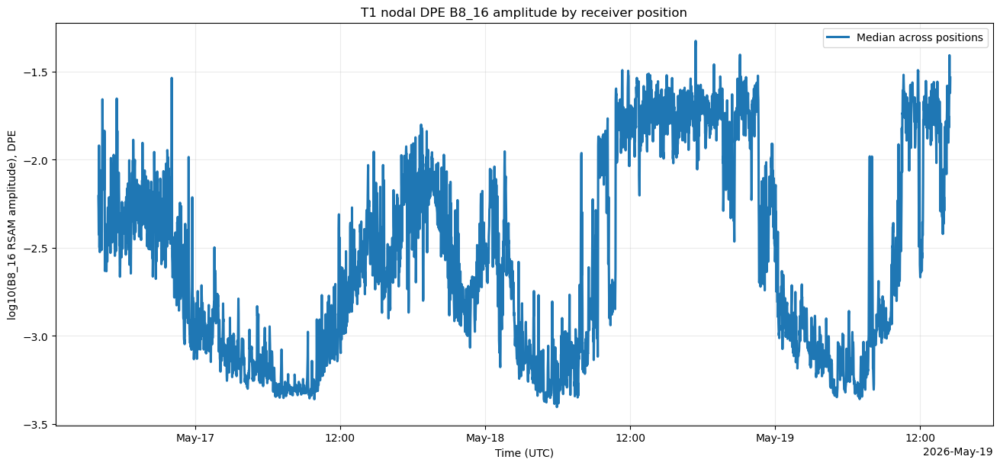

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T1_DPE_max_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T1_DPE_max_amplitude_timeseries.png


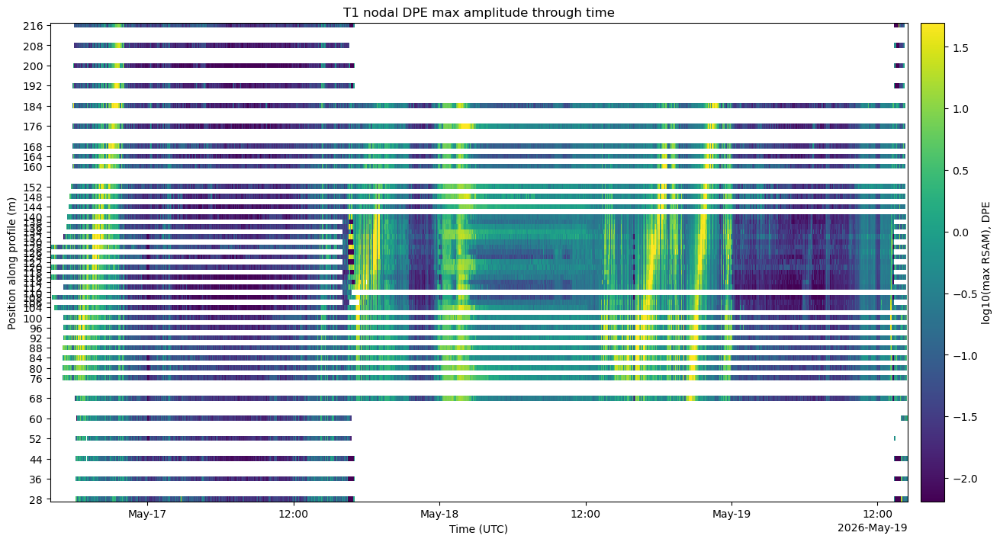

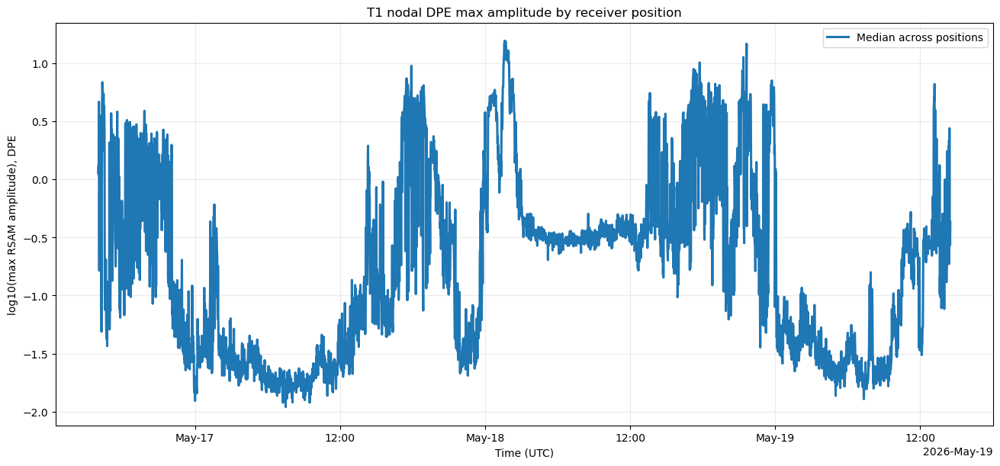

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T1_DPE_mean_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T1_DPE_mean_amplitude_timeseries.png


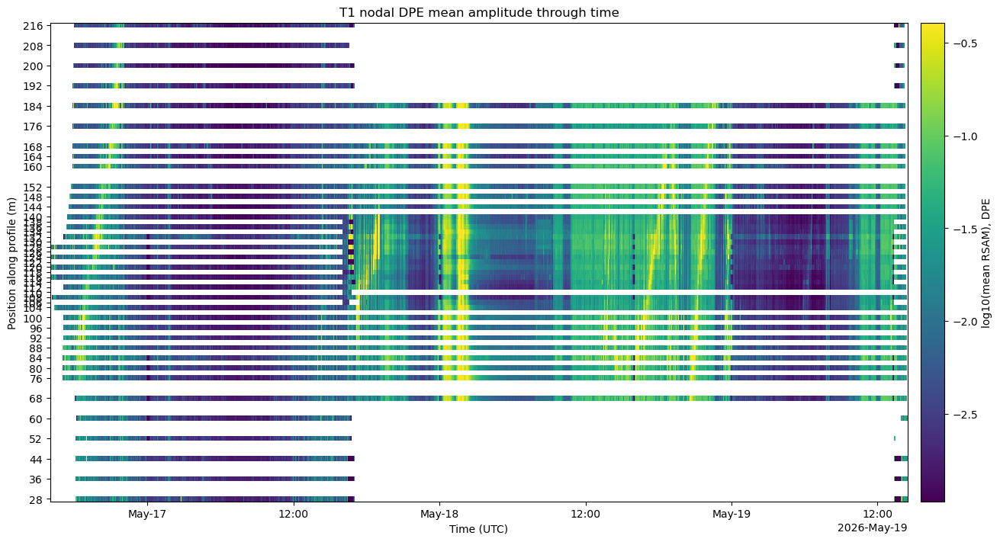

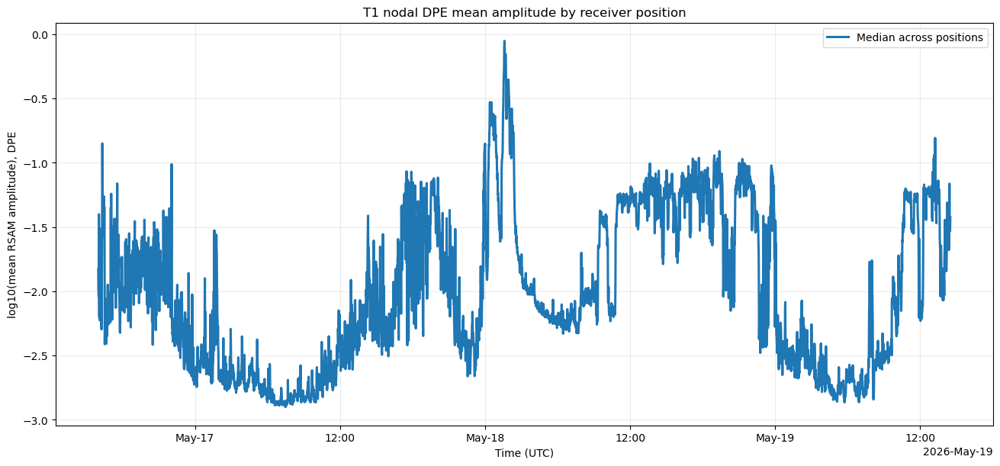

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T1_DPE_median_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T1_DPE_median_amplitude_timeseries.png


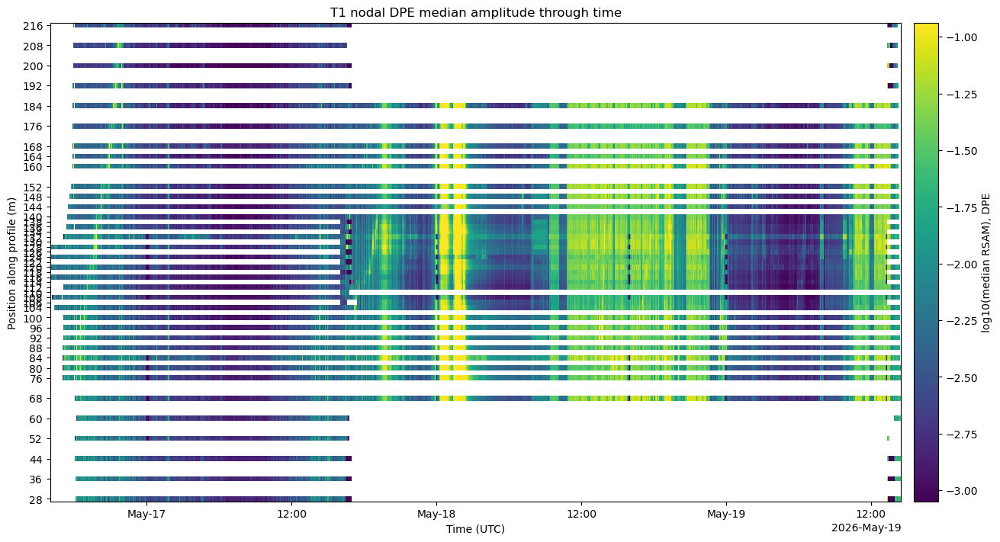

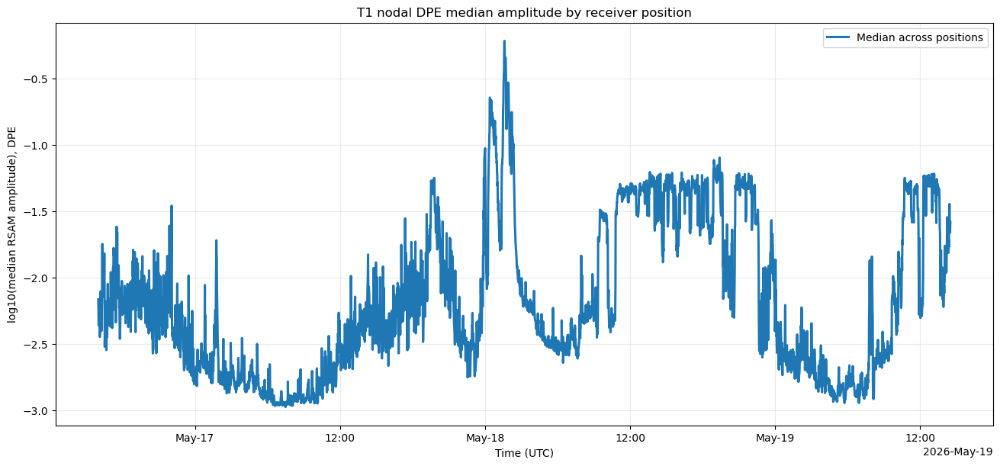

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T1_DPE_min_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T1_DPE_min_amplitude_timeseries.png


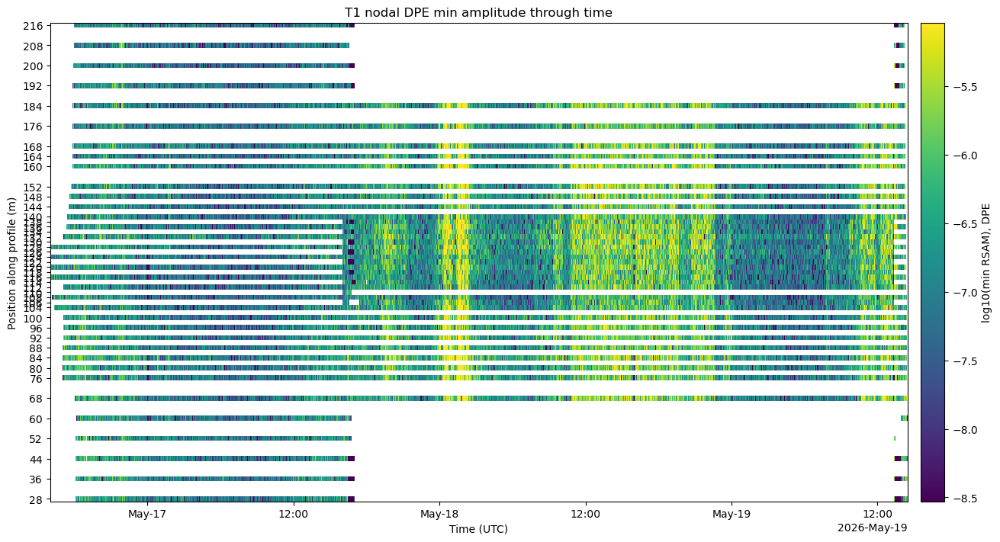

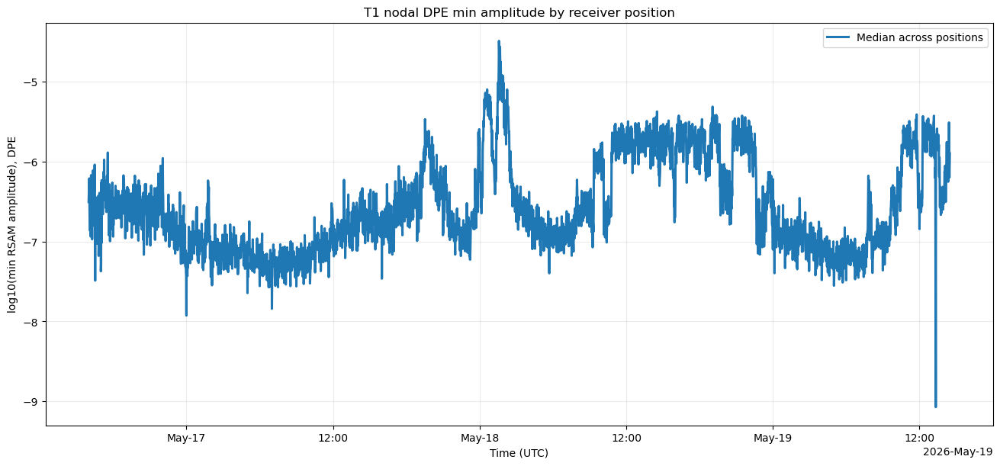

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T1_DPE_rms_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T1_DPE_rms_amplitude_timeseries.png


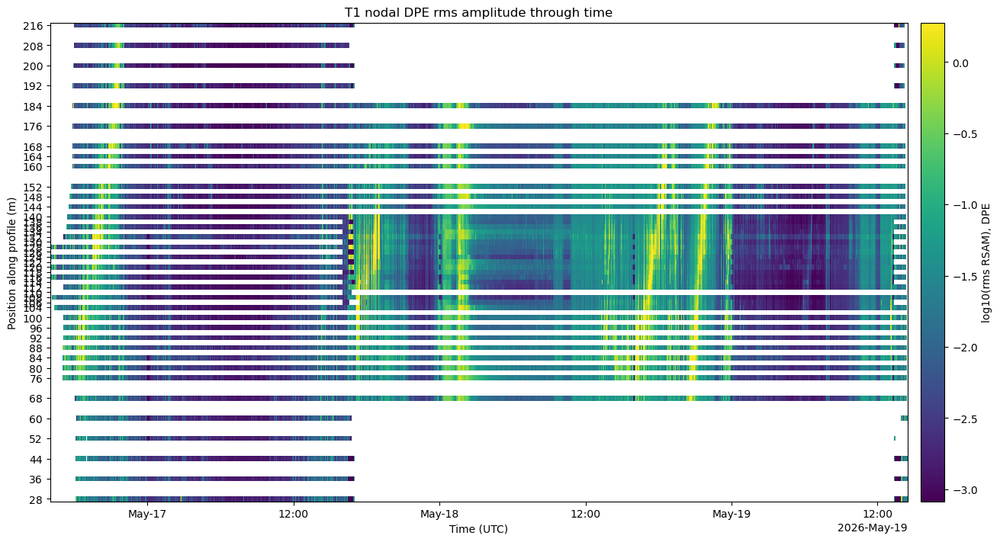

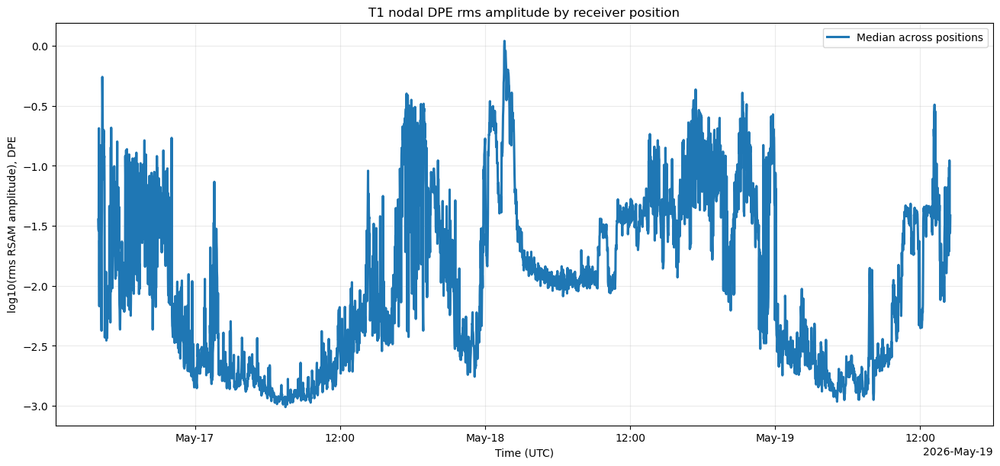

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T3_DPZ_B128_240_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T3_DPZ_B128_240_amplitude_timeseries.png


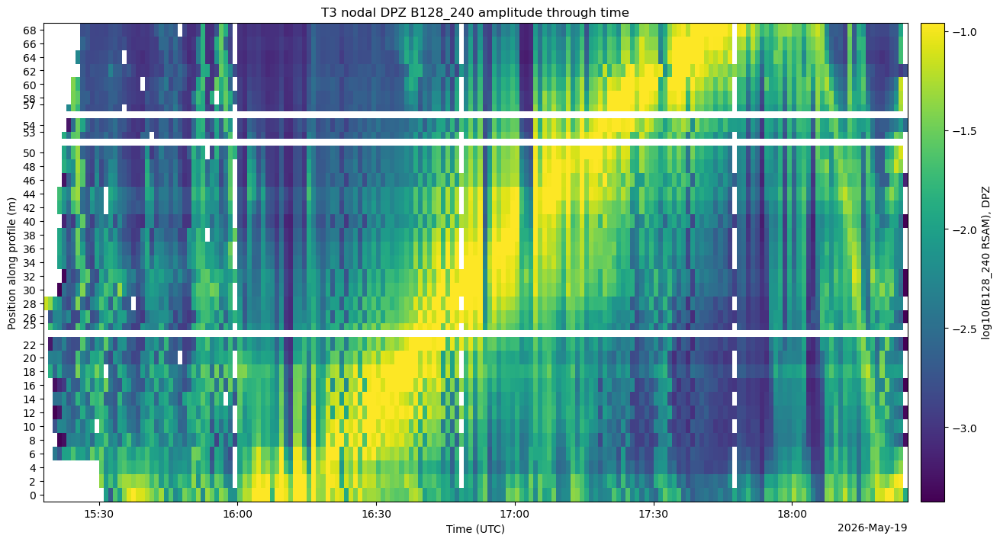

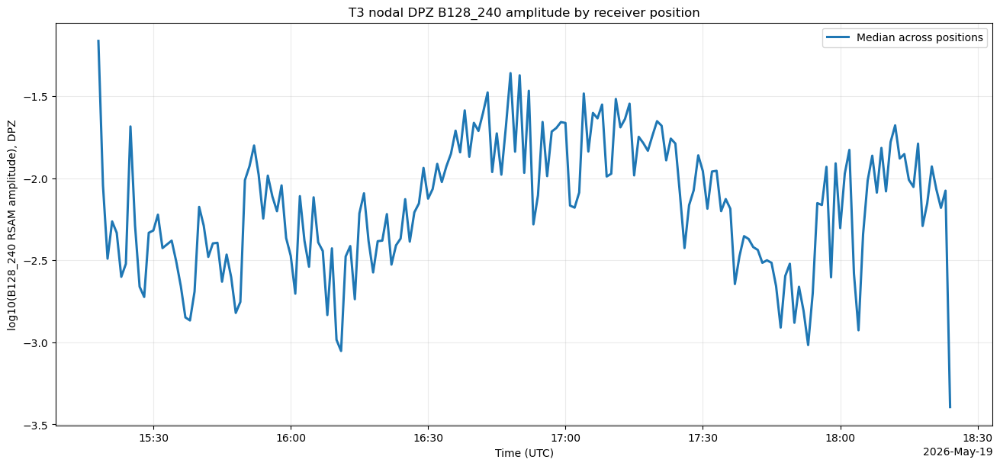

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T3_DPZ_B16_32_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T3_DPZ_B16_32_amplitude_timeseries.png


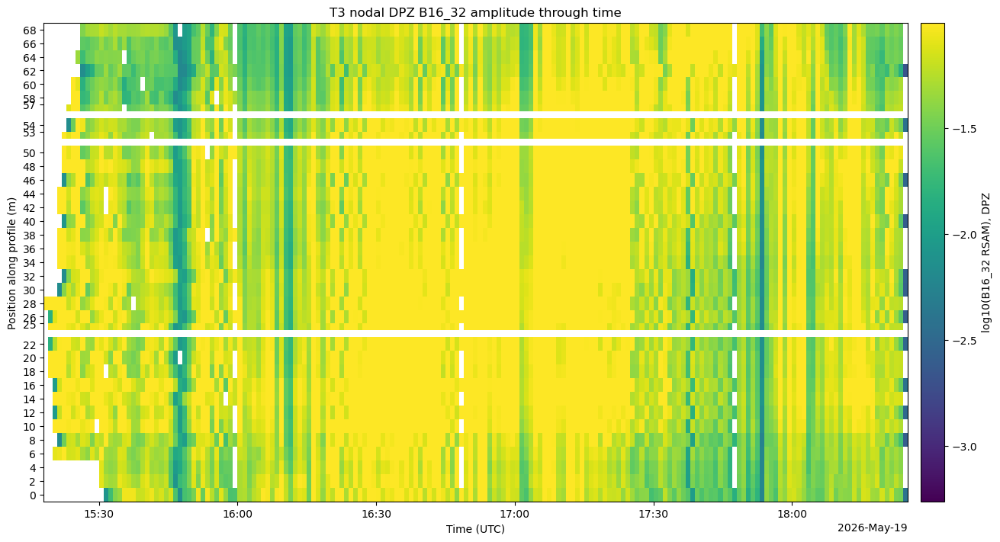

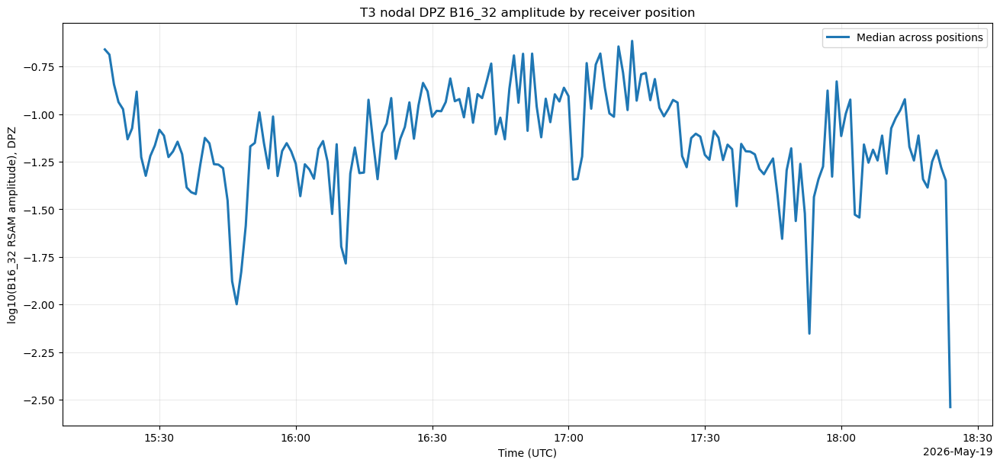

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T3_DPZ_B32_64_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T3_DPZ_B32_64_amplitude_timeseries.png


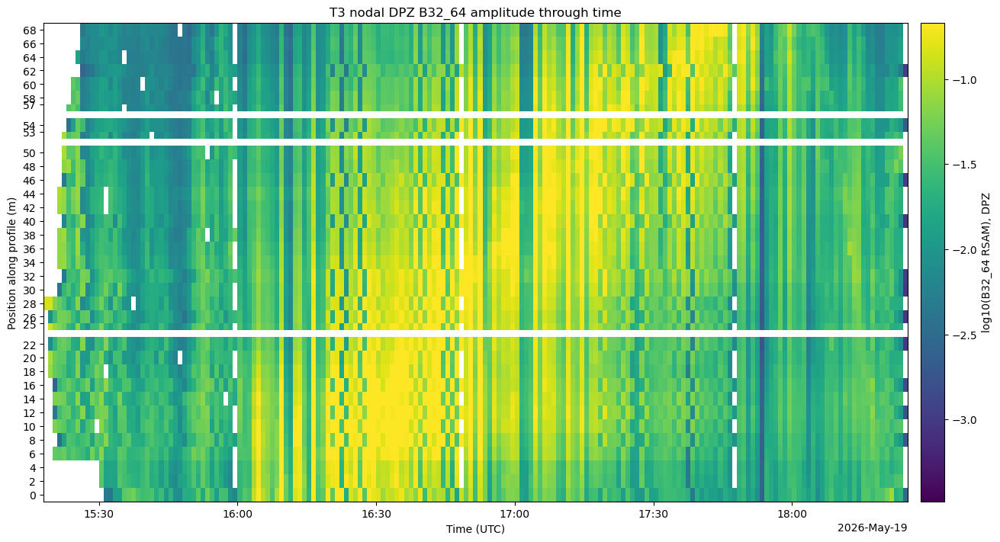

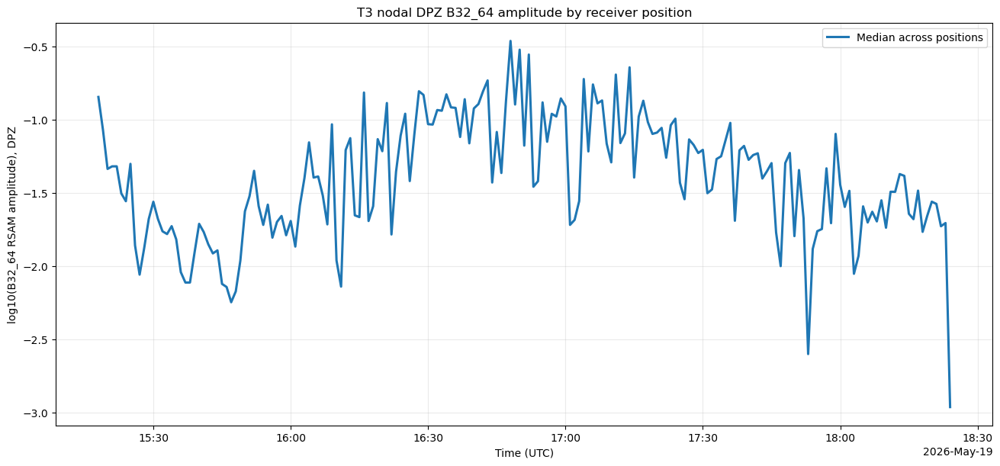

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T3_DPZ_B4_8_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T3_DPZ_B4_8_amplitude_timeseries.png


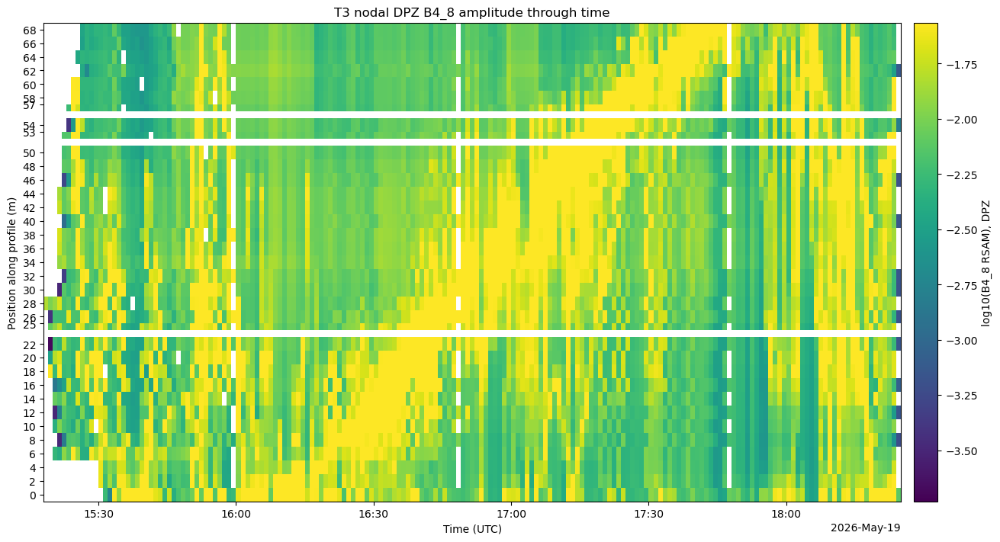

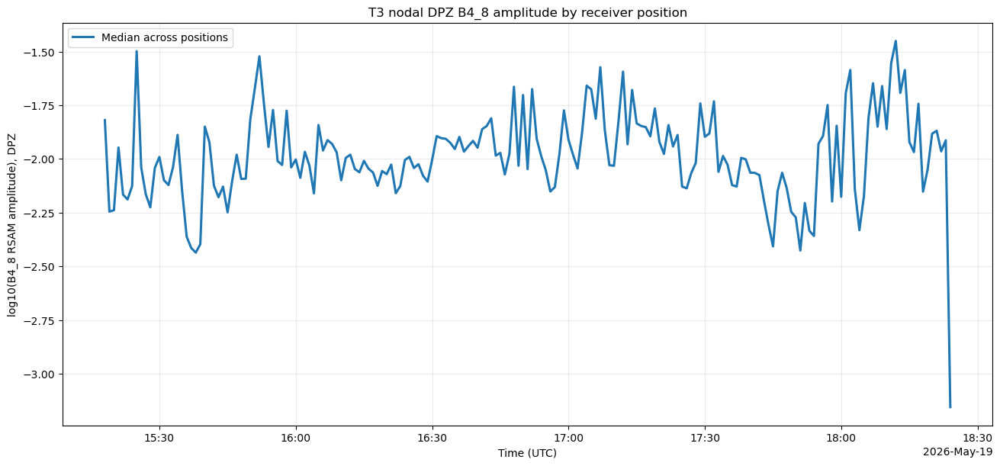

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T3_DPZ_B64_128_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T3_DPZ_B64_128_amplitude_timeseries.png


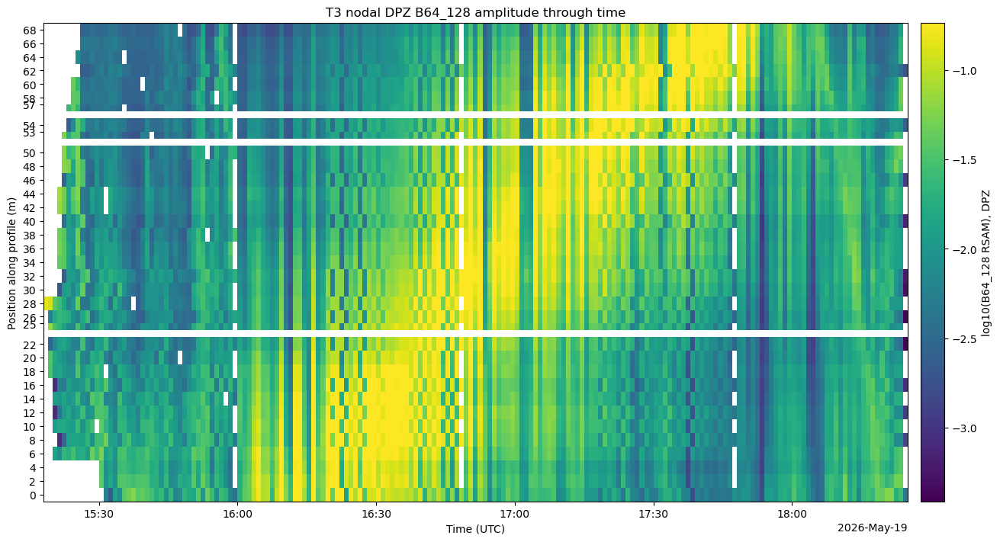

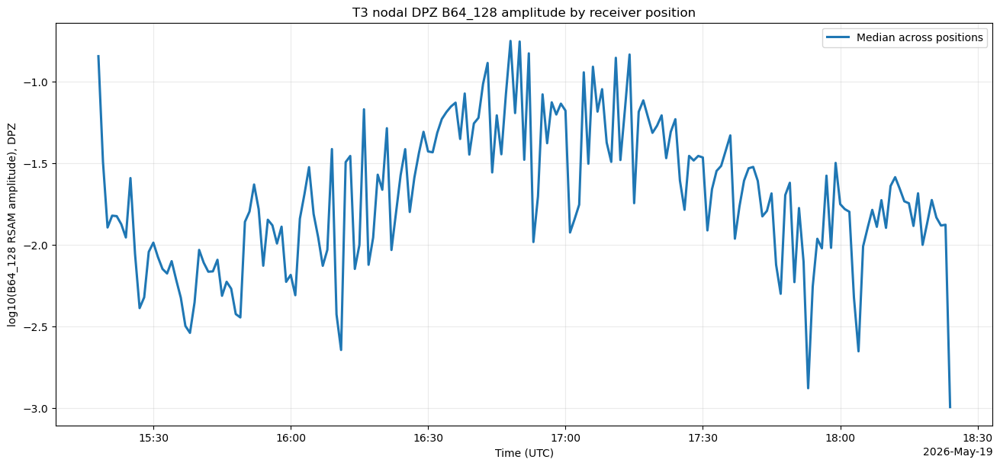

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T3_DPZ_B8_16_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T3_DPZ_B8_16_amplitude_timeseries.png


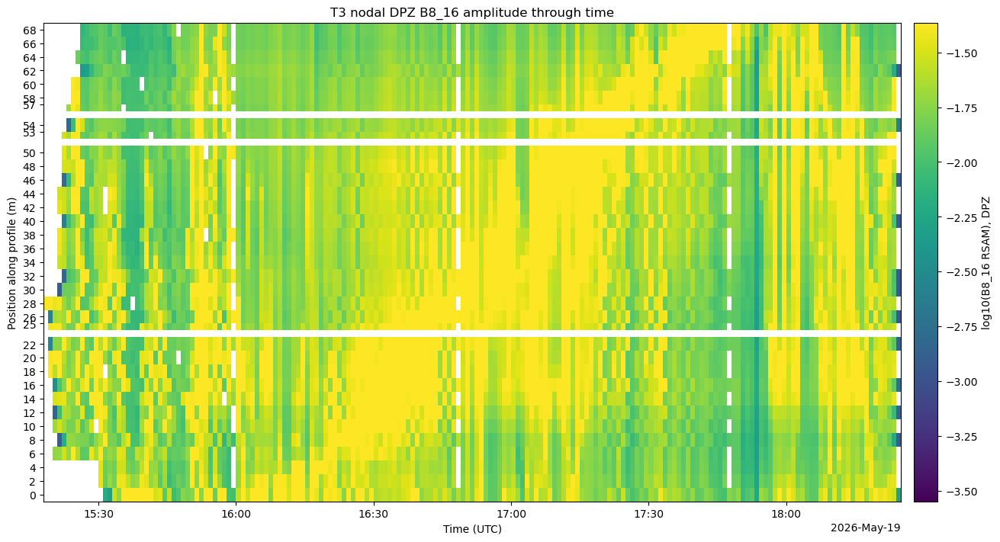

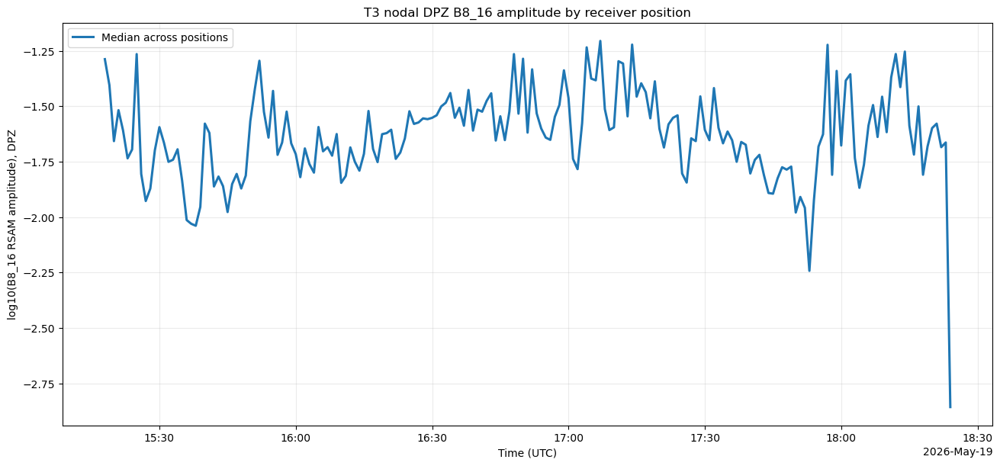

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T3_DPZ_max_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T3_DPZ_max_amplitude_timeseries.png


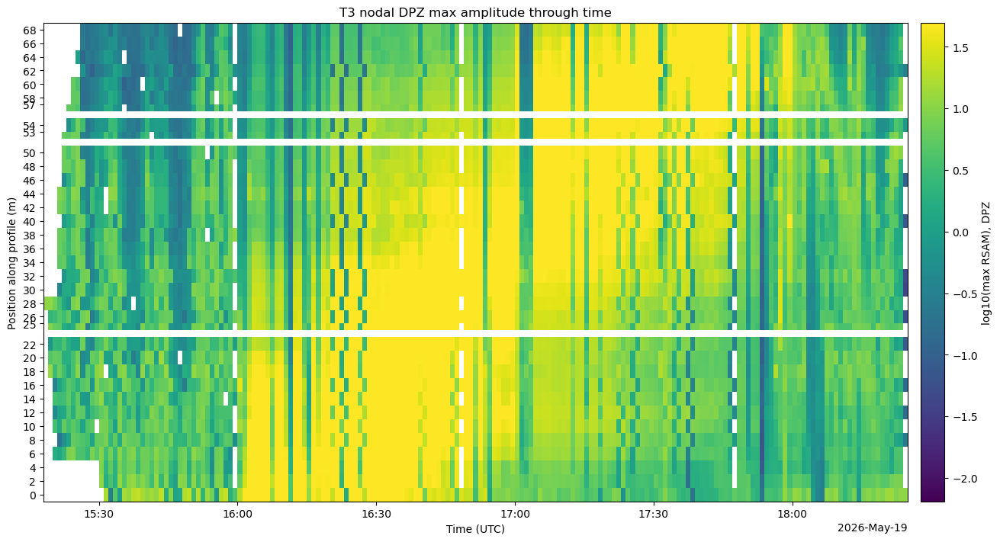

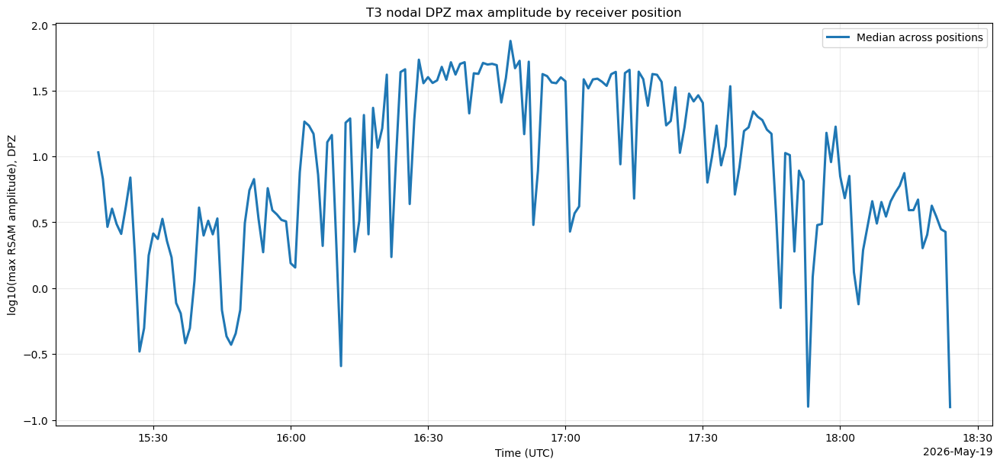

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T3_DPZ_mean_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T3_DPZ_mean_amplitude_timeseries.png


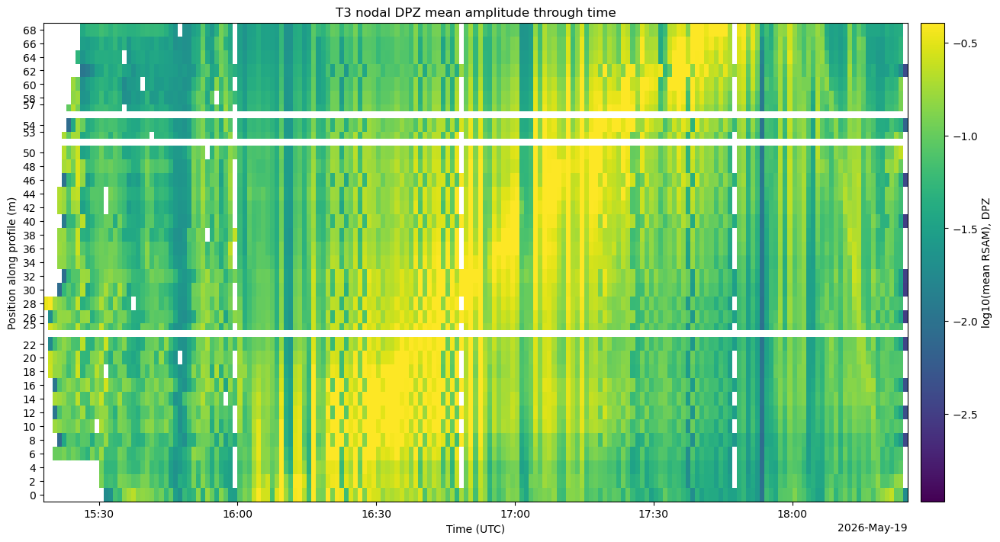

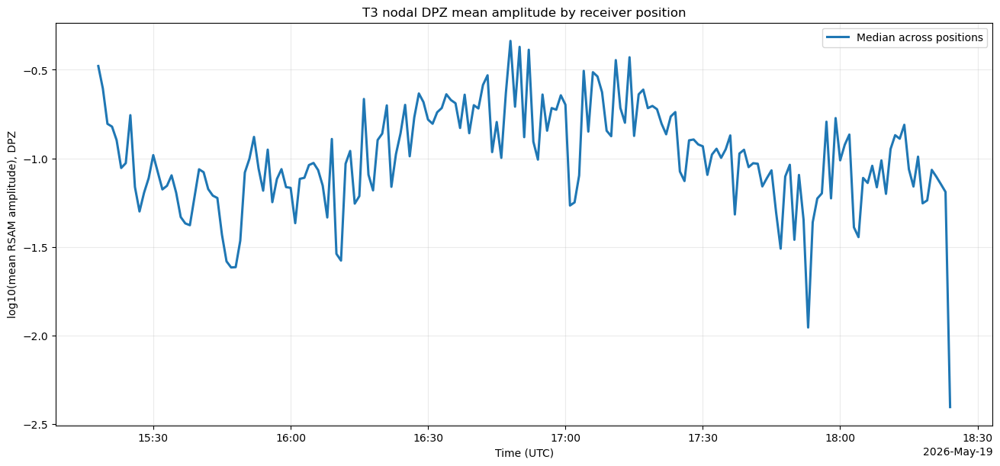

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T3_DPZ_median_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T3_DPZ_median_amplitude_timeseries.png


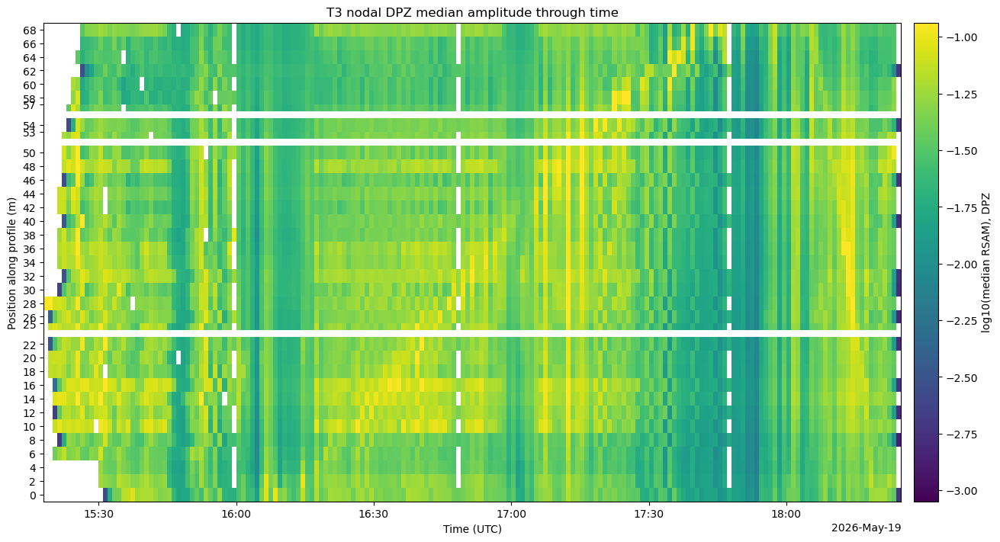

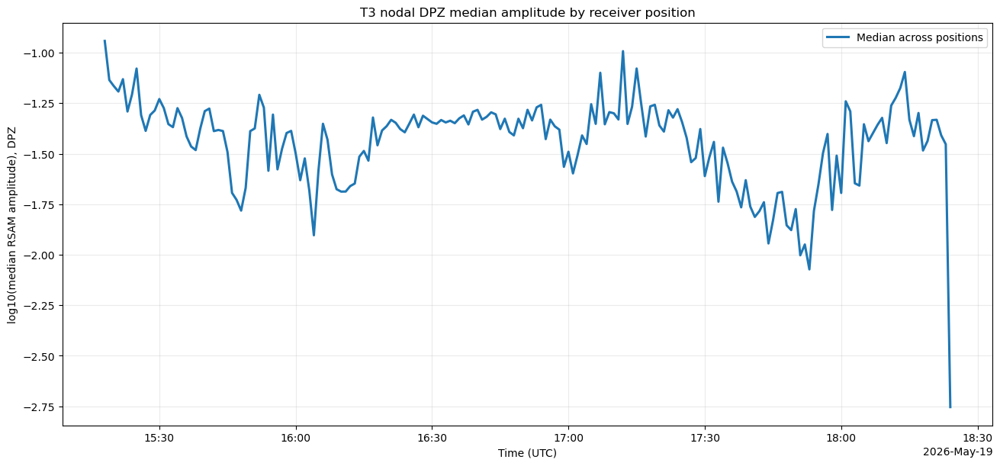

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T3_DPZ_min_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T3_DPZ_min_amplitude_timeseries.png


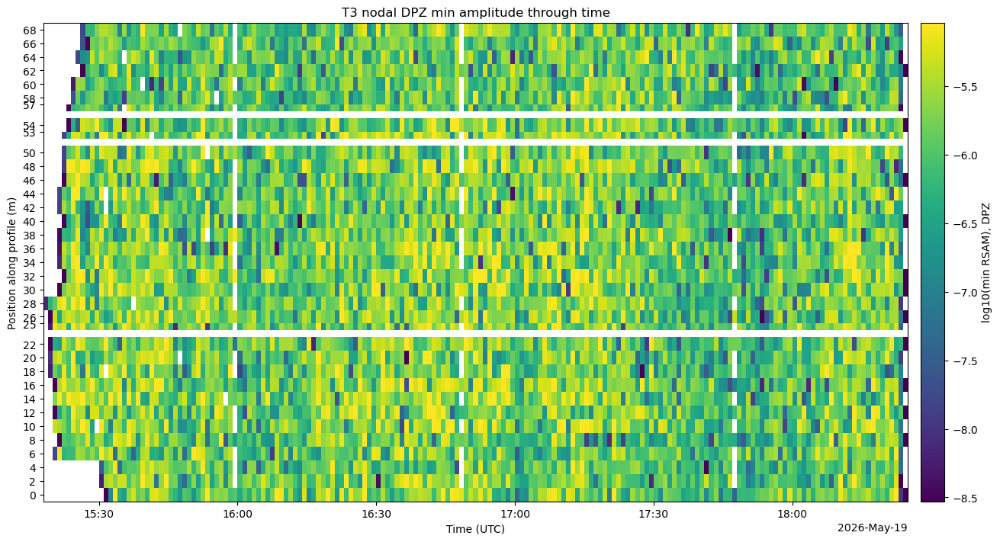

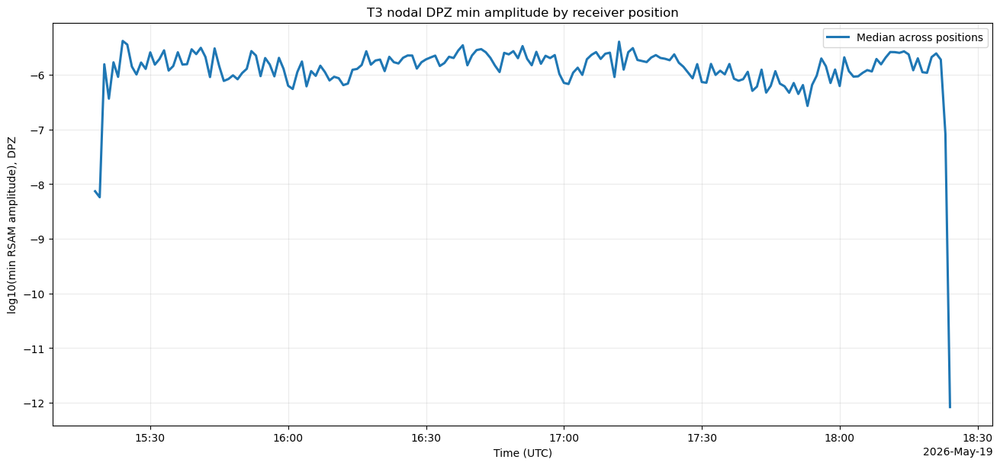

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T3_DPZ_rms_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T3_DPZ_rms_amplitude_timeseries.png


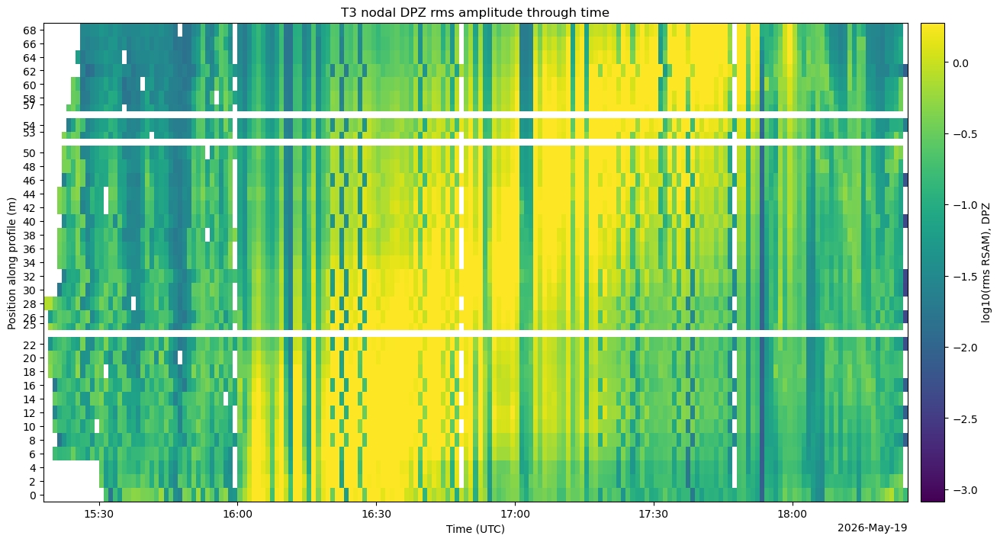

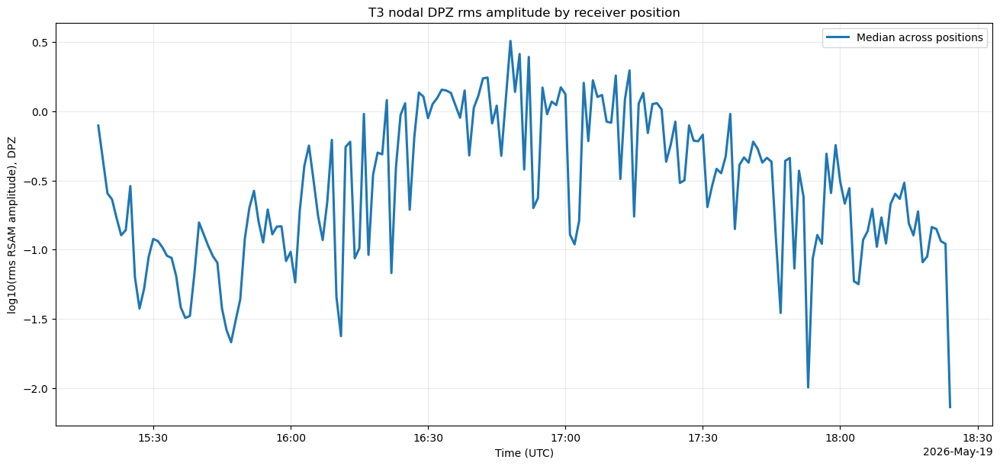

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T3_DPN_B128_240_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T3_DPN_B128_240_amplitude_timeseries.png


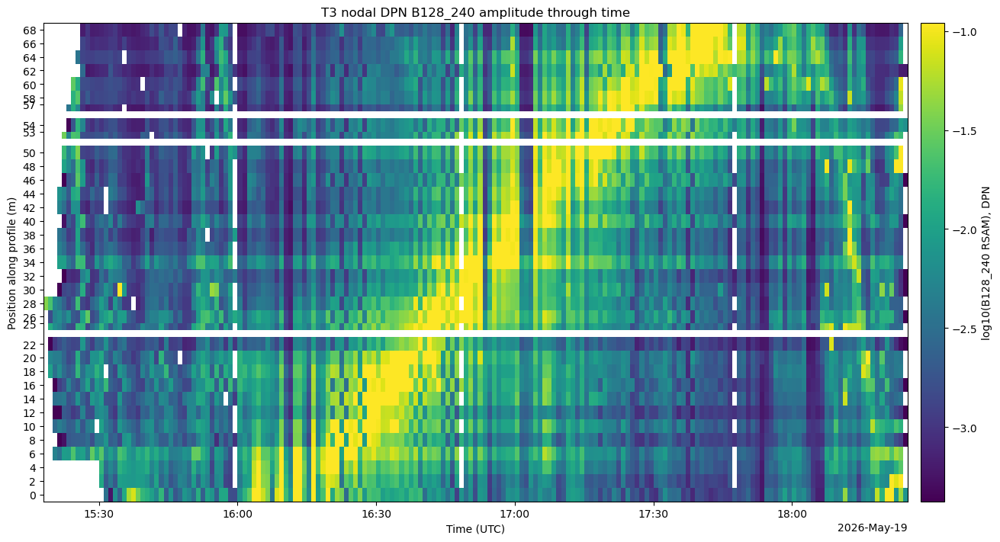

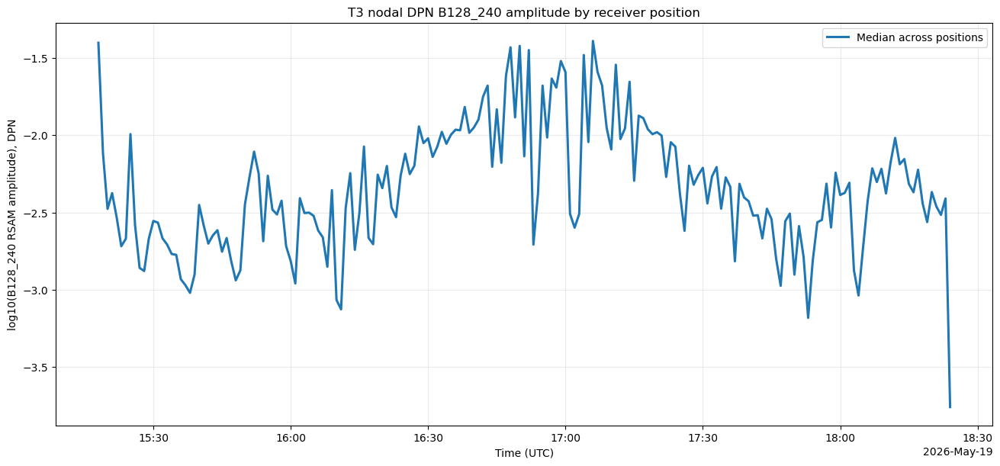

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T3_DPN_B16_32_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T3_DPN_B16_32_amplitude_timeseries.png


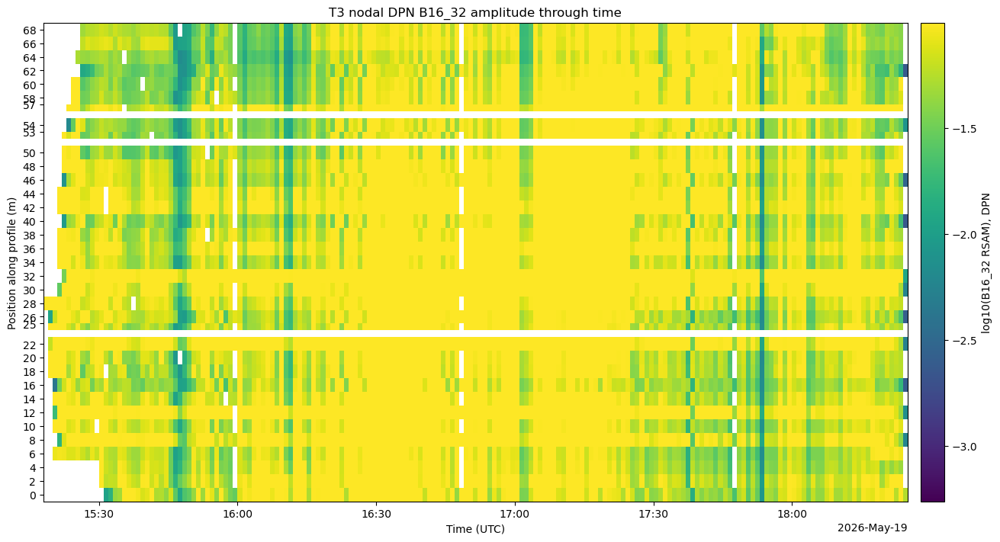

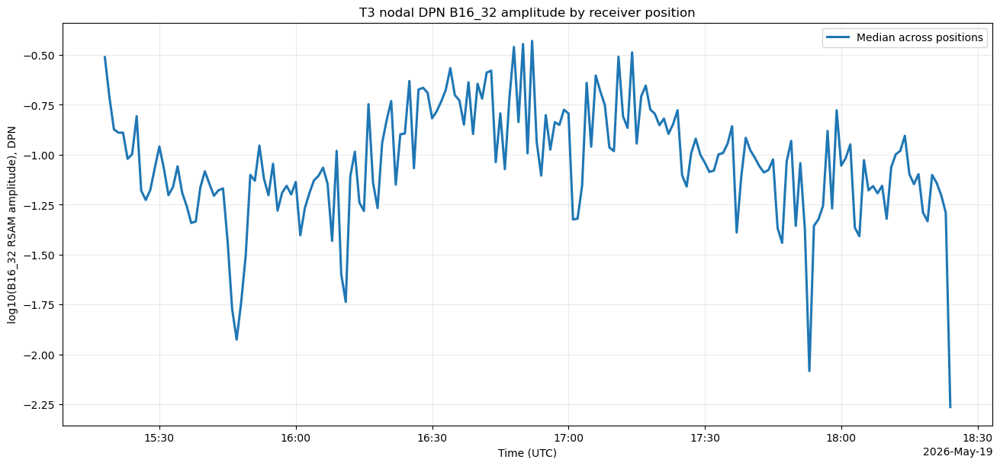

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T3_DPN_B32_64_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T3_DPN_B32_64_amplitude_timeseries.png


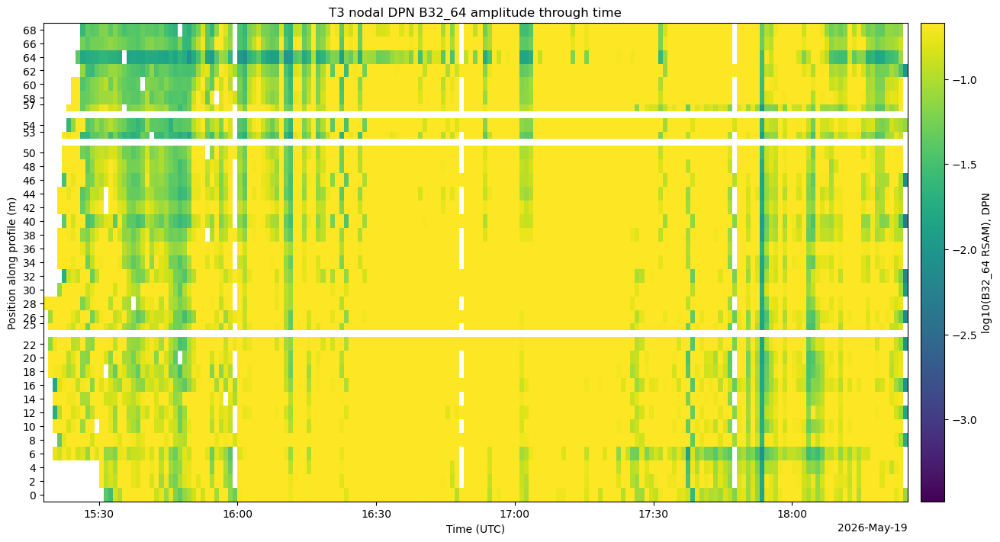

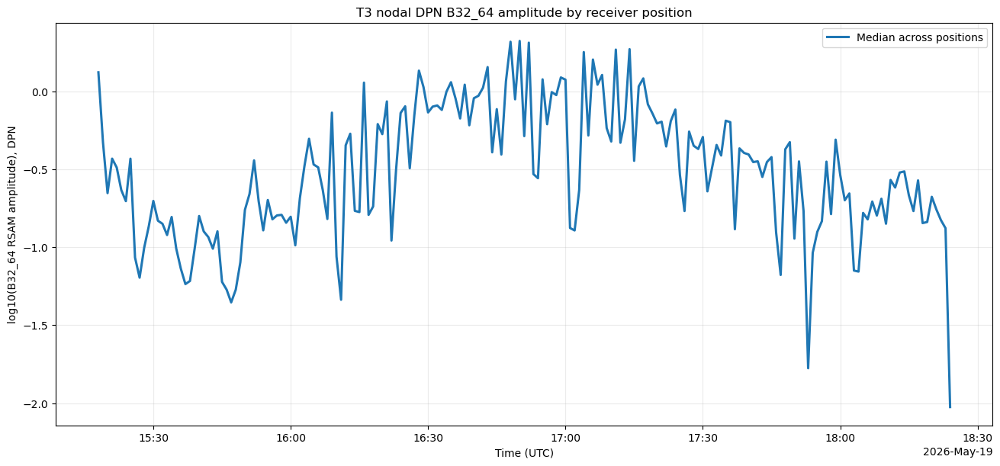

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T3_DPN_B4_8_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T3_DPN_B4_8_amplitude_timeseries.png


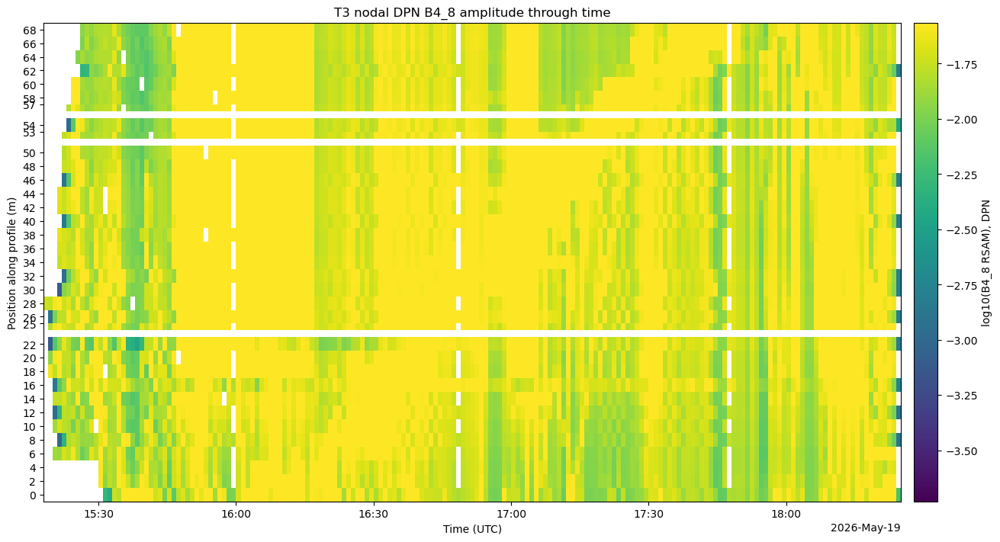

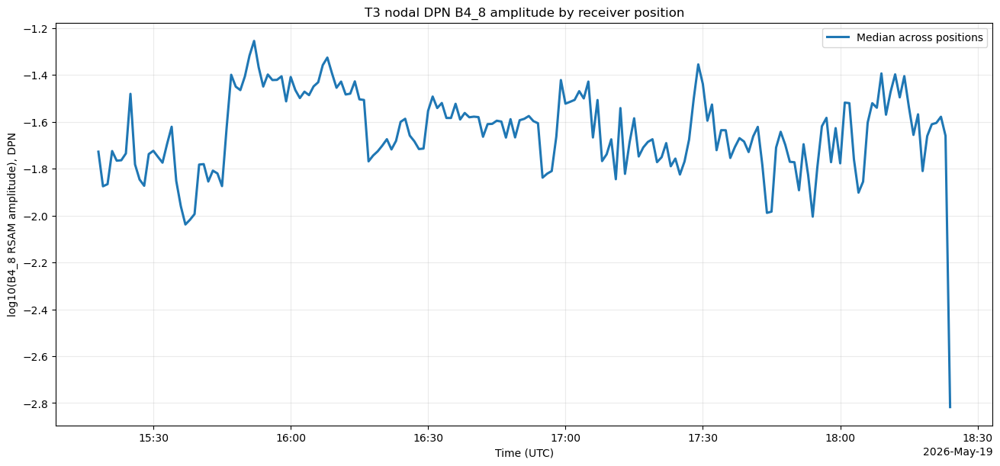

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T3_DPN_B64_128_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T3_DPN_B64_128_amplitude_timeseries.png


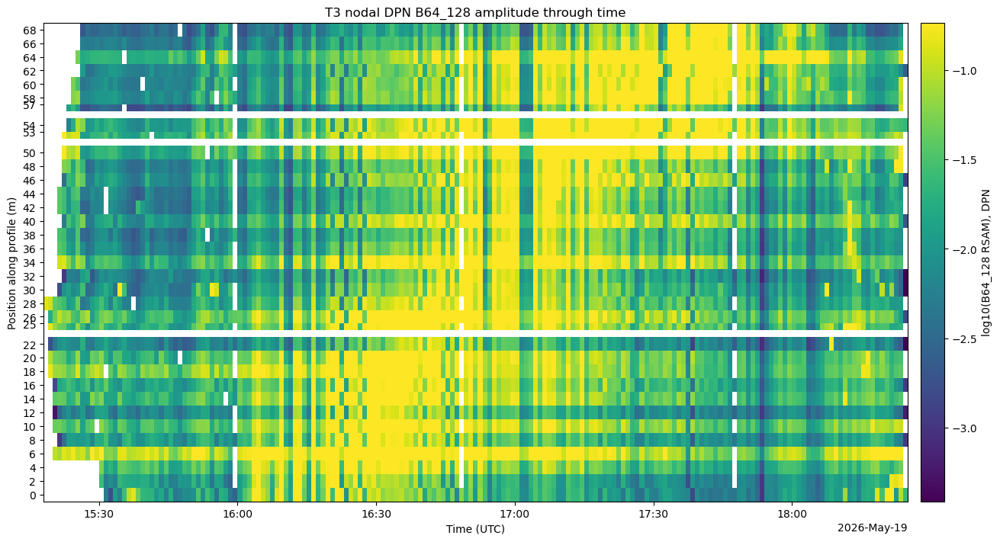

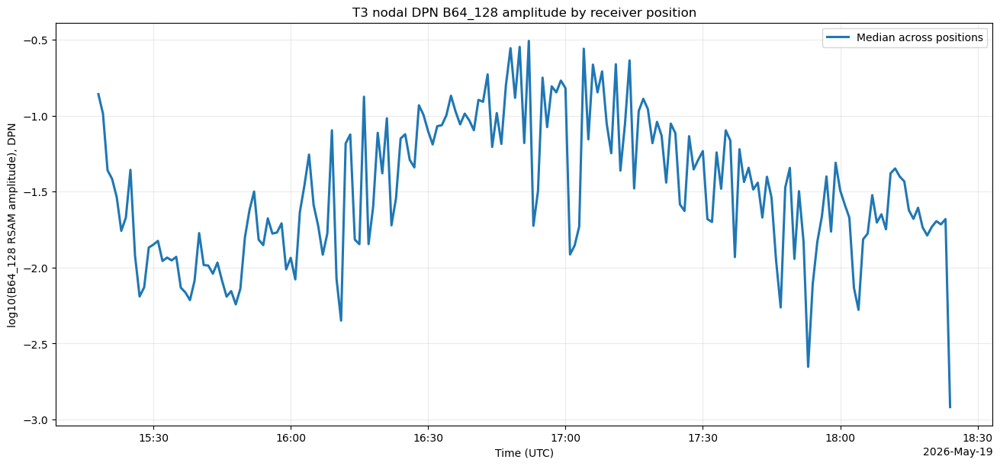

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T3_DPN_B8_16_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T3_DPN_B8_16_amplitude_timeseries.png


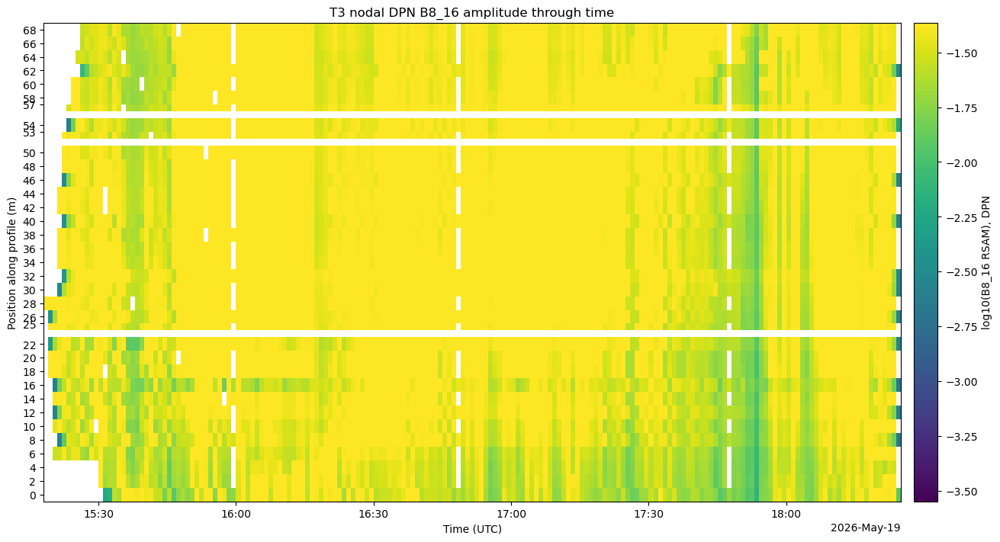

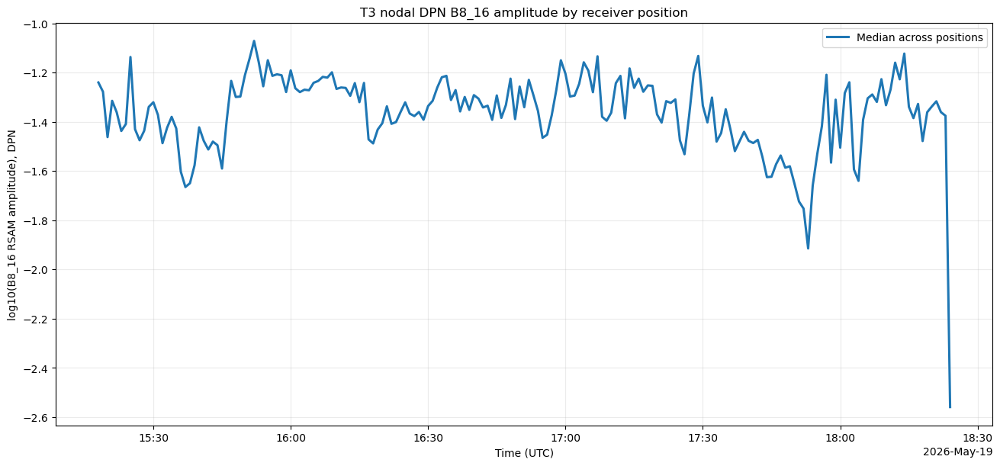

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T3_DPN_max_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T3_DPN_max_amplitude_timeseries.png


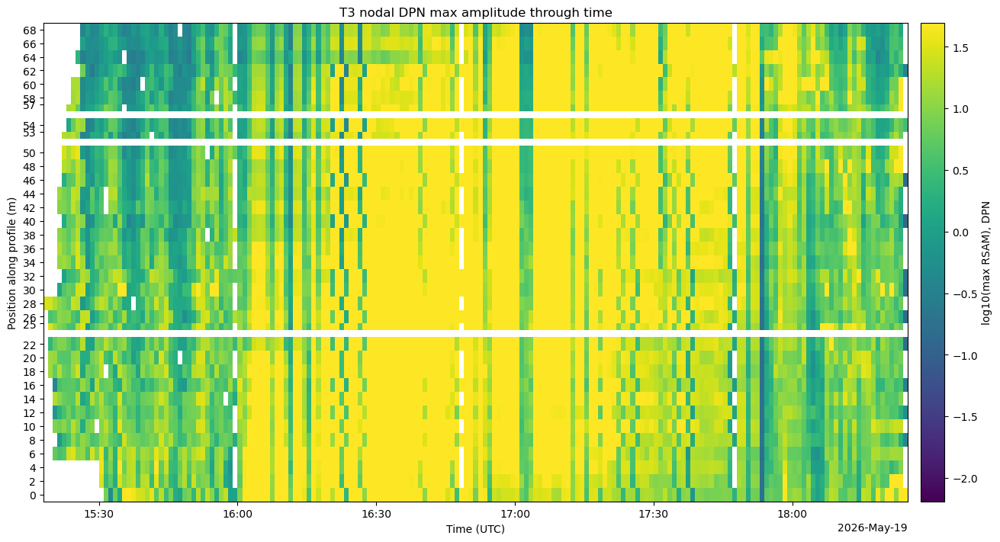

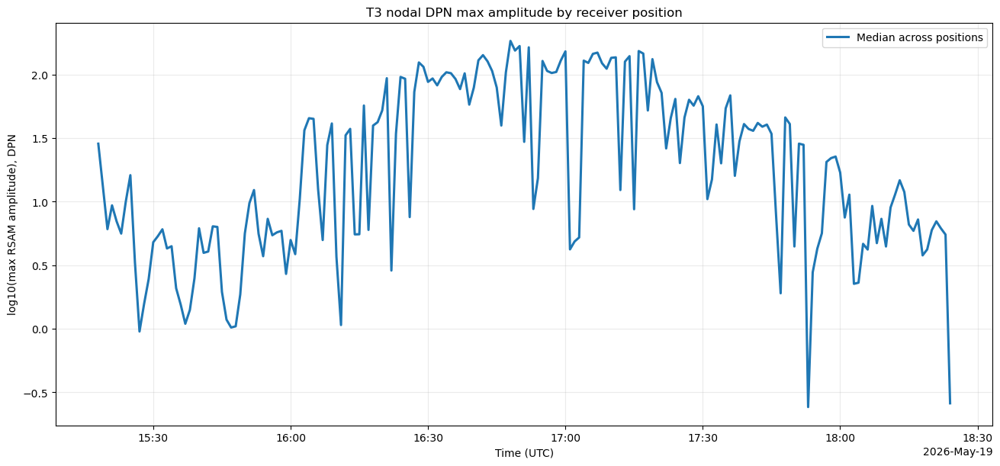

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T3_DPN_mean_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T3_DPN_mean_amplitude_timeseries.png


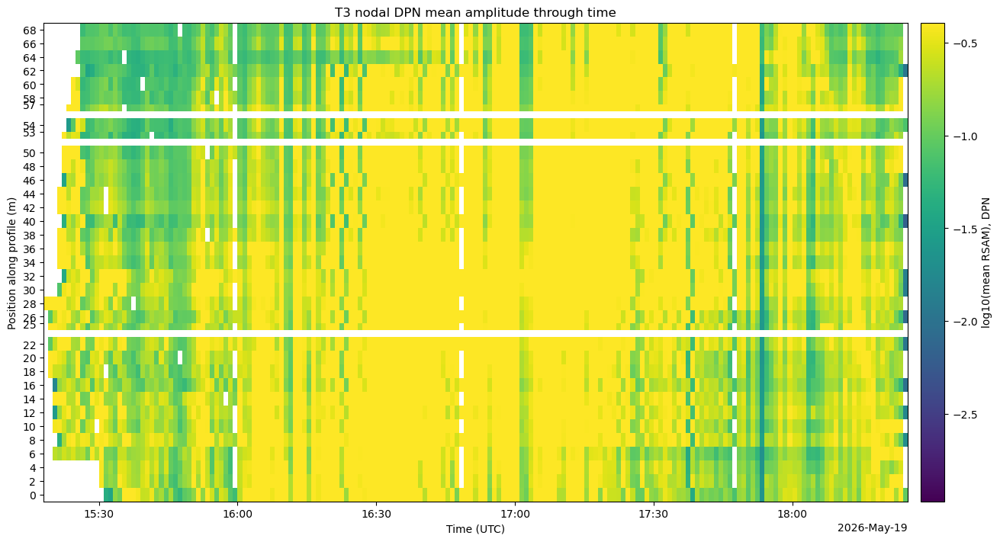

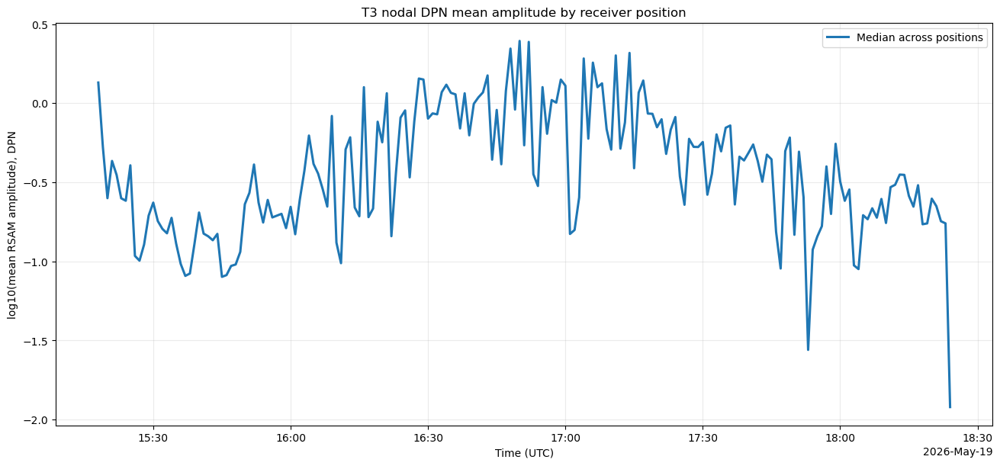

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T3_DPN_median_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T3_DPN_median_amplitude_timeseries.png


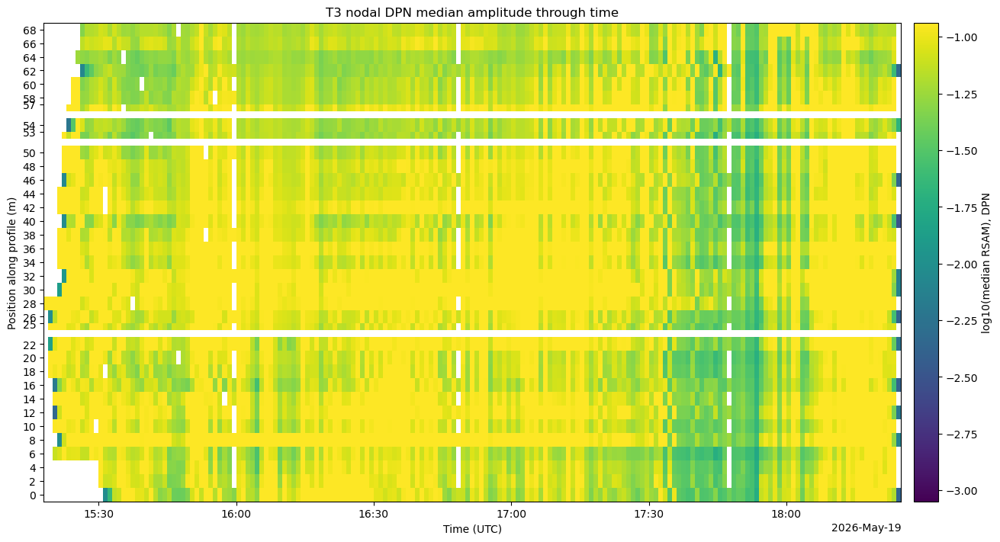

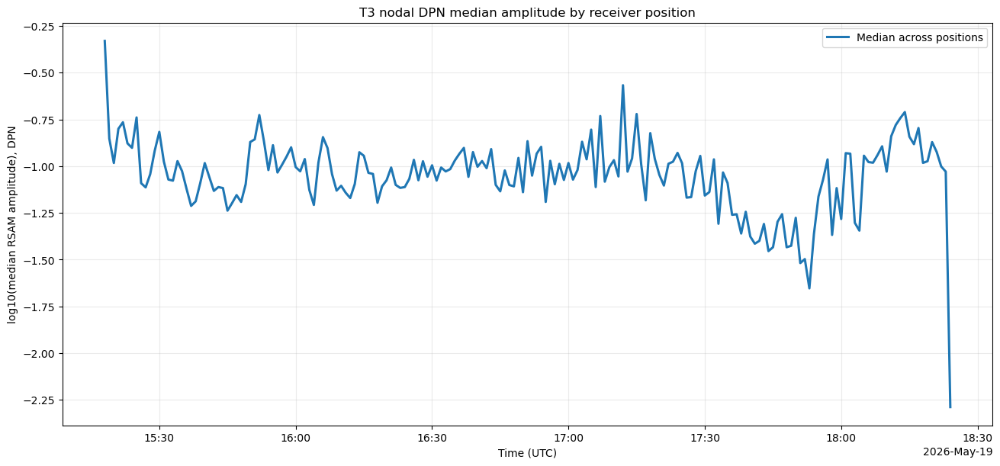

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T3_DPN_min_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T3_DPN_min_amplitude_timeseries.png


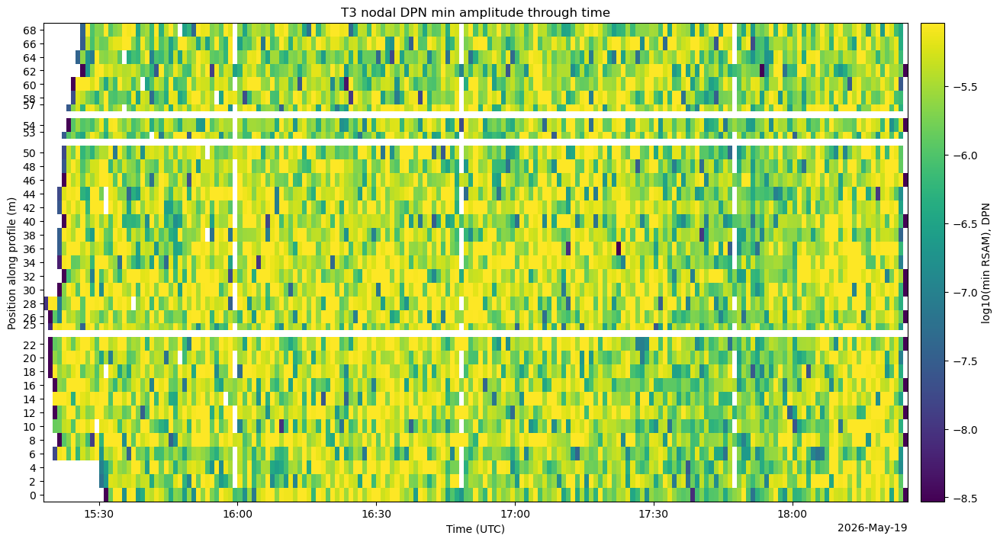

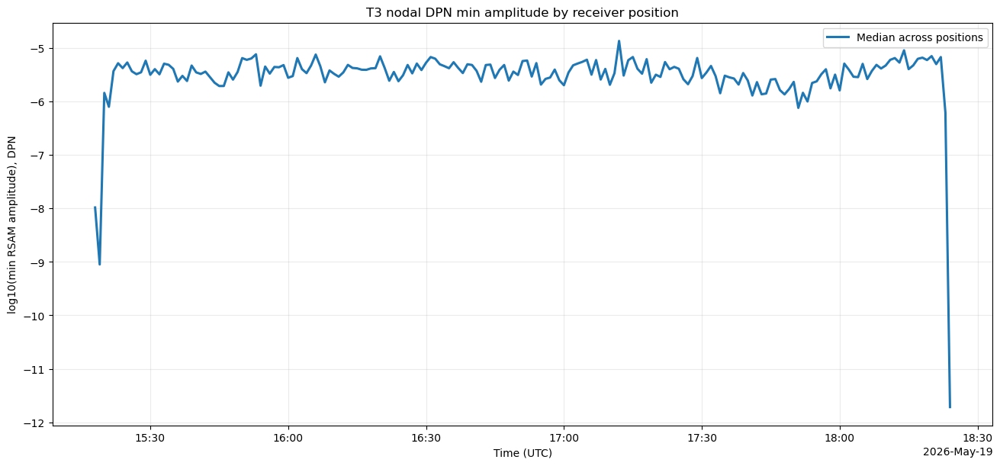

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T3_DPN_rms_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T3_DPN_rms_amplitude_timeseries.png


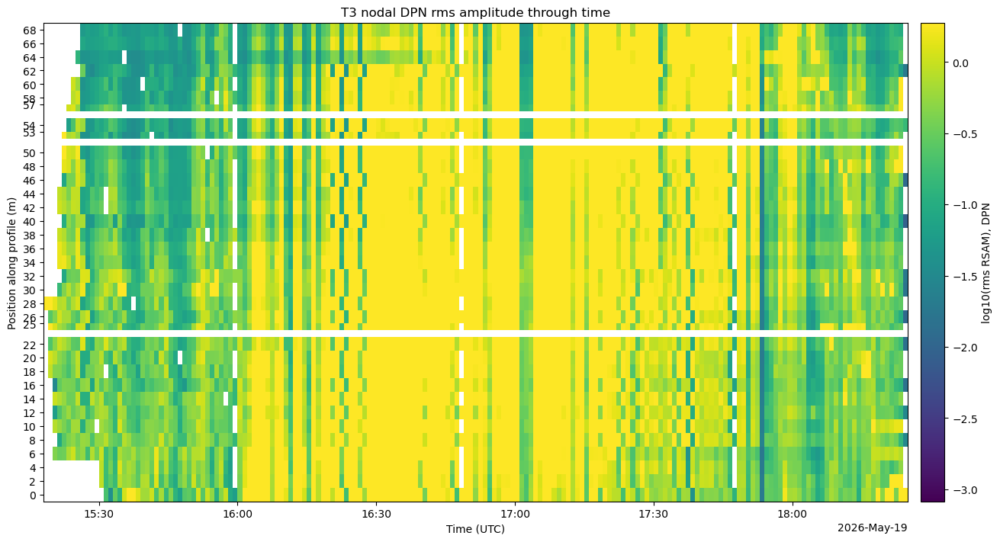

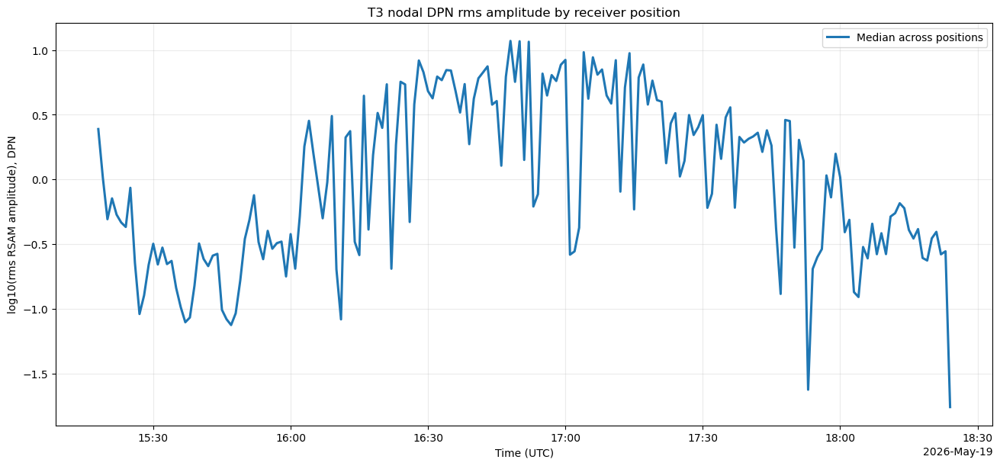

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T3_DPE_B128_240_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B128_240/T3_DPE_B128_240_amplitude_timeseries.png


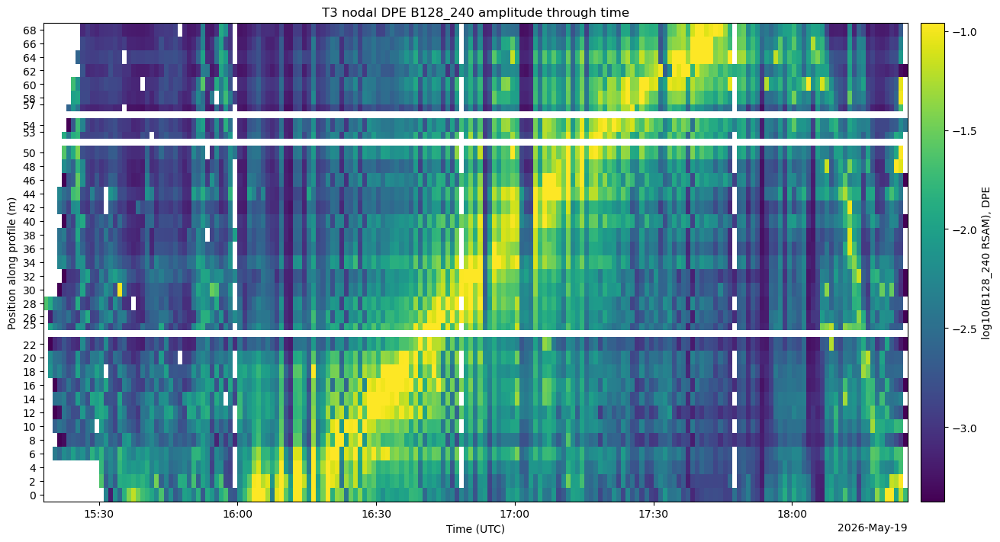

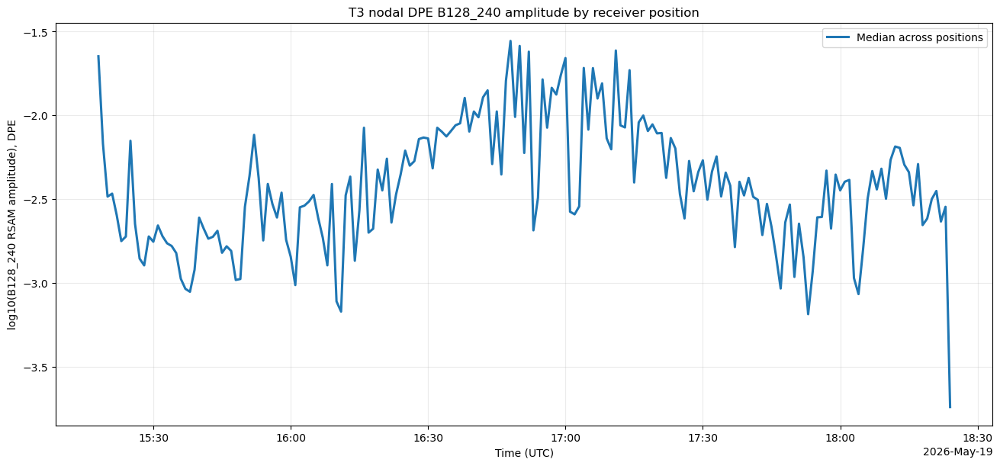

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T3_DPE_B16_32_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B16_32/T3_DPE_B16_32_amplitude_timeseries.png


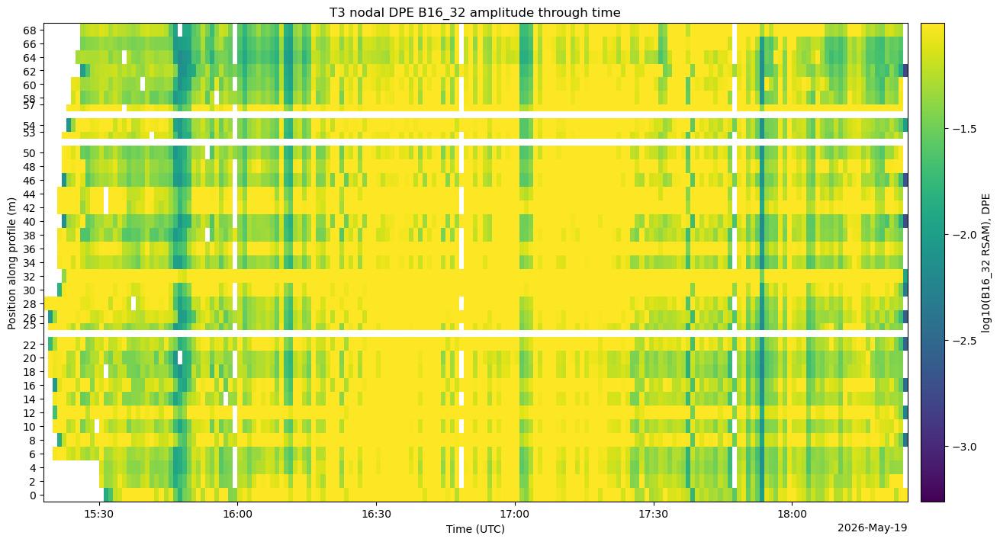

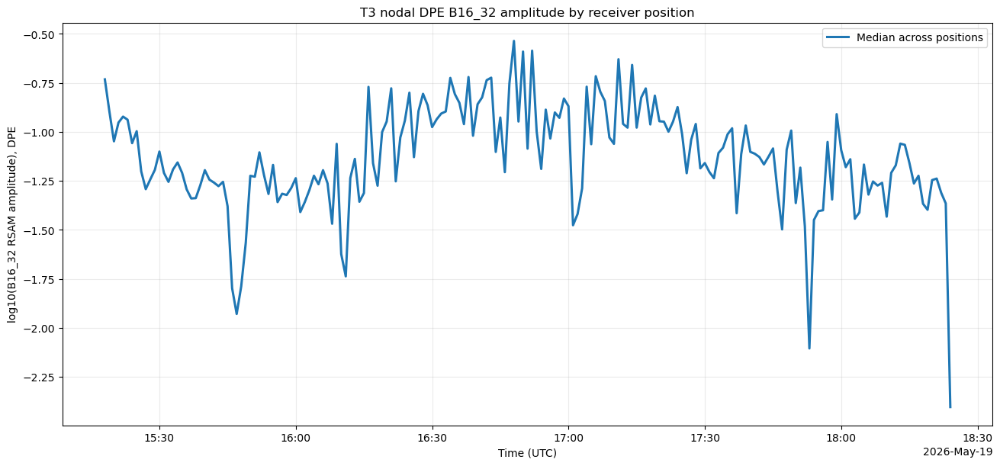

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T3_DPE_B32_64_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B32_64/T3_DPE_B32_64_amplitude_timeseries.png


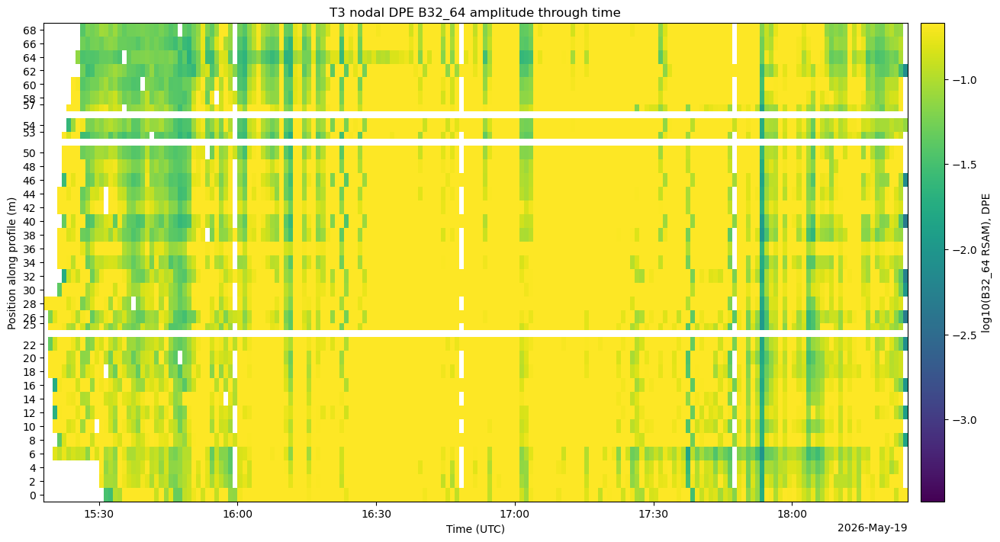

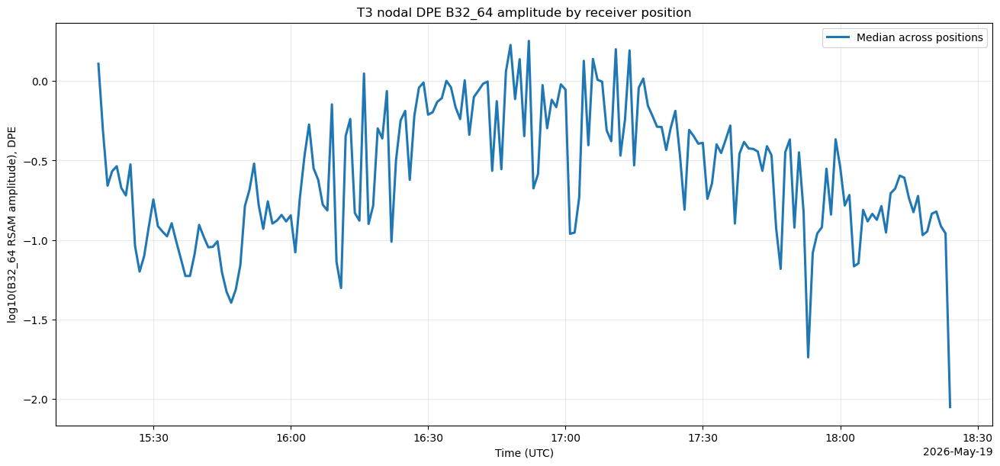

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T3_DPE_B4_8_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B4_8/T3_DPE_B4_8_amplitude_timeseries.png


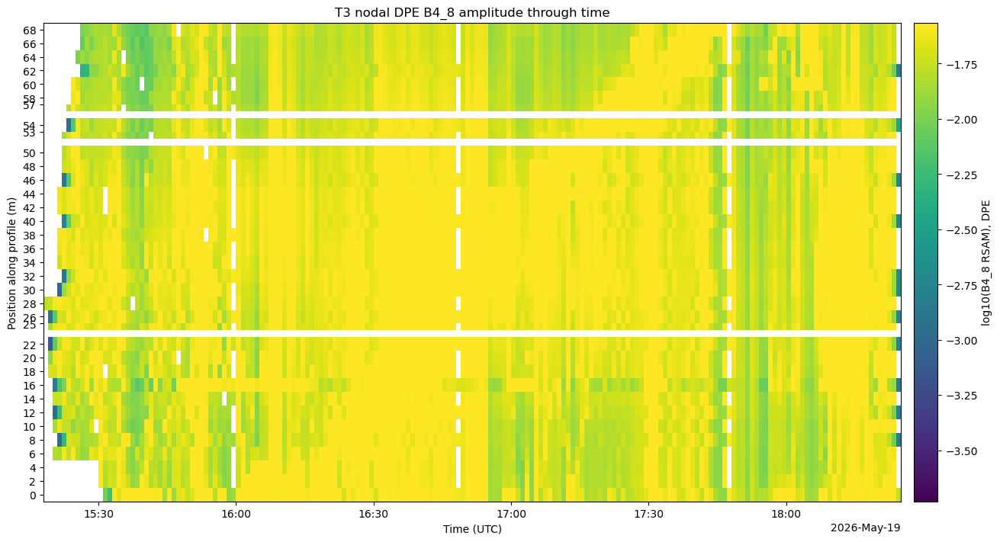

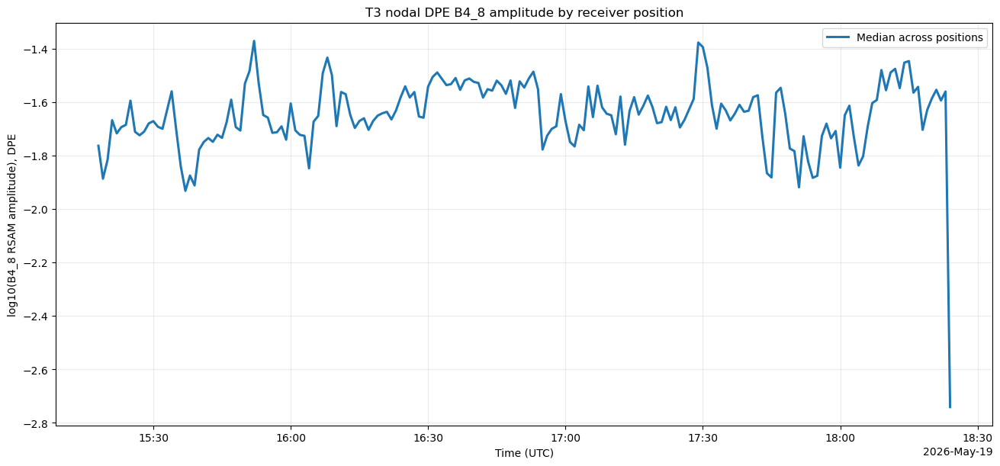

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T3_DPE_B64_128_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B64_128/T3_DPE_B64_128_amplitude_timeseries.png


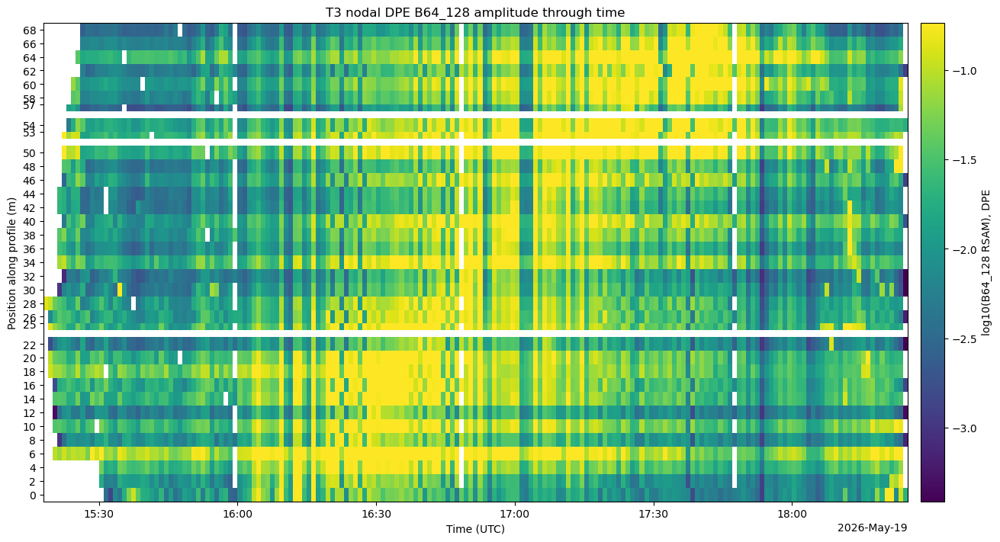

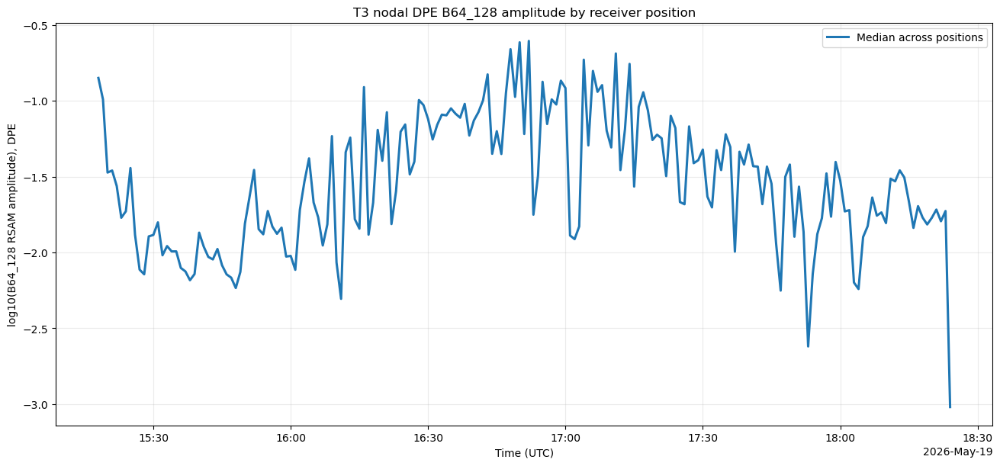

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T3_DPE_B8_16_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/B8_16/T3_DPE_B8_16_amplitude_timeseries.png


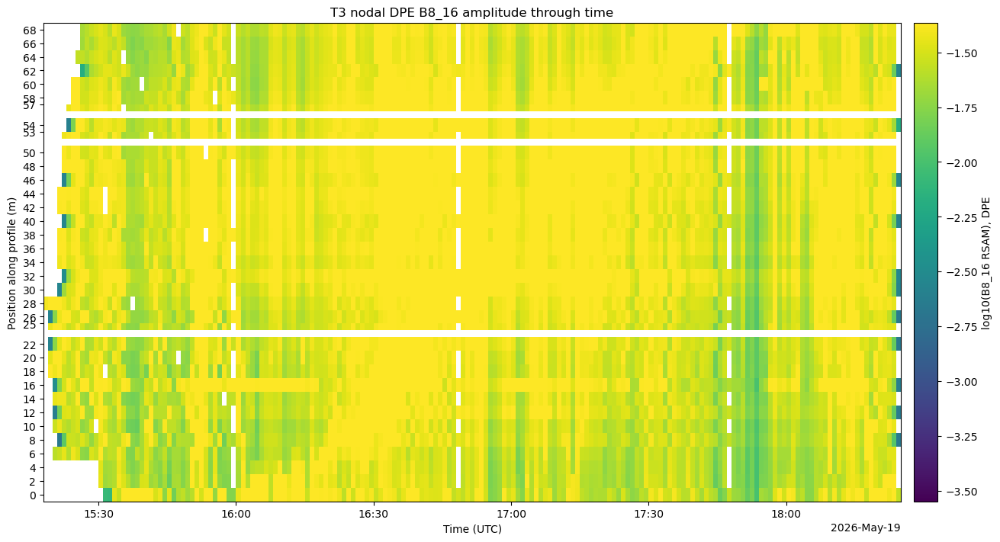

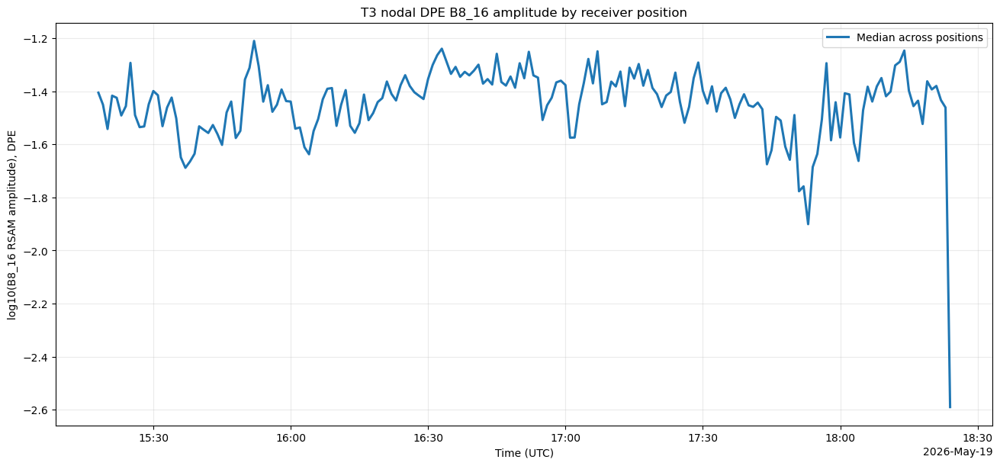

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T3_DPE_max_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/max/T3_DPE_max_amplitude_timeseries.png


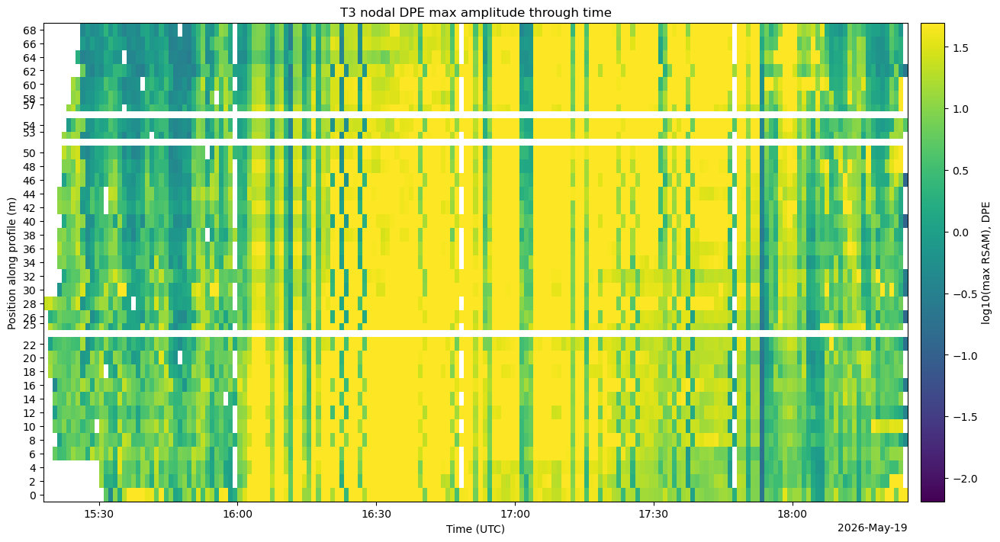

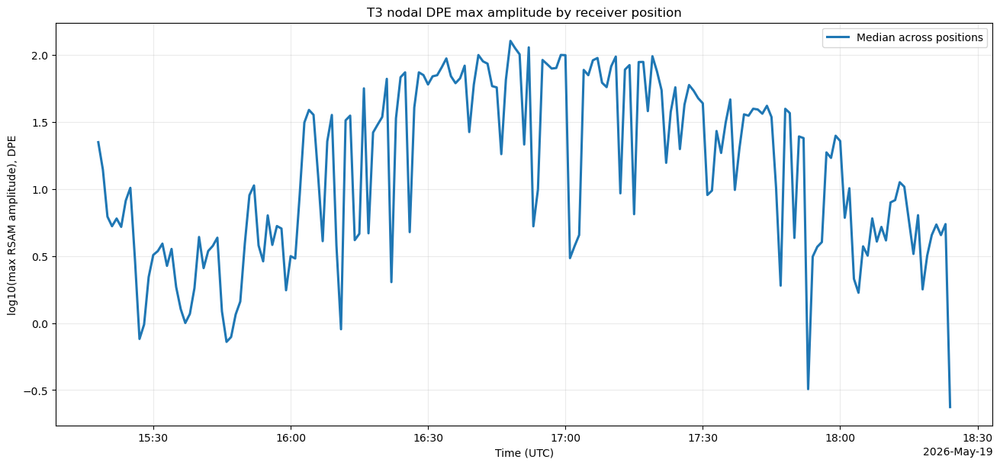

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T3_DPE_mean_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/mean/T3_DPE_mean_amplitude_timeseries.png


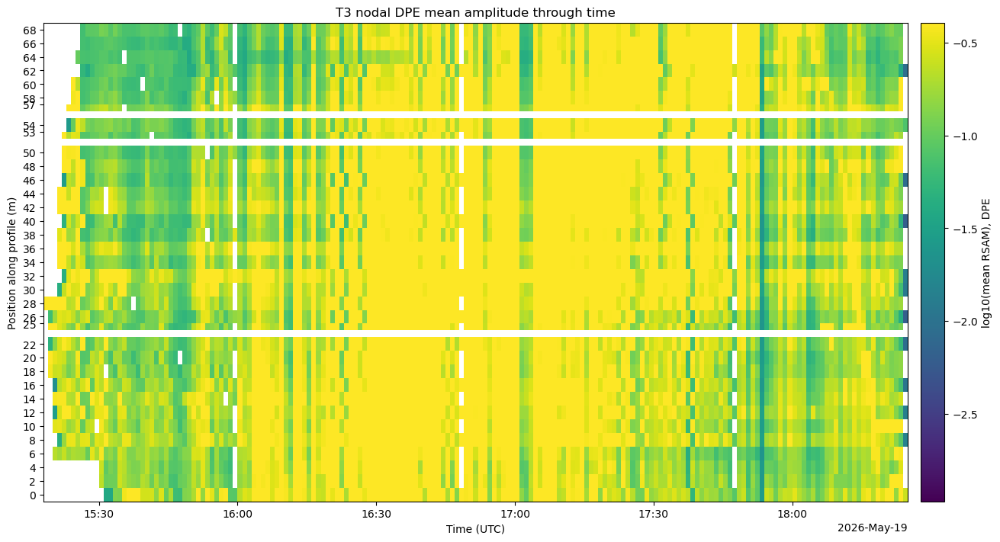

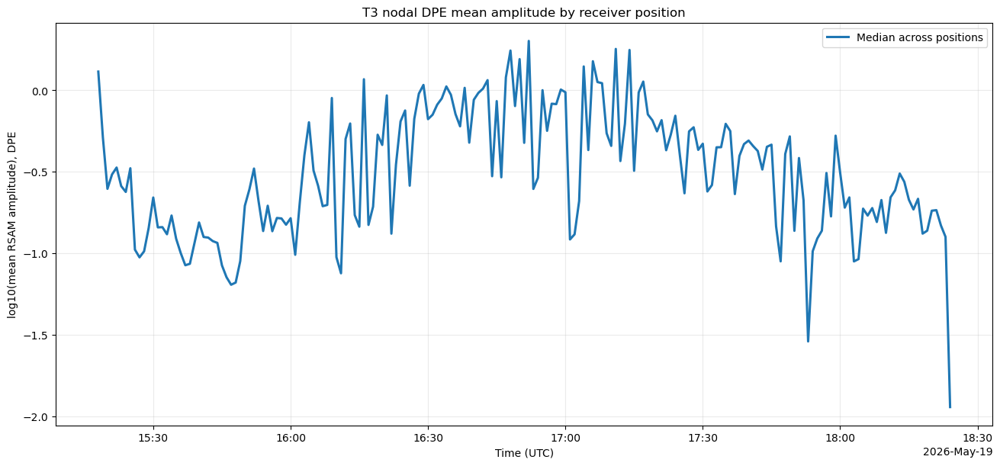

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T3_DPE_median_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/median/T3_DPE_median_amplitude_timeseries.png


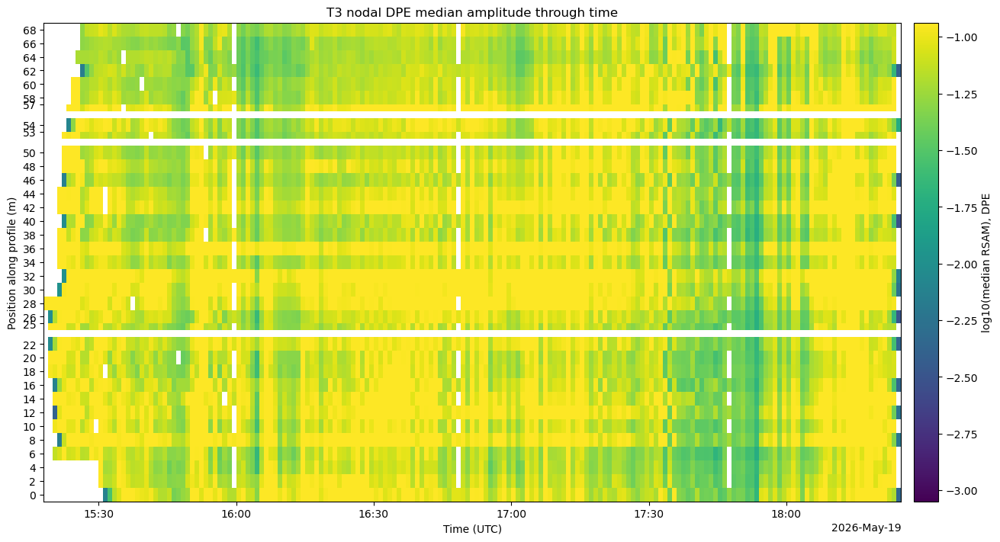

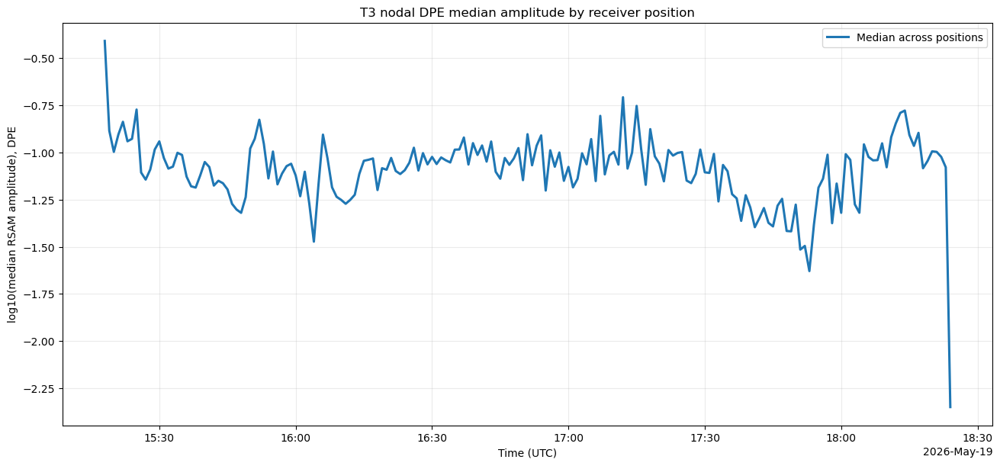

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T3_DPE_min_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/min/T3_DPE_min_amplitude_timeseries.png


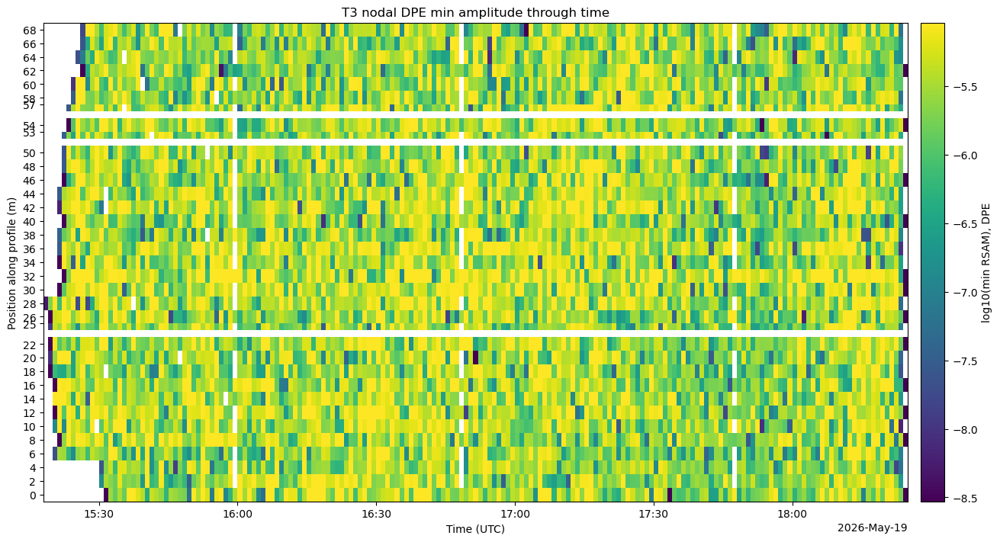

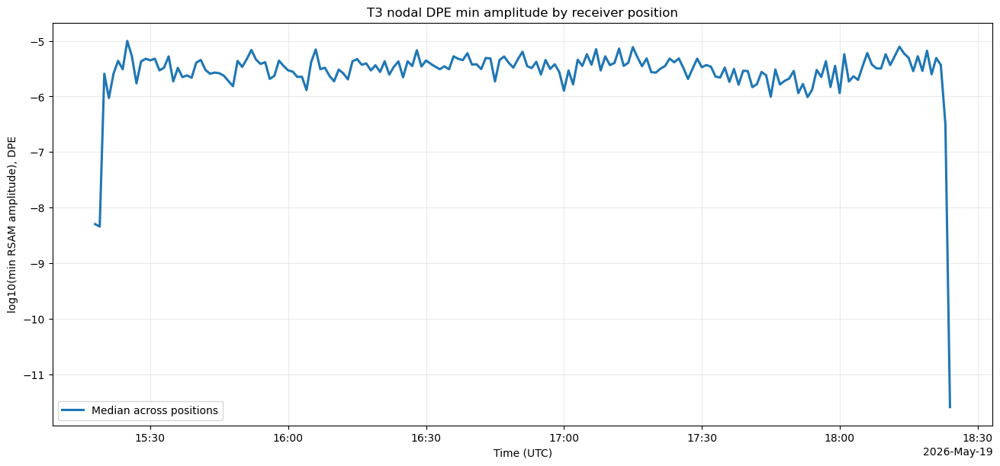

Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T3_DPE_rms_heatmap.png
Wrote /Volumes/tachyon/LBSSP_DATA/nodal_rsam_position_codes/all_metric_plots/rms/T3_DPE_rms_amplitude_timeseries.png


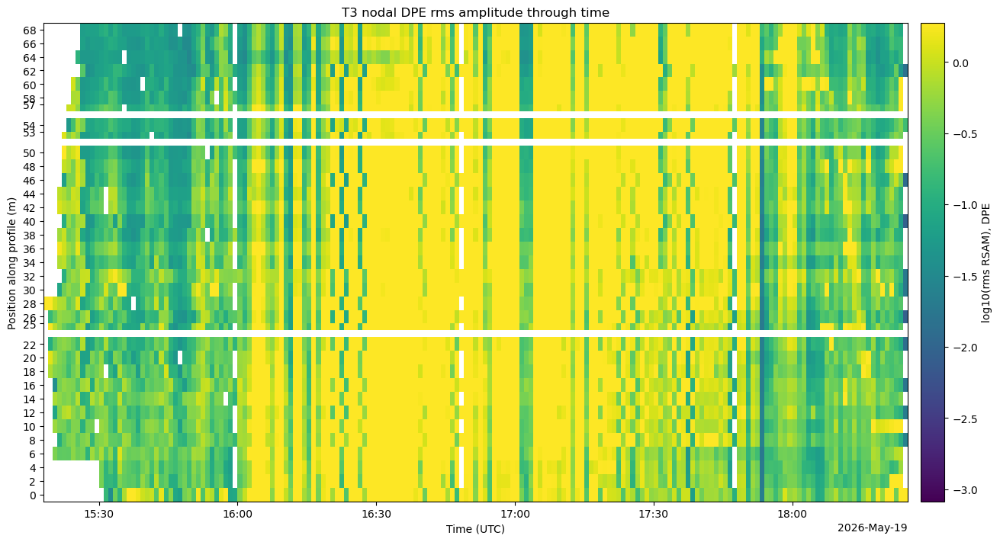

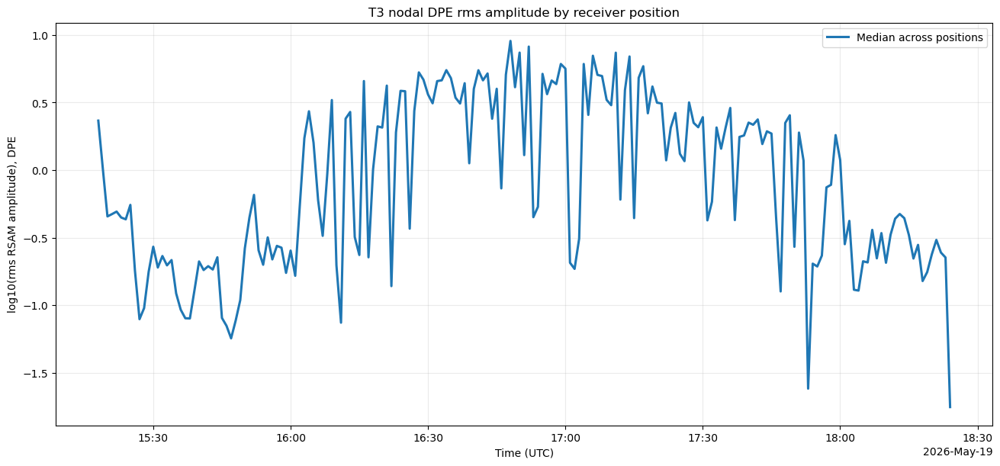

In [30]:
heatmap_figures = {}
amplitude_figures = {}

for network in RUNS:
    for component, channel in CHANNELS.items():
        for metric in METRICS:
            key = (network, component, metric)

            if key not in results:
                continue

            if metric not in metric_color_limits:
                continue

            vmin, vmax = metric_color_limits[metric]

            metric_dir = OUTPUT_DIR / metric

            heatmap_outfile = (
                metric_dir
                / (
                    f"{network}_{channel}_{metric}_"
                    "heatmap.png"
                )
            )
            amplitude_outfile = (
                metric_dir
                / (
                    f"{network}_{channel}_{metric}_"
                    "amplitude_timeseries.png"
                )
            )

            heatmap_title = (
                f"{network} nodal {channel} "
                f"{metric} amplitude through time"
            )
            amplitude_title = (
                f"{network} nodal {channel} "
                f"{metric} amplitude by receiver position"
            )

            heatmap_fig, heatmap_ax = plot_heatmap(
                results[key]["plot_data"],
                outfile=heatmap_outfile,
                title=heatmap_title,
                metric=metric,
                channel=channel,
                cadence=CADENCE,
                use_log10=USE_LOG10,
                vmin=vmin,
                vmax=vmax,
                figsize=HEATMAP_FIGSIZE,
                dpi=DPI,
            )

            amplitude_fig, amplitude_ax = (
                plot_amplitude_timeseries(
                    results[key]["plot_data"],
                    outfile=amplitude_outfile,
                    title=amplitude_title,
                    metric=metric,
                    channel=channel,
                    use_log10=USE_LOG10,
                    figsize=AMPLITUDE_FIGSIZE,
                    dpi=DPI,
                    grey_line_width=GREY_LINE_WIDTH,
                    grey_line_alpha=GREY_LINE_ALPHA,
                    summary_line_width=SUMMARY_LINE_WIDTH,
                )
            )

            heatmap_figures[key] = (
                heatmap_fig,
                heatmap_ax,
            )
            amplitude_figures[key] = (
                amplitude_fig,
                amplitude_ax,
            )

            plt.show()
            plt.close(heatmap_fig)
            plt.close(amplitude_fig)

## Quality-control summary

In [31]:
summary_rows = []

for (network, component, metric), result in results.items():
    table = result["table"]
    statistics = result["plot_data"]["array_statistics"]
    vmin, vmax = metric_color_limits.get(
        metric,
        (np.nan, np.nan),
    )

    summary_rows.append(
        {
            "network": network,
            "component": component,
            "channel": result["channel"],
            "metric": metric,
            "seed_ids": len(result["matched_seed_ids"]),
            "original_station_codes": (
                table["x_m_original"].nunique()
            ),
            "merged_station_positions": (
                table["x_m"].nunique()
            ),
            "location_codes": ", ".join(
                sorted(table["location"].unique())
            ),
            "minimum_position_m": table["x_m"].min(),
            "maximum_position_m": table["x_m"].max(),
            "samples": len(table),
            "maximum_receivers_per_time": int(
                statistics["receiver_count"].max()
            ),
            "heatmap_vmin": vmin,
            "heatmap_vmax": vmax,
        }
    )

summary = (
    pd.DataFrame(summary_rows)
    .sort_values(
        ["metric", "network", "component"]
    )
    .reset_index(drop=True)
)

summary

,network,component,channel,metric,seed_ids,original_station_codes,merged_station_positions,location_codes,minimum_position_m,maximum_position_m,samples,maximum_receivers_per_time,heatmap_vmin,heatmap_vmax
0,T1,E,DPE,B128_240,105,53,44,"N1, N2, N3",28.0,216.0,144219,44,-3.374047,-0.958290
1,T1,N,DPN,B128_240,105,53,44,"N1, N2, N3",28.0,216.0,144219,44,-3.374047,-0.958290
2,T1,Z,DPZ,B128_240,105,53,44,"N1, N2, N3",28.0,216.0,144219,44,-3.374047,-0.958290
3,T3,E,DPE,B128_240,35,35,35,N4,0.5,68.5,6362,35,-3.374047,-0.958290
4,T3,N,DPN,B128_240,35,35,35,N4,0.5,68.5,6362,35,-3.374047,-0.958290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,T1,N,DPN,rms,105,53,44,"N1, N2, N3",28.0,216.0,144219,44,-3.084804,0.277477
62,T1,Z,DPZ,rms,105,53,44,"N1, N2, N3",28.0,216.0,144219,44,-3.084804,0.277477
63,T3,E,DPE,rms,35,35,35,N4,0.5,68.5,6362,35,-3.084804,0.277477
64,T3,N,DPN,rms,35,35,35,N4,0.5,68.5,6362,35,-3.084804,0.277477


## Optional station-position inventory

This confirms that each station code converts cleanly to the expected
centimetre-based along-line position.

In [32]:
# Position inventory is metric-independent, so use one prepared metric for
# each network/component combination.
inventory_tables = []
seen_network_components = set()

for (network, component, metric), result in results.items():
    network_component = (network, component)

    if network_component in seen_network_components:
        continue

    seen_network_components.add(network_component)

    inventory_tables.append(
        result["table"][
            [
                "network",
                "station",
                "location",
                "channel",
                "x_m_original",
                "x_m",
            ]
        ]
    )

position_inventory = (
    pd.concat(
        inventory_tables,
        ignore_index=True,
    )
    .drop_duplicates()
    .sort_values(
        [
            "network",
            "x_m",
            "location",
            "channel",
        ]
    )
    .reset_index(drop=True)
)

position_inventory

,network,station,location,channel,x_m_original,x_m
0,T1,02800,N1,DPE,28.0,28.0
1,T1,02800,N1,DPN,28.0,28.0
2,T1,02800,N1,DPZ,28.0,28.0
3,T1,02800,N3,DPE,28.0,28.0
4,T1,02800,N3,DPN,28.0,28.0
...,...,...,...,...,...,...
415,T3,06650,N4,DPN,66.5,66.5
416,T3,06650,N4,DPZ,66.5,66.5
417,T3,06850,N4,DPE,68.5,68.5
418,T3,06850,N4,DPN,68.5,68.5


## Position-clustering quality control

Rows with more than one original position show repeated deployment codes
that were merged into one physical receiver location.

In [33]:
cluster_qc = []
seen_network_components = set()

for (network, component, metric), result in results.items():
    network_component = (network, component)

    if network_component in seen_network_components:
        continue

    seen_network_components.add(network_component)

    clusters = result["position_clusters"].copy()
    clusters.insert(0, "component", component)
    clusters.insert(0, "network", network)
    cluster_qc.append(clusters)

cluster_qc = (
    pd.concat(cluster_qc, ignore_index=True)
    .sort_values(
        ["network", "component", "mean_position_m"]
    )
    .reset_index(drop=True)
)

cluster_qc.loc[
    cluster_qc["original_position_count"] > 1
]

,network,component,cluster,mean_position_m,minimum_position_m,maximum_position_m,span_m,original_position_count,original_positions_m
13,T1,E,14,104.030,103.98,104.08,0.10,2,"103.98, 104.08"
15,T1,E,16,108.070,108.00,108.14,0.14,2,"108.00, 108.14"
17,T1,E,18,112.085,112.02,112.15,0.13,2,"112.02, 112.15"
19,T1,E,20,116.055,116.00,116.11,0.11,2,"116.00, 116.11"
21,T1,E,22,120.115,120.05,120.18,0.13,2,"120.05, 120.18"
23,T1,E,24,124.075,124.02,124.13,0.11,2,"124.02, 124.13"
25,T1,E,26,128.080,128.01,128.15,0.14,2,"128.01, 128.15"
27,T1,E,28,132.090,132.02,132.16,0.14,2,"132.02, 132.16"
29,T1,E,30,136.125,136.05,136.20,0.15,2,"136.05, 136.20"
57,T1,N,14,104.030,103.98,104.08,0.10,2,"103.98, 104.08"


## Expected output count

With 2 networks, 3 components, 11 metrics, and 2 plot types, the maximum
output is:

```text
2 × 3 × 11 × 2 = 132 PNG files
```

Missing network/component/metric combinations reduce that total. Files are
grouped into one output directory per metric.